In [2]:
%matplotlib inline
#pacote para visualização gráfica
import matplotlib.pyplot as plt
#pacote para trabalhar com matrizes
from matplotlib.gridspec import GridSpec
import numpy as np
#pacote para importar e exportar dados e trabalhar comd dataframes
import pandas as pd
import math
import seaborn as sns
import matplotlib.patches as mpatches
from scipy.stats import ks_2samp as ks
def init_plotting(x=12,y=10):
    plt.rcParams['figure.figsize'] = (x,y)
    plt.rcParams['font.size'] = 35
    plt.rcParams['font.family'] = 'ubuntu'
    plt.rcParams['axes.labelsize'] = 0.8*plt.rcParams['font.size']
    plt.rcParams['axes.titlesize'] = 0.85*plt.rcParams['font.size']
    plt.rcParams['legend.fontsize'] = 0.65*plt.rcParams['font.size']
    plt.rcParams['xtick.labelsize'] = plt.rcParams['font.size']
    plt.rcParams['ytick.labelsize'] = plt.rcParams['font.size']
    plt.rcParams['xtick.major.size'] = 3
    plt.rcParams['xtick.minor.size'] = 3
    plt.rcParams['xtick.major.width'] = 1
    plt.rcParams['xtick.minor.width'] = 1
    plt.rcParams['ytick.major.size'] = 3
    plt.rcParams['ytick.minor.size'] = 3
    plt.rcParams['ytick.major.width'] = 1
    plt.rcParams['ytick.minor.width'] = 1
    plt.rcParams['legend.frameon'] = True
    plt.rcParams['legend.loc'] = 'best'
    plt.rcParams['axes.linewidth'] = 1
    plt.rcParams["legend.edgecolor"] = 'white'
init_plotting()



In [3]:
sig = pd.read_table("/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')


/home/douglas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: read_table is deprecated, use read_csv instead.
  """Entry point for launching an IPython kernel.


In [4]:
sig.columns


Index(['objID_1', 'ra_1', 'dec_1', 'dered_u', 'dered_g', 'dered_r', 'dered_i',
       'dered_z', 'z_1', 'zErr', 'petroR50_r', 'petroR90_r', 'petroR50_i',
       'petroR90_ri', 'fracDeV_r', 'fracDeV_i', 'photo_z', 'photo_zerr',
       'kcorr_u', 'kcorr_g', 'kcorr_r', 'kcorr_i', 'kcorr_z', 'bptclass',
       'oh_p50', 'lgm_tot_p50', 'sfr_tot_p50', 'specsfr_tot_p50', 'SIG_1',
       'ra_1a', 'dec_1a', 'z_1a', 'k_LSS', 'f_LSS', 'd_NN', 'eta_k_LSS',
       'Q_LSS', 'separation_1', 'SIG_2', 'objID_2', 'ra_2', 'dec_2', 'absMagG',
       'absMagR', 'Separation', 'g_r'],
      dtype='object')

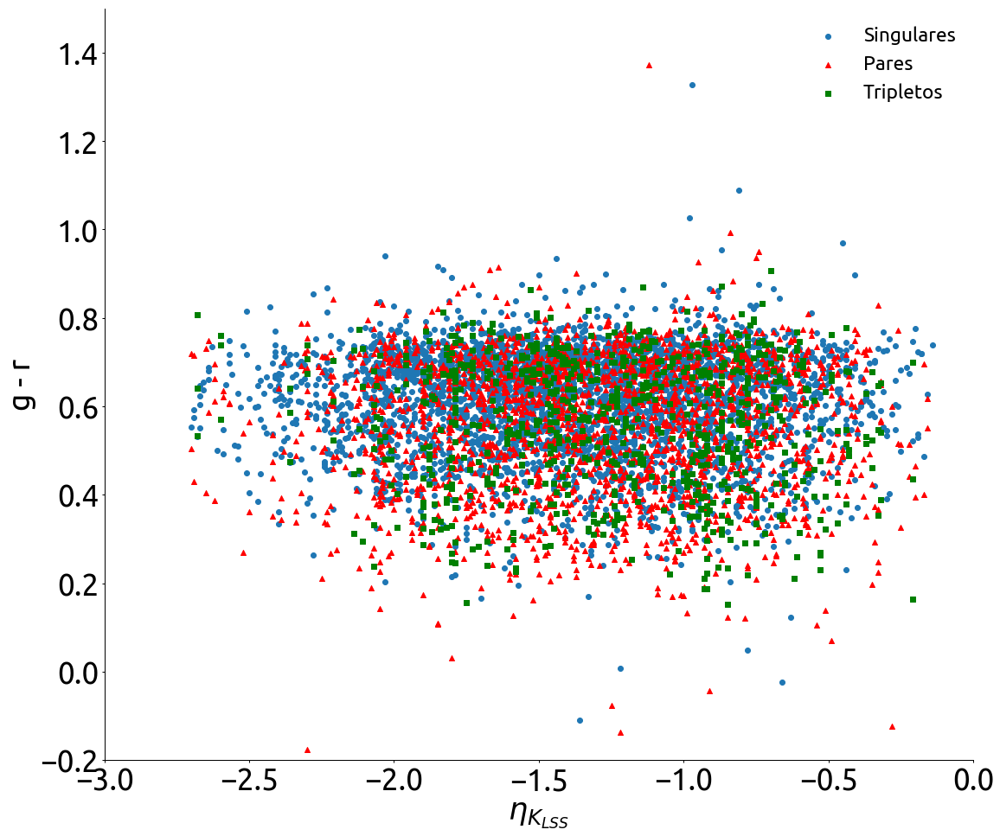

In [39]:
cor_g = sig.absMagG - sig.absMagR
cor_p = sip.absMagG - sip.absMagR
cor_t = sit.absMagG - sit.absMagR

plt.figure()
plt.scatter(sig.eta_k_LSS, cor_g)
plt.scatter(sip.eta_k_LSS, cor_p, color = 'red', marker = '^') # scatter plot
plt.scatter(sit.eta_k_LSS, cor_t, color = 'green', marker = 's') # scatter plot

plt.xlabel("$\eta_{K_{LSS}}$") 
plt.ylabel("g - r") 
plt.title("", fontweight='bold') 
plt.ylim(-0.2,1.5)
plt.xlim(-3,0)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(("Singulares", "Pares", "Tripletos"))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/Propriedades_individuais/eta_vs_cor.png") # Saves the figure


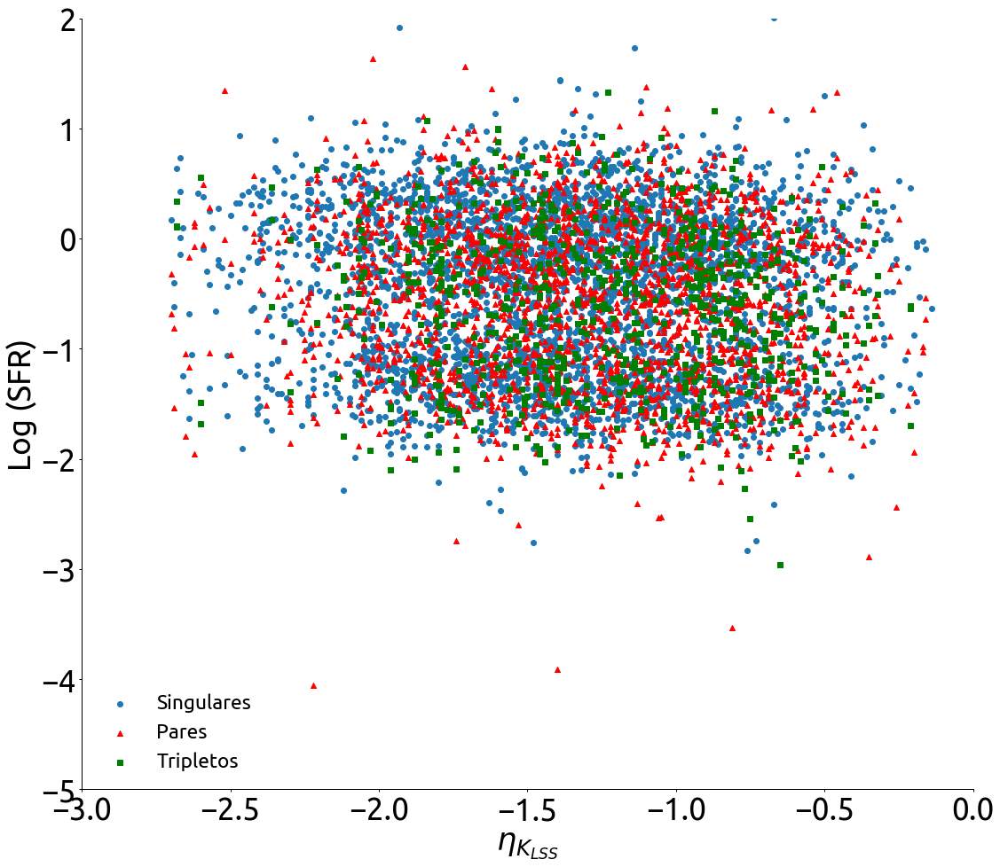

In [40]:
plt.figure()
plt.scatter(sig.eta_k_LSS, sig.sfr_tot_p50)
plt.scatter(sip.eta_k_LSS, sip.sfr_tot_p50, color = 'red', marker = '^') # scatter plot
plt.scatter(sit.eta_k_LSS, sit.sfr_tot_p50, color = 'green', marker = 's') # scatter plot

plt.xlabel("$\eta_{K_{LSS}}$") 
plt.ylabel("Log (SFR)") 
plt.title("", fontweight='bold') 
plt.ylim(-5,2)
plt.xlim(-3,0)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(("Singulares", "Pares", "Tripletos"))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/Propriedades_individuais/eta_vs_SFR.png") # Saves the figure


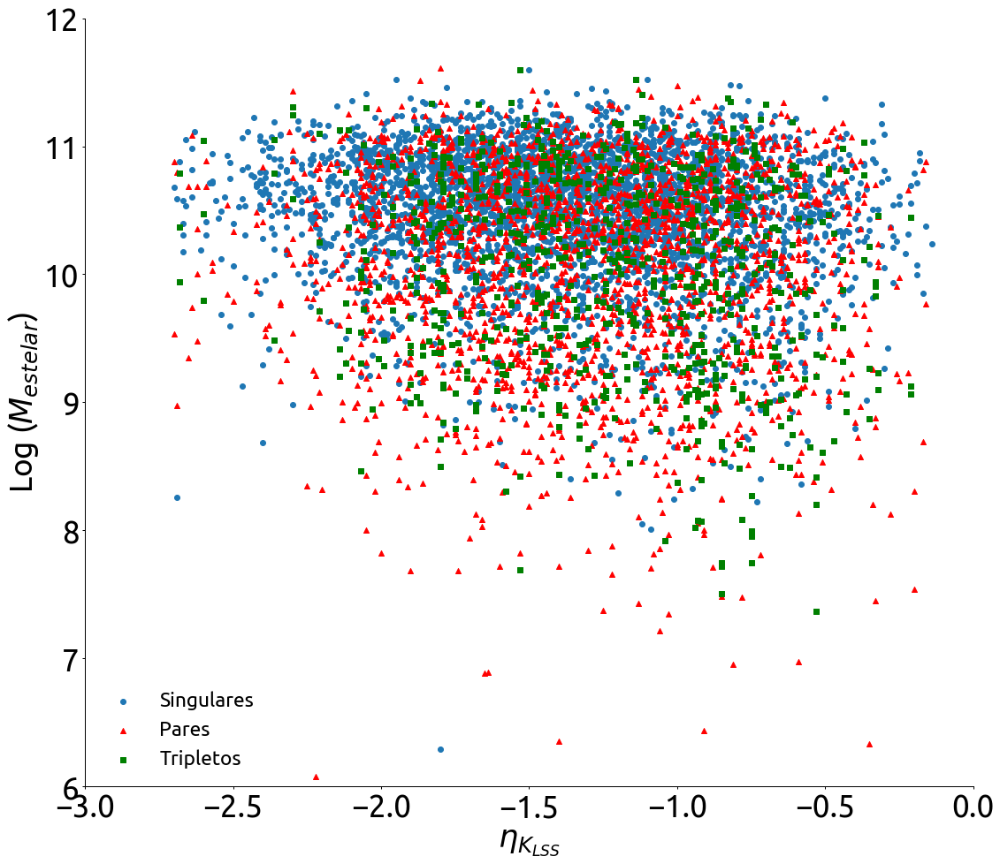

In [41]:
plt.figure()
plt.scatter(sig.eta_k_LSS, sig.lgm_tot_p50)
plt.scatter(sip.eta_k_LSS, sip.lgm_tot_p50, color = 'red', marker = '^') # scatter plot
plt.scatter(sit.eta_k_LSS, sit.lgm_tot_p50, color = 'green', marker = 's') # scatter plot

plt.xlabel("$\eta_{K_{LSS}}$") 
plt.ylabel("Log ($M_{estelar}$)") 
plt.title("", fontweight='bold') 
plt.ylim(6,12)
plt.xlim(-3,0)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(("Singulares", "Pares", "Tripletos"))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/Propriedades_individuais/eta_vs_M.png") # Saves the figure


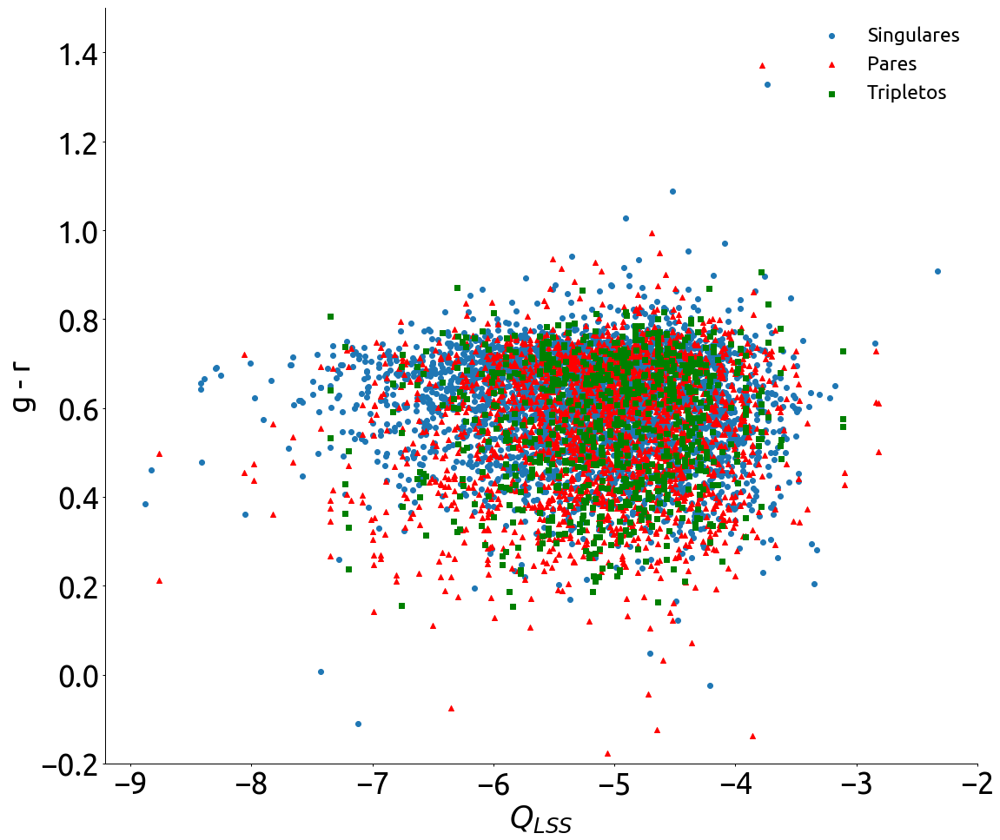

In [42]:
cor_g = sig.absMagG - sig.absMagR
cor_p = sip.absMagG - sip.absMagR
cor_t = sit.absMagG - sit.absMagR

plt.figure()
plt.scatter(sig.Q_LSS, cor_g)
plt.scatter(sip.Q_LSS, cor_p, color = 'red', marker = '^') # scatter plot
plt.scatter(sit.Q_LSS, cor_t, color = 'green', marker = 's') # scatter plot

plt.xlabel("$Q_{LSS}$") 
plt.ylabel("g - r") 
plt.title("", fontweight='bold') 
plt.ylim(-0.2,1.5)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(("Singulares", "Pares", "Tripletos"))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/propriedades_individuais/Qlss_vs_cor.png") # Saves the figure


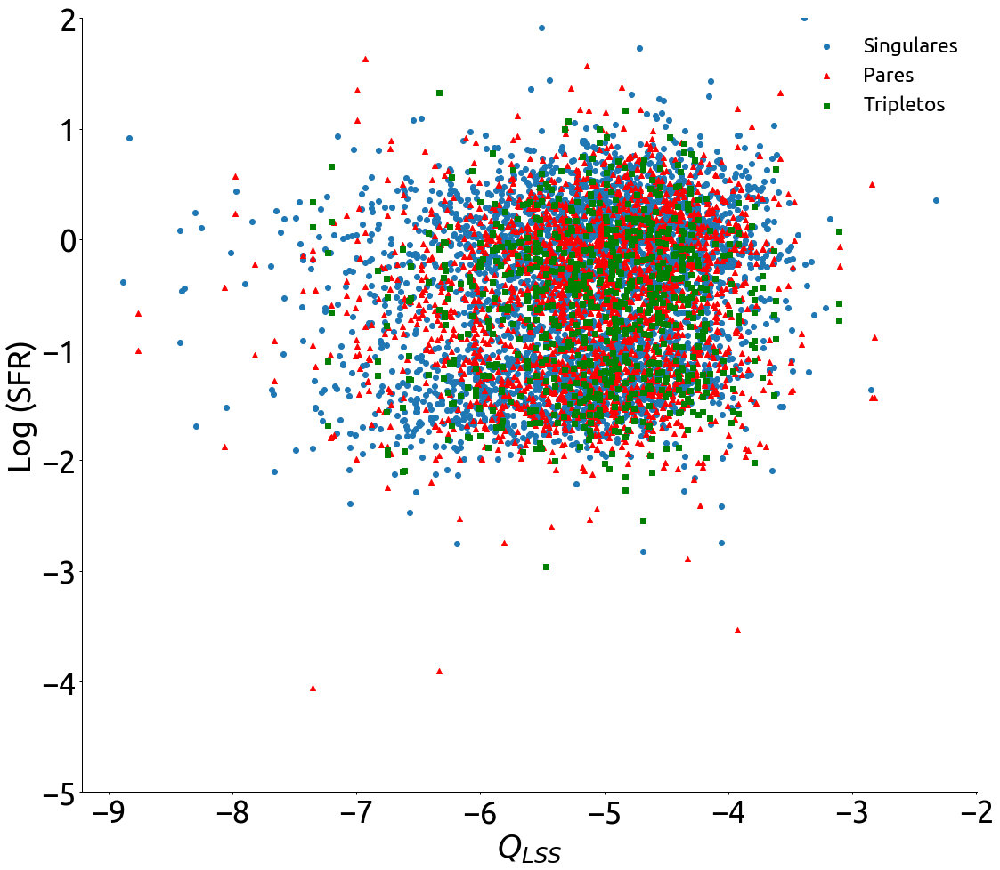

In [43]:
plt.figure()
plt.scatter(sig.Q_LSS, sig.sfr_tot_p50)
plt.scatter(sip.Q_LSS, sip.sfr_tot_p50, color = 'red', marker = '^') # scatter plot
plt.scatter(sit.Q_LSS, sit.sfr_tot_p50, color = 'green', marker = 's') # scatter plot

plt.xlabel("$Q_{LSS}$") 
plt.ylabel("Log (SFR)") 
plt.title("", fontweight='bold') 
plt.ylim(-5,2)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(("Singulares", "Pares", "Tripletos"))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/propriedades_individuais/Qlss_vs_SFR.png") # Saves the figure


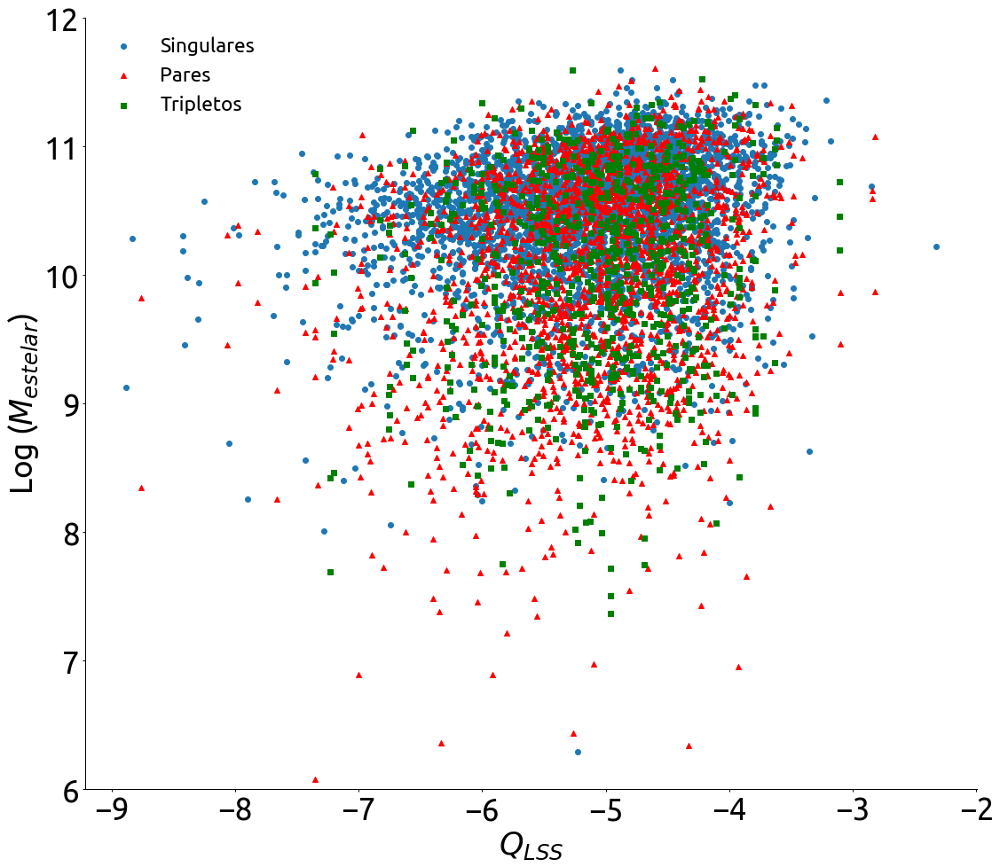

In [44]:
plt.figure()

plt.scatter(sig.Q_LSS, sig.lgm_tot_p50)
plt.scatter(sip.Q_LSS, sip.lgm_tot_p50, color = 'red', marker = '^') # scatter plot
plt.scatter(sit.Q_LSS, sit.lgm_tot_p50, color = 'green', marker = 's') # scatter plot

plt.xlabel("$Q_{LSS}$") 
plt.ylabel("Log ($M_{estelar}$)") 
plt.title("", fontweight='bold') 
plt.ylim(6,12)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(("Singulares", "Pares", "Tripletos"))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/propriedades_individuais/Qlss_vs_M.png") # Saves the figure


Text(0,0.5,'g - r')

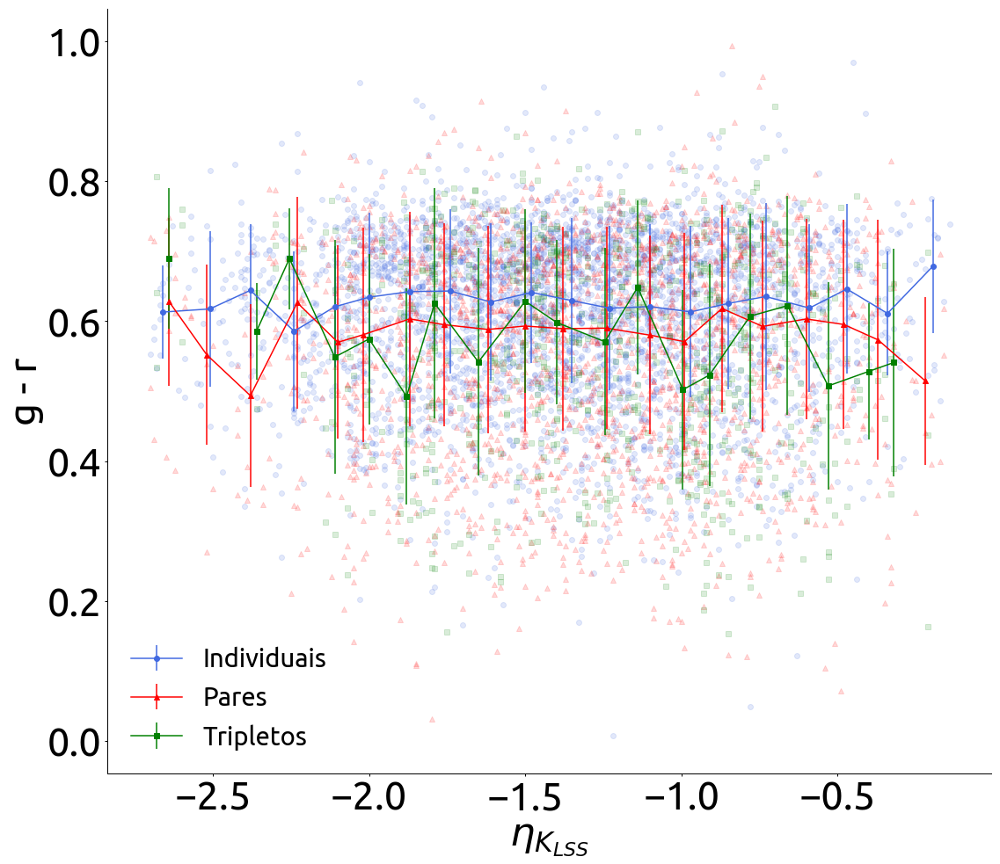

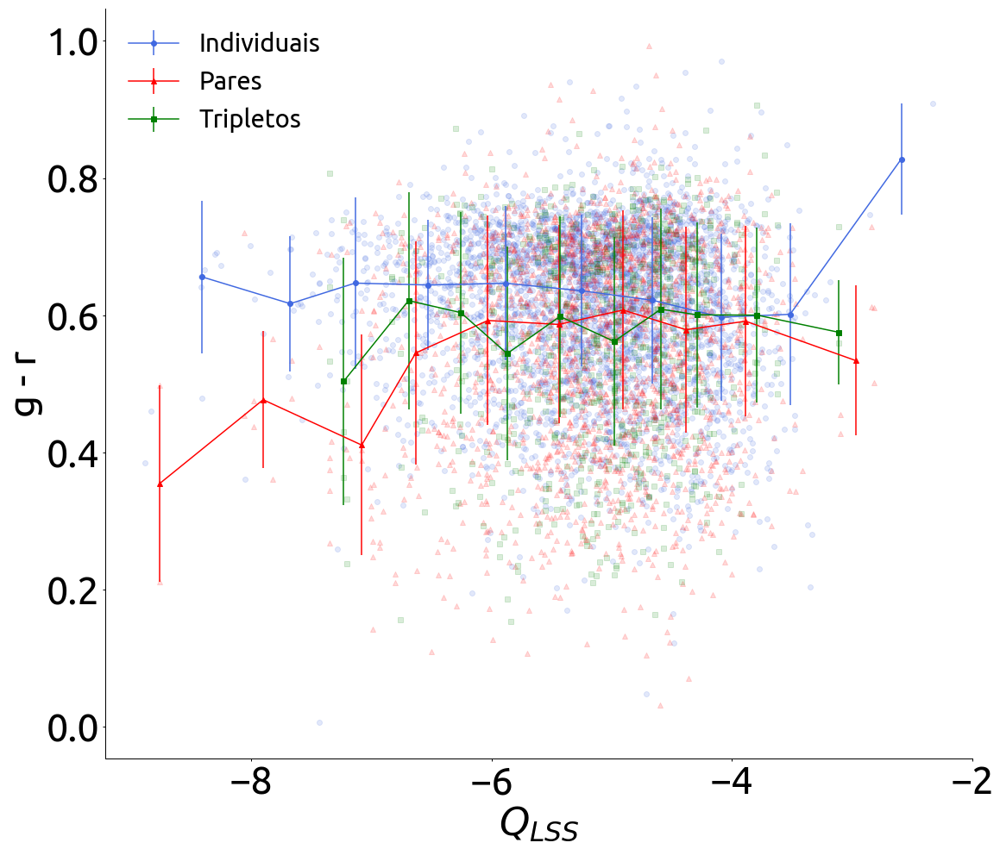

In [6]:
from scipy.stats import binned_statistic
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sit = sit[sit.eta_k_LSS > -100];sit = sit[sit.g_r > 0]; sit = sit[sit.g_r < 1]
sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
sip = sip[sip.g_r < 1]; sip = sip[sip.g_r > 0]


plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
n_bins = 20
erro = []
y = [sig.g_r, sip.g_r, sit.g_r]
x = [sig.eta_k_LSS, sip.eta_k_LSS, sit.eta_k_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)

    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$\eta_{K_{LSS}}$")
plt.ylabel('g - r')
plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/Propriedades_individuais/eta(bins)_vs_cor.png')

###################################################################################################################

from scipy.stats import binned_statistic
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sit = sit[sit.g_r > 0]; sit = sit[sit.g_r < 1]
sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
sip = sip[sip.g_r < 1]; sip = sip[sip.g_r > 0]

n_bins = 10
plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
erro = []
y = [sig.g_r, sip.g_r, sit.g_r]
x = [sig.Q_LSS, sip.Q_LSS, sit.Q_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)
    
    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])    
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$Q_{LSS}$")
plt.ylabel('g - r')
#plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/propriedades_individuais/Qlss(bins)_vs_cor.png')

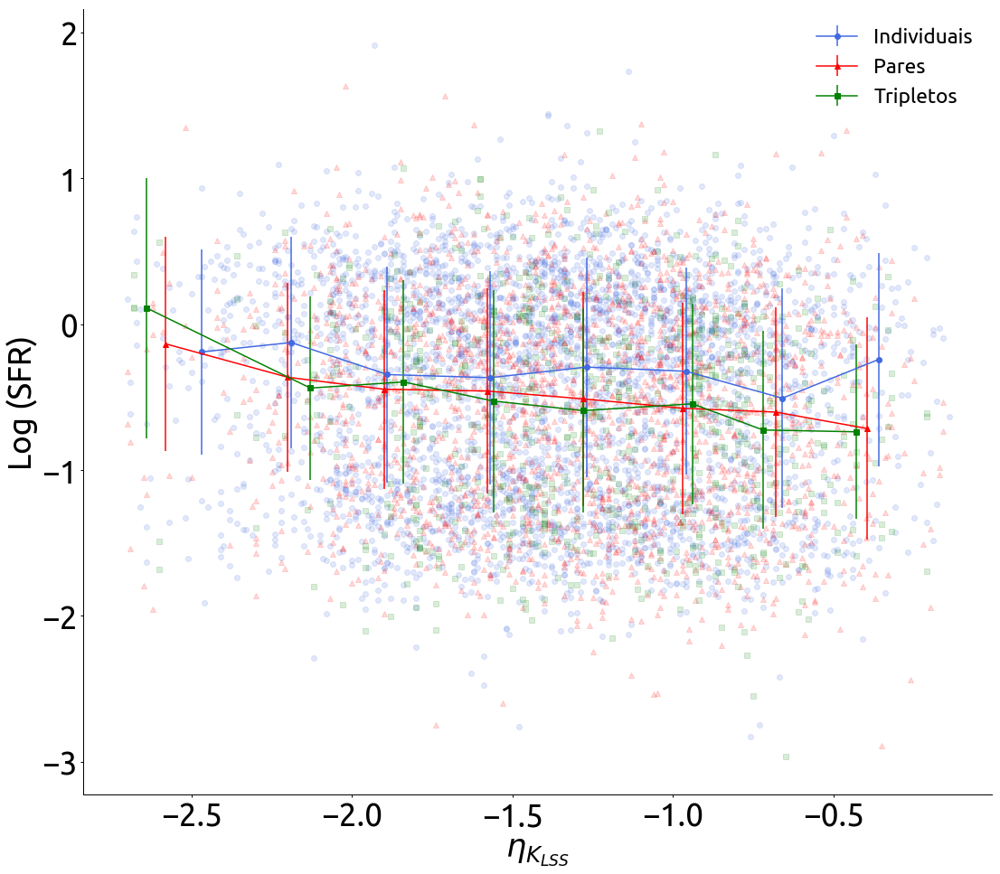

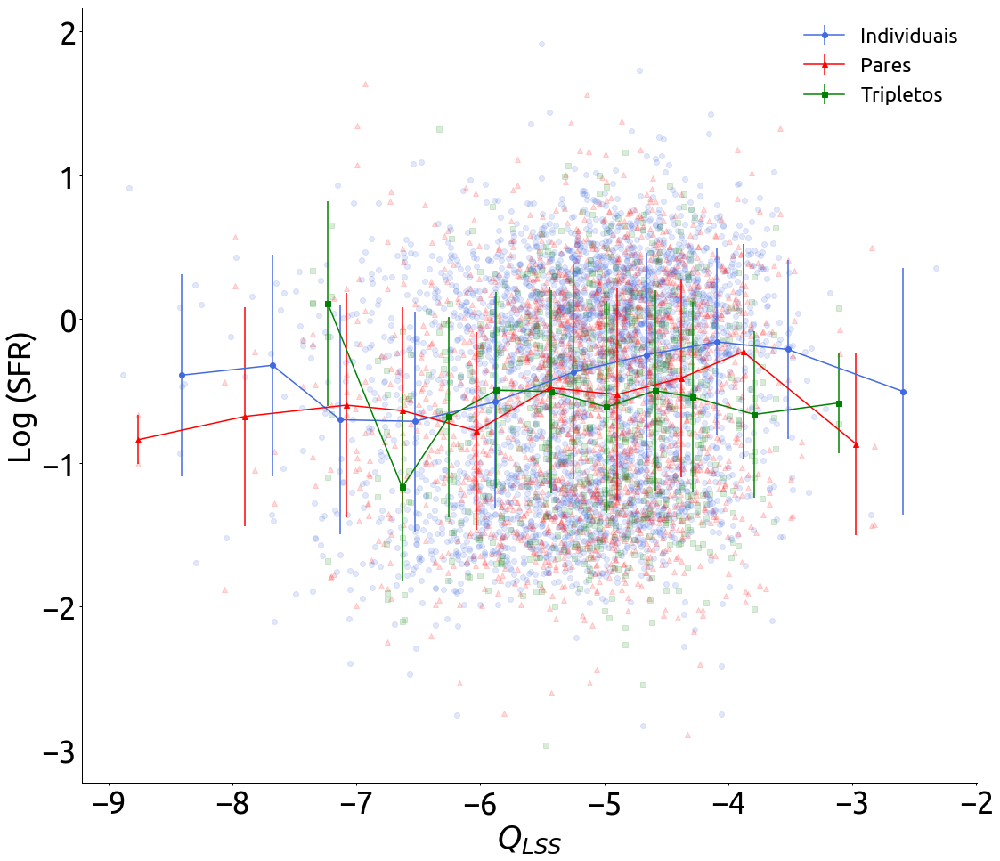

In [46]:
from scipy.stats import binned_statistic
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sit = sit[sit.eta_k_LSS > -9000];sit = sit[sit.sfr_tot_p50 > -3]; sit = sit[sit.sfr_tot_p50 < 2]
sig = sig[sig.sfr_tot_p50 < 2];sig = sig[sig.sfr_tot_p50 > -3]
sip = sip[sip.sfr_tot_p50 < 2]; sip = sip[sip.sfr_tot_p50 > -3]


plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
n_bins = 8
erro = []
y = [sig.sfr_tot_p50, sip.sfr_tot_p50, sit.sfr_tot_p50]
x = [sig.eta_k_LSS, sip.eta_k_LSS, sit.eta_k_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)

    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$\eta_{K_{LSS}}$")
plt.ylabel("Log (SFR)")
plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/Propriedades_individuais/eta(bins)_vs_SFR.png')

###################################################################################################################

sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sit = sit[sit.sfr_tot_p50 > -3]; sit = sit[sit.sfr_tot_p50 < 2]
sig = sig[sig.sfr_tot_p50 < 2];sig = sig[sig.sfr_tot_p50 > -3]
sip = sip[sip.sfr_tot_p50 < 2]; sip = sip[sip.sfr_tot_p50 > -3]

n_bins = 10

plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
erro = []
y = [sig.sfr_tot_p50, sip.sfr_tot_p50, sit.sfr_tot_p50]
x = [sig.Q_LSS, sip.Q_LSS, sit.Q_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)

    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$Q_{LSS}$")
plt.ylabel("Log (SFR)")
plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/propriedades_individuais/Qlss(bins)_vs_SFR.png')

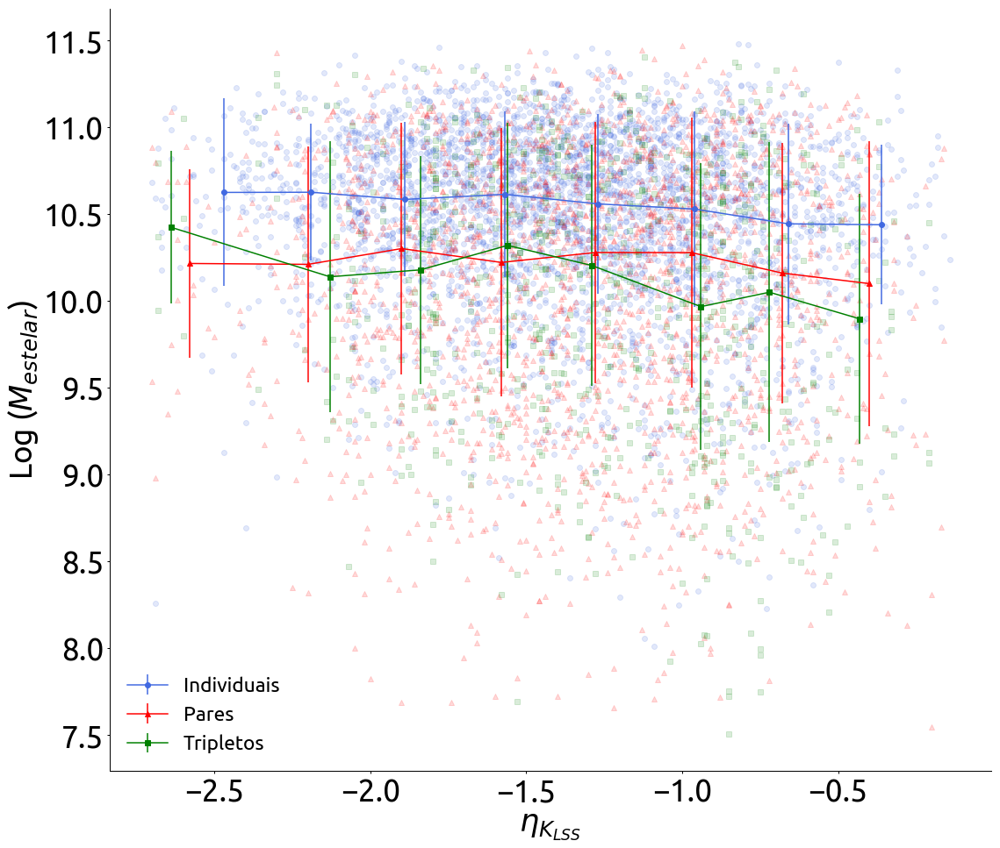

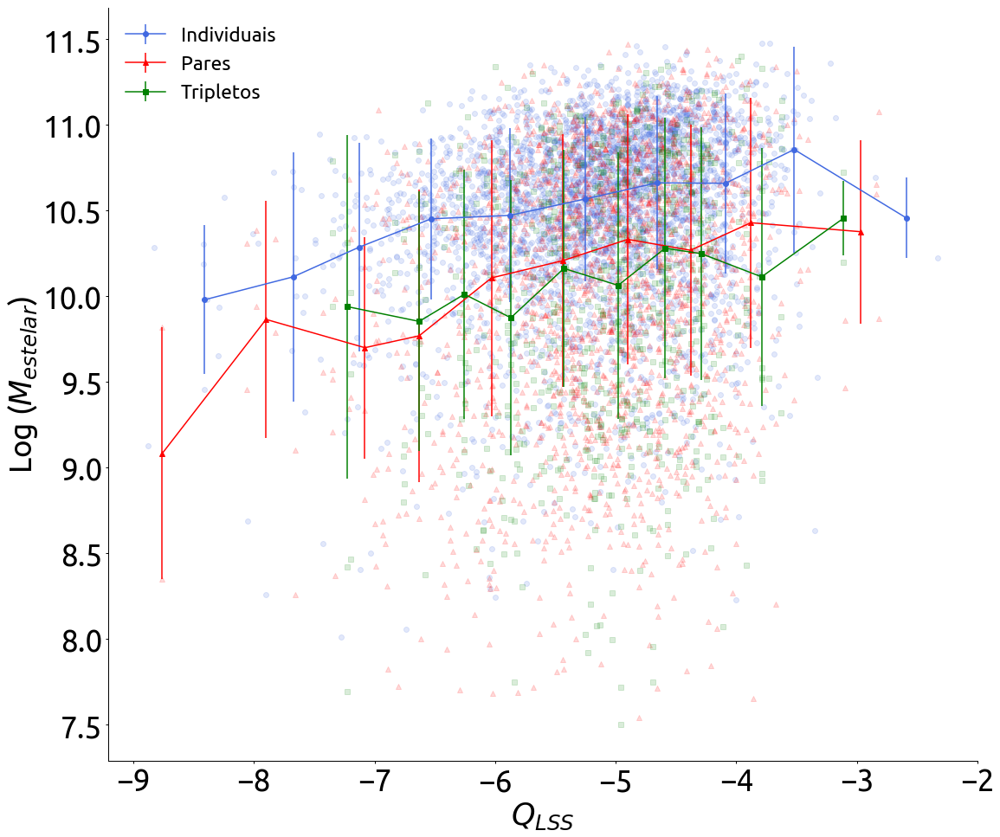

In [47]:
from scipy.stats import binned_statistic
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig[sig.lgm_tot_p50 < 11.5];sig = sig[sig.lgm_tot_p50 > 7.5]
sip = sip[sip.lgm_tot_p50 < 11.5]; sip = sip[sip.lgm_tot_p50 > 7.5]
sit = sit[sit.eta_k_LSS > -9000];sit = sit[sit.lgm_tot_p50 < 11.5]; sit = sit[sit.lgm_tot_p50 > 7.5]

plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
n_bins = 8
erro = []
y = [sig.lgm_tot_p50, sip.lgm_tot_p50, sit.lgm_tot_p50]
x = [sig.eta_k_LSS, sip.eta_k_LSS, sit.eta_k_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)
    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$\eta_{K_{LSS}}$")
plt.ylabel("Log ($M_{estelar}$)")
plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/Propriedades_individuais/eta(bins)_vs_M.png')

###################################################################################################################

sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig[sig.lgm_tot_p50 < 11.5];sig = sig[sig.lgm_tot_p50 > 7.5]
sip = sip[sip.lgm_tot_p50 < 11.5]; sip = sip[sip.lgm_tot_p50 > 7.5]
sit = sit[sit.lgm_tot_p50 < 11.5]; sit = sit[sit.lgm_tot_p50 > 7.5]

n_bins = 10

plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
erro = []
y = [sig.lgm_tot_p50, sip.lgm_tot_p50, sit.lgm_tot_p50]
x = [sig.Q_LSS, sip.Q_LSS, sit.Q_LSS]
    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)

    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$Q_{LSS}$")
plt.ylabel("Log ($M_{estelar}$)")
plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/propriedades_individuais/Qlss(bins)_vs_M.png')


/home/douglas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: read_table is deprecated, use read_csv instead.
  import sys
/home/douglas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:141: FutureWarning: read_table is deprecated, use read_csv instead.
/home/douglas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:274: FutureWarning: read_table is deprecated, use read_csv instead.


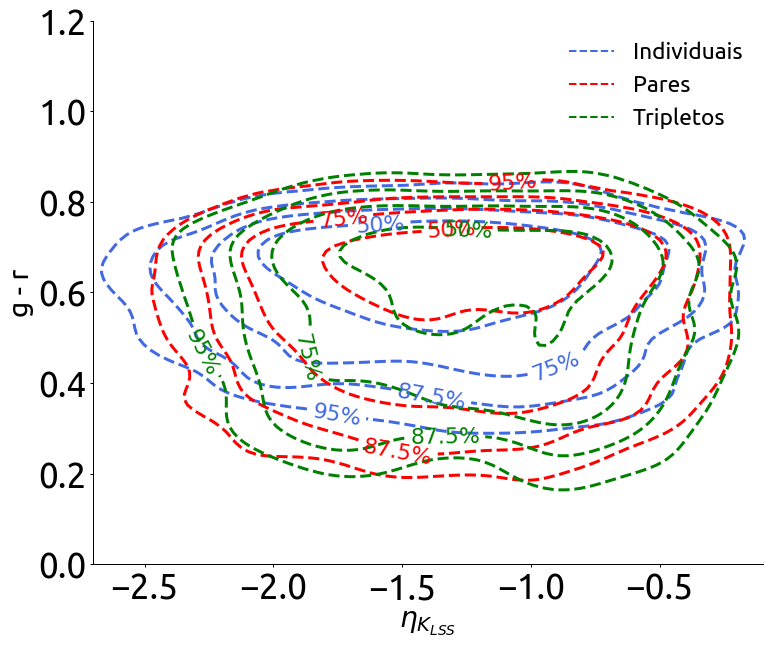

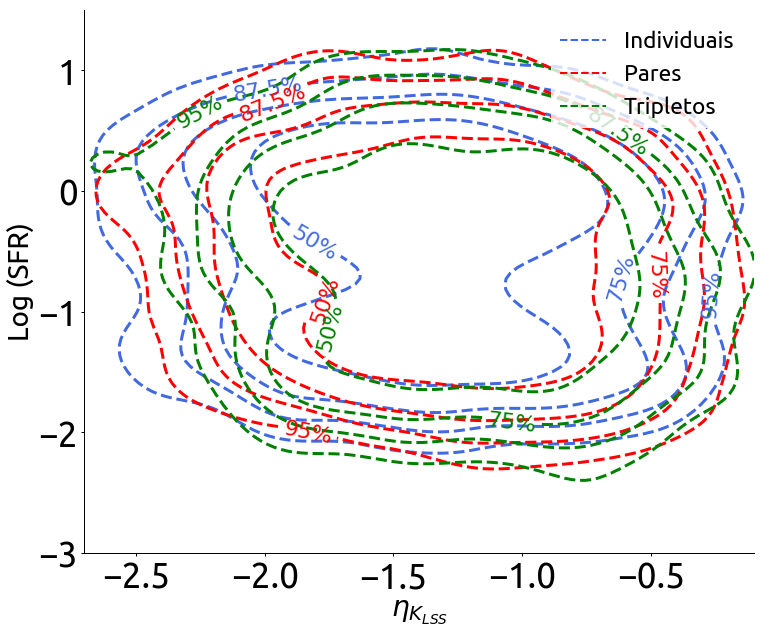

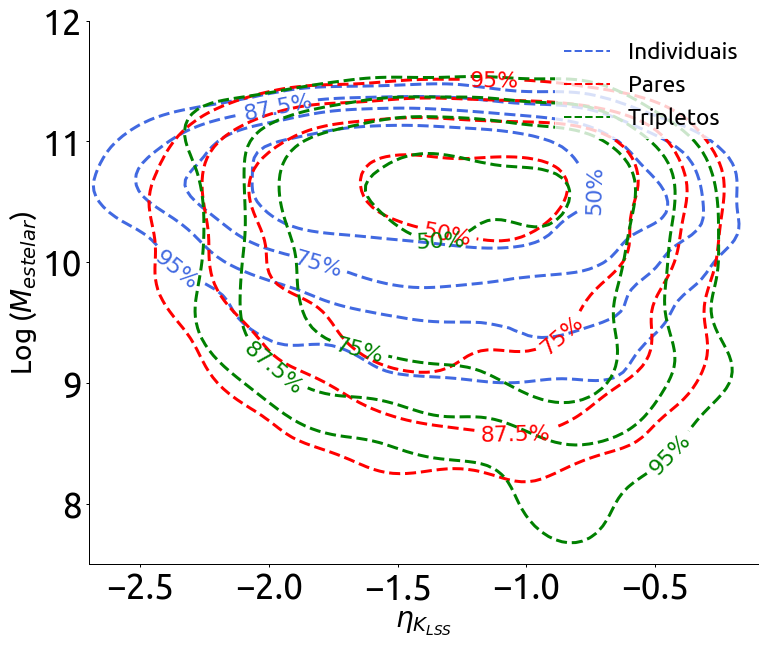

In [5]:
import scipy.stats as st

#####################################################  eta vs Cor #################################################
#####################################################  eta vs Cor #################################################
#####################################################  eta vs Cor #################################################

sig = pd.read_table("/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sit = sit[sit.eta_k_LSS > -100];sit = sit[sit.g_r > 0]; sit = sit[sit.g_r < 1]
sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
sip = sip[sip.g_r < 1]; sip = sip[sip.g_r > 0]


sig_spi_mlk5 = sig 
sip_spi_mlk5 = sip 
sit_spi_mlk5 = sit 

####################################
#Para galáxias individuais
sig_spi_index_mlk5 = np.array([sig_spi_mlk5.eta_k_LSS, sig_spi_mlk5.g_r])
sig_spi_index_mlk5 = sig_spi_index_mlk5.T

xs_index_mlk5 = sig_spi_index_mlk5[:, 0]
ys_index_mlk5 = sig_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -2.7, -.1
ymin_index, ymax_index = 0, 1.2

sig_xx_index, sig_yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
sig_positions = np.vstack([sig_xx_index.ravel(), sig_yy_index.ravel()])

values_sig_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sig_spi_index_mlk5= st.gaussian_kde(values_sig_spi_index_mlk5)
f_sig_spi_index_mlk5 = np.reshape(kernel_sig_spi_index_mlk5(sig_positions).T, sig_xx_index.shape)

maximum_sk5 = np.max(f_sig_spi_index_mlk5)

[L1_sk5,L2_sk5,L3_sk5,L4_sk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_sk5 = [L4_sk5,L3_sk5,L2_sk5,L1_sk5]

####################################
#Para galáxias em Pares
sip_spi_index_mlk5 = np.array([sip_spi_mlk5.eta_k_LSS, sip_spi_mlk5.g_r])
sip_spi_index_mlk5 = sip_spi_index_mlk5.T

xs_index_mlk5 = sip_spi_index_mlk5[:, 0]
ys_index_mlk5 = sip_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -2.7, -.1
ymin_index, ymax_index = 0, 1.2

xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sip_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sip_spi_index_mlk5= st.gaussian_kde(values_sip_spi_index_mlk5)
f_sip_spi_index_mlk5 = np.reshape(kernel_sip_spi_index_mlk5(positions).T, xx_index.shape)

maximum_pk5 = np.max(f_sip_spi_index_mlk5)

[L1_pk5,L2_pk5,L3_pk5,L4_pk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_pk5 = [L4_pk5,L3_pk5,L2_pk5,L1_pk5]


####################################
#Para galáxias em Tripletos
sit_spi_index_mlk5 = np.array([sit_spi_mlk5.eta_k_LSS, sit_spi_mlk5.g_r])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

sit_spi_index_mlk5 = np.array([sit_spi_mlk5.eta_k_LSS, sit_spi_mlk5.g_r])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

xs_index_mlk5 = sit_spi_index_mlk5[:, 0]
ys_index_mlk5 = sit_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -2.7, -.1
ymin_index, ymax_index = 0, 1.2
xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sit_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sit_spi_index_mlk5= st.gaussian_kde(values_sit_spi_index_mlk5)
f_sit_spi_index_mlk5 = np.reshape(kernel_sit_spi_index_mlk5(positions).T, xx_index.shape)

maximum_tk5 = np.max(f_sit_spi_index_mlk5)

[L1_tk5,L2_tk5,L3_tk5,L4_tk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_tk5 = [L4_tk5,L3_tk5,L2_tk5,L1_tk5]


######## CONTOUT PLOT

fig = plt.figure()
ax = fig.gca()
plt.gca().set_facecolor('white')
ax.set_xlim(xmin_index, xmax_index)
ax.set_ylim(ymin_index, ymax_index)

# Contour plot
#plt.grid()


## LEMBRAR --> OS xx_index e yy_index tem o memso nome, então todos os plots estão sendo feitos usando o último valor calculado deles, precisa mudar o nome
cset_sig = ax.contour(xx_index, yy_index, f_sig_spi_index_mlk5, levels = levels_sk5, 
                   colors='royalblue', linestyles = 'dashed', linewidths = 3)
cset_sip = ax.contour(xx_index, yy_index, f_sip_spi_index_mlk5, levels = levels_pk5, 
                   colors='red', linestyles = 'dashed', linewidths = 3)
cset_sit = ax.contour(xx_index, yy_index, f_sit_spi_index_mlk5, levels = levels_tk5, 
                   colors='green', linestyles = 'dashed', linewidths = 3)

# Label plot
ax.set_xlabel("$\eta_{K_{LSS}}$") 
ax.set_ylabel('g - r')

fmtdictsk20_sig = {L1_sk5:r'$50\%$',L2_sk5:r'$75\%$',L3_sk5: r'$87.5\%$', L4_sk5:r'$95\%$'}
fmtdictek20_sip = {L1_pk5:r'$50\%$',L2_pk5:r'$75\%$',L3_pk5: r'$87.5\%$', L4_pk5:r'$95\%$'}
fmtdictek20_sit = {L1_tk5:r'$50\%$',L2_tk5:r'$75\%$',L3_tk5: r'$87.5\%$', L4_tk5:r'$95\%$'}

plt.clabel(cset_sig, fmt=fmtdictsk20_sig, inline=True, fontsize=22)
plt.clabel(cset_sip, fmt=fmtdictek20_sip, inline=True, fontsize=22)
plt.clabel(cset_sit, fmt=fmtdictek20_sit, inline=True, fontsize=22)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

individuais = plt.Line2D((0, 1), (0, 0), color='royalblue', linestyle='--', linewidth=2)
pares = plt.Line2D((0, 1), (0, 0), color='red', linestyle='--', linewidth=2)
tripletos = plt.Line2D((0, 1), (0, 0), color='green', linestyle='--', linewidth=2)

plt.legend([individuais, pares, tripletos],
           ['Individuais', 'Pares', 'Tripletos'])
#plt.savefig('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/Propriedades_individuais/eta_vs_cor-contorno.png')

#####################################################  eta vs SFR #################################################
#####################################################  eta vs SFR #################################################
#####################################################  eta vs SFR #################################################
sig = pd.read_table("/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sit = sit[sit.eta_k_LSS > -9000];sit = sit[sit.sfr_tot_p50 > -3]; sit = sit[sit.sfr_tot_p50 < 2]
sig = sig[sig.sfr_tot_p50 < 2];sig = sig[sig.sfr_tot_p50 > -3]
sip = sip[sip.sfr_tot_p50 < 2]; sip = sip[sip.sfr_tot_p50 > -3]

sig_spi_mlk5 = sig 
sip_spi_mlk5 = sip 
sit_spi_mlk5 = sit 

####################################
#Para galáxias individuais
sig_spi_index_mlk5 = np.array([sig_spi_mlk5.eta_k_LSS, sig_spi_mlk5.sfr_tot_p50])
sig_spi_index_mlk5 = sig_spi_index_mlk5.T

xs_index_mlk5 = sig_spi_index_mlk5[:, 0]
ys_index_mlk5 = sig_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -2.7, -.1
ymin_index, ymax_index = -3, 1.5

sig_xx_index, sig_yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
sig_positions = np.vstack([sig_xx_index.ravel(), sig_yy_index.ravel()])

values_sig_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sig_spi_index_mlk5= st.gaussian_kde(values_sig_spi_index_mlk5)
f_sig_spi_index_mlk5 = np.reshape(kernel_sig_spi_index_mlk5(sig_positions).T, sig_xx_index.shape)

maximum_sk5 = np.max(f_sig_spi_index_mlk5)

[L1_sk5,L2_sk5,L3_sk5,L4_sk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_sk5 = [L4_sk5,L3_sk5,L2_sk5,L1_sk5]

####################################
#Para galáxias em Pares
sip_spi_index_mlk5 = np.array([sip_spi_mlk5.eta_k_LSS, sip_spi_mlk5.sfr_tot_p50])
sip_spi_index_mlk5 = sip_spi_index_mlk5.T

xs_index_mlk5 = sip_spi_index_mlk5[:, 0]
ys_index_mlk5 = sip_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -2.7, -.1
ymin_index, ymax_index = -3, 1.5
xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sip_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sip_spi_index_mlk5= st.gaussian_kde(values_sip_spi_index_mlk5)
f_sip_spi_index_mlk5 = np.reshape(kernel_sip_spi_index_mlk5(positions).T, xx_index.shape)

maximum_pk5 = np.max(f_sip_spi_index_mlk5)

[L1_pk5,L2_pk5,L3_pk5,L4_pk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_pk5 = [L4_pk5,L3_pk5,L2_pk5,L1_pk5]


####################################
#Para galáxias em Tripletos
sit_spi_index_mlk5 = np.array([sit_spi_mlk5.eta_k_LSS, sit_spi_mlk5.sfr_tot_p50])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

sit_spi_index_mlk5 = np.array([sit_spi_mlk5.eta_k_LSS, sit_spi_mlk5.sfr_tot_p50])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

xs_index_mlk5 = sit_spi_index_mlk5[:, 0]
ys_index_mlk5 = sit_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -2.7, -.1
ymin_index, ymax_index = -3, 1.5

xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sit_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sit_spi_index_mlk5= st.gaussian_kde(values_sit_spi_index_mlk5)
f_sit_spi_index_mlk5 = np.reshape(kernel_sit_spi_index_mlk5(positions).T, xx_index.shape)

maximum_tk5 = np.max(f_sit_spi_index_mlk5)

[L1_tk5,L2_tk5,L3_tk5,L4_tk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_tk5 = [L4_tk5,L3_tk5,L2_tk5,L1_tk5]


######## CONTOUT PLOT

fig = plt.figure()
ax = fig.gca()
plt.gca().set_facecolor('white')
ax.set_xlim(xmin_index, xmax_index)
ax.set_ylim(ymin_index, ymax_index)

# Contour plot
#plt.grid()


## LEMBRAR --> OS xx_index e yy_index tem o memso nome, então todos os plots estão sendo feitos usando o último valor calculado deles, precisa mudar o nome
cset_sig = ax.contour(xx_index, yy_index, f_sig_spi_index_mlk5, levels = levels_sk5, 
                   colors='royalblue', linestyles = 'dashed', linewidths = 3)
cset_sip = ax.contour(xx_index, yy_index, f_sip_spi_index_mlk5, levels = levels_pk5, 
                   colors='red', linestyles = 'dashed', linewidths = 3)
cset_sit = ax.contour(xx_index, yy_index, f_sit_spi_index_mlk5, levels = levels_tk5, 
                   colors='green', linestyles = 'dashed', linewidths = 3)

# Label plot
ax.set_xlabel("$\eta_{K_{LSS}}$") 
ax.set_ylabel('Log (SFR)')

fmtdictsk20_sig = {L1_sk5:r'$50\%$',L2_sk5:r'$75\%$',L3_sk5: r'$87.5\%$', L4_sk5:r'$95\%$'}
fmtdictek20_sip = {L1_pk5:r'$50\%$',L2_pk5:r'$75\%$',L3_pk5: r'$87.5\%$', L4_pk5:r'$95\%$'}
fmtdictek20_sit = {L1_tk5:r'$50\%$',L2_tk5:r'$75\%$',L3_tk5: r'$87.5\%$', L4_tk5:r'$95\%$'}

plt.clabel(cset_sig, fmt=fmtdictsk20_sig, inline=True, fontsize=22)
plt.clabel(cset_sip, fmt=fmtdictek20_sip, inline=True, fontsize=22)
plt.clabel(cset_sit, fmt=fmtdictek20_sit, inline=True, fontsize=22)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

#plt.title('Machine Learning k5: 95% Overall Accuracy')
individuais = plt.Line2D((0, 1), (0, 0), color='royalblue', linestyle='--', linewidth=2)
pares = plt.Line2D((0, 1), (0, 0), color='red', linestyle='--', linewidth=2)
tripletos = plt.Line2D((0, 1), (0, 0), color='green', linestyle='--', linewidth=2)

plt.legend([individuais, pares, tripletos],
           ['Individuais', 'Pares', 'Tripletos'])
#plt.savefig('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/Propriedades_individuais/eta_vs_SFR-contorno.png')
#####################################################  eta vs Massa ###############################################
#####################################################  eta vs Massa ###############################################
#####################################################  eta vs Massa ###############################################
sig = pd.read_table("/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig[sig.lgm_tot_p50 < 11.5];sig = sig[sig.lgm_tot_p50 > 7.5]
sip = sip[sip.lgm_tot_p50 < 11.5]; sip = sip[sip.lgm_tot_p50 > 7.5]
sit = sit[sit.eta_k_LSS > -9000];sit = sit[sit.lgm_tot_p50 < 11.5]; sit = sit[sit.lgm_tot_p50 > 7.5]

sig_spi_mlk5 = sig 
sip_spi_mlk5 = sip 
sit_spi_mlk5 = sit 

####################################
#Para galáxias individuais
sig_spi_index_mlk5 = np.array([sig_spi_mlk5.eta_k_LSS, sig_spi_mlk5.lgm_tot_p50])
sig_spi_index_mlk5 = sig_spi_index_mlk5.T

xs_index_mlk5 = sig_spi_index_mlk5[:, 0]
ys_index_mlk5 = sig_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -2.7, -.1
ymin_index, ymax_index = 7.5, 12

sig_xx_index, sig_yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
sig_positions = np.vstack([sig_xx_index.ravel(), sig_yy_index.ravel()])

values_sig_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sig_spi_index_mlk5= st.gaussian_kde(values_sig_spi_index_mlk5)
f_sig_spi_index_mlk5 = np.reshape(kernel_sig_spi_index_mlk5(sig_positions).T, sig_xx_index.shape)

maximum_sk5 = np.max(f_sig_spi_index_mlk5)

[L1_sk5,L2_sk5,L3_sk5,L4_sk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_sk5 = [L4_sk5,L3_sk5,L2_sk5,L1_sk5]

####################################
#Para galáxias em Pares
sip_spi_index_mlk5 = np.array([sip_spi_mlk5.eta_k_LSS, sip_spi_mlk5.lgm_tot_p50])
sip_spi_index_mlk5 = sip_spi_index_mlk5.T

xs_index_mlk5 = sip_spi_index_mlk5[:, 0]
ys_index_mlk5 = sip_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -2.7, -.1
ymin_index, ymax_index = 7.5, 12

xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sip_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sip_spi_index_mlk5= st.gaussian_kde(values_sip_spi_index_mlk5)
f_sip_spi_index_mlk5 = np.reshape(kernel_sip_spi_index_mlk5(positions).T, xx_index.shape)

maximum_pk5 = np.max(f_sip_spi_index_mlk5)

[L1_pk5,L2_pk5,L3_pk5,L4_pk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_pk5 = [L4_pk5,L3_pk5,L2_pk5,L1_pk5]


####################################
#Para galáxias em Tripletos
sit_spi_index_mlk5 = np.array([sit_spi_mlk5.eta_k_LSS, sit_spi_mlk5.lgm_tot_p50])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

sit_spi_index_mlk5 = np.array([sit_spi_mlk5.eta_k_LSS, sit_spi_mlk5.lgm_tot_p50])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

xs_index_mlk5 = sit_spi_index_mlk5[:, 0]
ys_index_mlk5 = sit_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -2.7, -.1
ymin_index, ymax_index = 7.5, 12

xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sit_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sit_spi_index_mlk5= st.gaussian_kde(values_sit_spi_index_mlk5)
f_sit_spi_index_mlk5 = np.reshape(kernel_sit_spi_index_mlk5(positions).T, xx_index.shape)

maximum_tk5 = np.max(f_sit_spi_index_mlk5)

[L1_tk5,L2_tk5,L3_tk5,L4_tk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_tk5 = [L4_tk5,L3_tk5,L2_tk5,L1_tk5]


######## CONTOUT PLOT

fig = plt.figure()
ax = fig.gca()
plt.gca().set_facecolor('white')
ax.set_xlim(xmin_index, xmax_index)
ax.set_ylim(ymin_index, ymax_index)

# Contour plot
#plt.grid()


cset_sig = ax.contour(xx_index, yy_index, f_sig_spi_index_mlk5, levels = levels_sk5, 
                   colors='royalblue', linestyles = 'dashed', linewidths = 3)
cset_sip = ax.contour(xx_index, yy_index, f_sip_spi_index_mlk5, levels = levels_pk5, 
                   colors='red', linestyles = 'dashed', linewidths = 3)
cset_sit = ax.contour(xx_index, yy_index, f_sit_spi_index_mlk5, levels = levels_tk5, 
                   colors='green', linestyles = 'dashed', linewidths = 3)

# Label plot
ax.set_xlabel("$\eta_{K_{LSS}}$") 
ax.set_ylabel('Log ($M_{estelar}$)')

fmtdictsk20_sig = {L1_sk5:r'$50\%$',L2_sk5:r'$75\%$',L3_sk5: r'$87.5\%$', L4_sk5:r'$95\%$'}
fmtdictek20_sip = {L1_pk5:r'$50\%$',L2_pk5:r'$75\%$',L3_pk5: r'$87.5\%$', L4_pk5:r'$95\%$'}
fmtdictek20_sit = {L1_tk5:r'$50\%$',L2_tk5:r'$75\%$',L3_tk5: r'$87.5\%$', L4_tk5:r'$95\%$'}

plt.clabel(cset_sig, fmt=fmtdictsk20_sig, inline=True, fontsize=22)
plt.clabel(cset_sip, fmt=fmtdictek20_sip, inline=True, fontsize=22)
plt.clabel(cset_sit, fmt=fmtdictek20_sit, inline=True, fontsize=22)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

#plt.title('Machine Learning k5: 95% Overall Accuracy')
individuais = plt.Line2D((0, 1), (0, 0), color='royalblue', linestyle='--', linewidth=2)
pares = plt.Line2D((0, 1), (0, 0), color='red', linestyle='--', linewidth=2)
tripletos = plt.Line2D((0, 1), (0, 0), color='green', linestyle='--', linewidth=2)

plt.legend([individuais, pares, tripletos],
           ['Individuais', 'Pares', 'Tripletos'])
#plt.savefig('/media/douglas/Pesquisa/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/Propriedades_individuais/eta_vs_Massa-contorno.png')

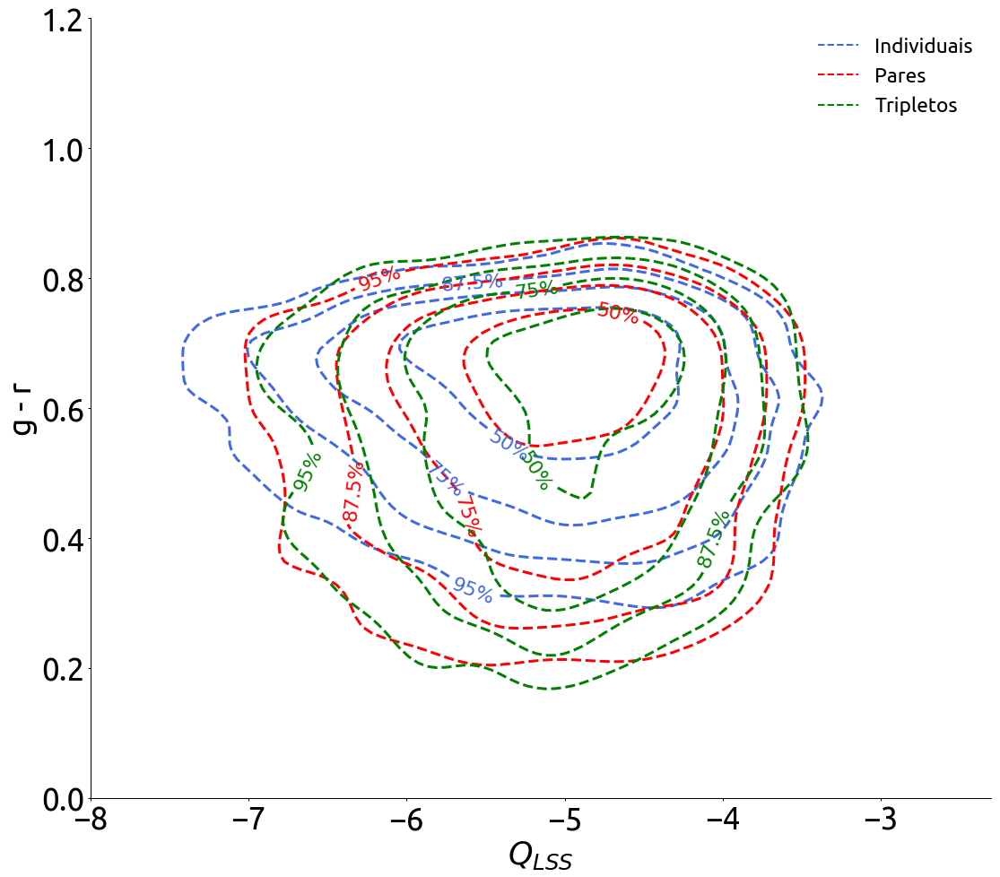

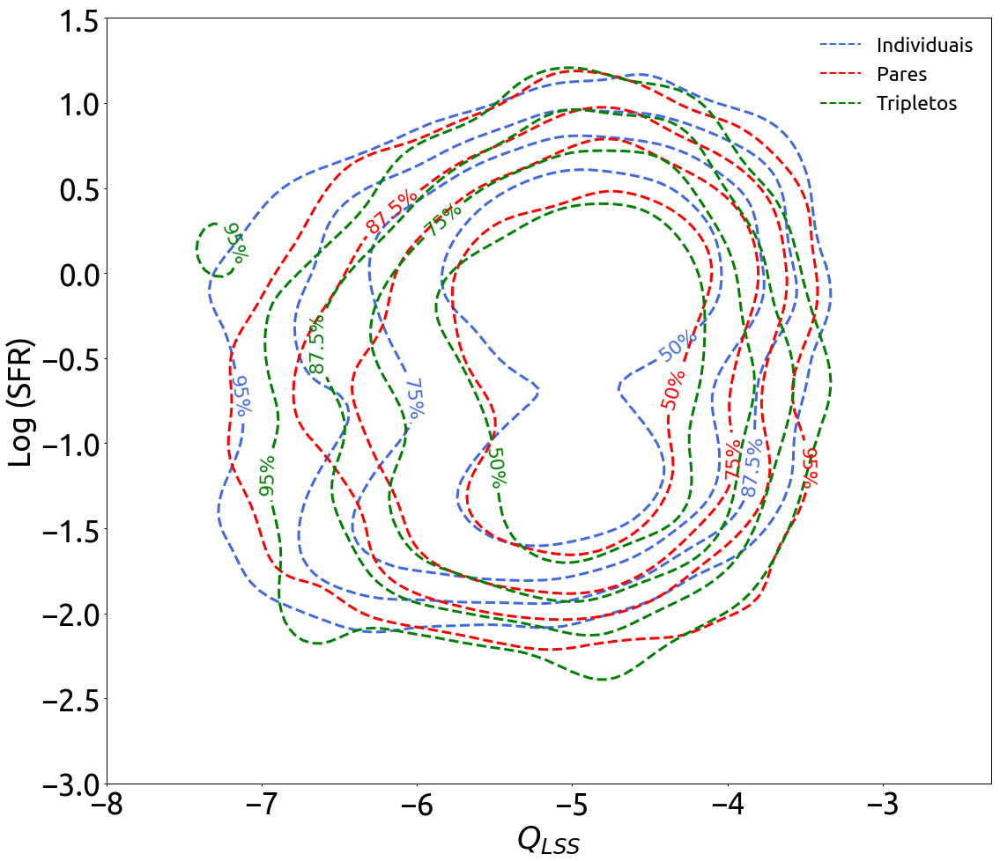

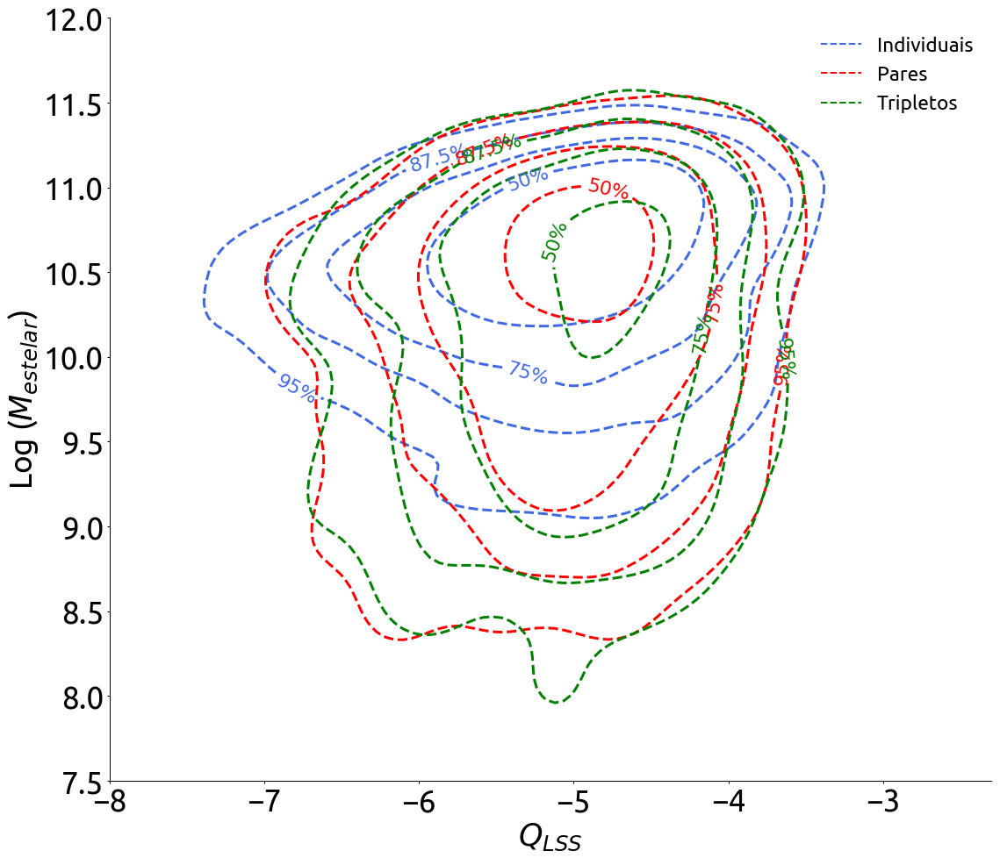

In [55]:
import scipy.stats as st

#####################################################  Q_Lss vs Cor ################################################
#####################################################  Q_Lss vs Cor ################################################
#####################################################  Q_Lss vs Cor ################################################

sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sit = sit[sit.g_r > 0]; sit = sit[sit.g_r < 1]
sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
sip = sip[sip.g_r < 1]; sip = sip[sip.g_r > 0]


sig_spi_mlk5 = sig 
sip_spi_mlk5 = sip 
sit_spi_mlk5 = sit 

####################################
#Para galáxias individuais
sig_spi_index_mlk5 = np.array([sig_spi_mlk5.Q_LSS, sig_spi_mlk5.g_r])
sig_spi_index_mlk5 = sig_spi_index_mlk5.T

xs_index_mlk5 = sig_spi_index_mlk5[:, 0]
ys_index_mlk5 = sig_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -8, -2.3
ymin_index, ymax_index = 0, 1.2

sig_xx_index, sig_yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
sig_positions = np.vstack([sig_xx_index.ravel(), sig_yy_index.ravel()])

values_sig_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sig_spi_index_mlk5= st.gaussian_kde(values_sig_spi_index_mlk5)
f_sig_spi_index_mlk5 = np.reshape(kernel_sig_spi_index_mlk5(sig_positions).T, sig_xx_index.shape)

maximum_sk5 = np.max(f_sig_spi_index_mlk5)

[L1_sk5,L2_sk5,L3_sk5,L4_sk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_sk5 = [L4_sk5,L3_sk5,L2_sk5,L1_sk5]

####################################
#Para galáxias em Pares
sip_spi_index_mlk5 = np.array([sip_spi_mlk5.Q_LSS, sip_spi_mlk5.g_r])
sip_spi_index_mlk5 = sip_spi_index_mlk5.T

xs_index_mlk5 = sip_spi_index_mlk5[:, 0]
ys_index_mlk5 = sip_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -8, -2.3
ymin_index, ymax_index = 0, 1.2

xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sip_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sip_spi_index_mlk5= st.gaussian_kde(values_sip_spi_index_mlk5)
f_sip_spi_index_mlk5 = np.reshape(kernel_sip_spi_index_mlk5(positions).T, xx_index.shape)

maximum_pk5 = np.max(f_sip_spi_index_mlk5)

[L1_pk5,L2_pk5,L3_pk5,L4_pk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_pk5 = [L4_pk5,L3_pk5,L2_pk5,L1_pk5]


####################################
#Para galáxias em Tripletos
sit_spi_index_mlk5 = np.array([sit_spi_mlk5.Q_LSS, sit_spi_mlk5.g_r])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

sit_spi_index_mlk5 = np.array([sit_spi_mlk5.Q_LSS, sit_spi_mlk5.g_r])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

xs_index_mlk5 = sit_spi_index_mlk5[:, 0]
ys_index_mlk5 = sit_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -8, -2.3
ymin_index, ymax_index = 0, 1.2
xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sit_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sit_spi_index_mlk5= st.gaussian_kde(values_sit_spi_index_mlk5)
f_sit_spi_index_mlk5 = np.reshape(kernel_sit_spi_index_mlk5(positions).T, xx_index.shape)

maximum_tk5 = np.max(f_sit_spi_index_mlk5)

[L1_tk5,L2_tk5,L3_tk5,L4_tk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_tk5 = [L4_tk5,L3_tk5,L2_tk5,L1_tk5]


######## CONTOUT PLOT

fig = plt.figure()
ax = fig.gca()
plt.gca().set_facecolor('white')
ax.set_xlim(xmin_index, xmax_index)
ax.set_ylim(ymin_index, ymax_index)

# Contour plot
#plt.grid()


cset_sig = ax.contour(xx_index, yy_index, f_sig_spi_index_mlk5, levels = levels_sk5, 
                   colors='royalblue', linestyles = 'dashed', linewidths = 3)
cset_sip = ax.contour(xx_index, yy_index, f_sip_spi_index_mlk5, levels = levels_pk5, 
                   colors='red', linestyles = 'dashed', linewidths = 3)
cset_sit = ax.contour(xx_index, yy_index, f_sit_spi_index_mlk5, levels = levels_tk5, 
                   colors='green', linestyles = 'dashed', linewidths = 3)

# Label plot
ax.set_xlabel("$Q_{LSS}$") 
ax.set_ylabel('g - r')

fmtdictsk20_sig = {L1_sk5:r'$50\%$',L2_sk5:r'$75\%$',L3_sk5: r'$87.5\%$', L4_sk5:r'$95\%$'}
fmtdictek20_sip = {L1_pk5:r'$50\%$',L2_pk5:r'$75\%$',L3_pk5: r'$87.5\%$', L4_pk5:r'$95\%$'}
fmtdictek20_sit = {L1_tk5:r'$50\%$',L2_tk5:r'$75\%$',L3_tk5: r'$87.5\%$', L4_tk5:r'$95\%$'}

plt.clabel(cset_sig, fmt=fmtdictsk20_sig, inline=True, fontsize=22)
plt.clabel(cset_sip, fmt=fmtdictek20_sip, inline=True, fontsize=22)
plt.clabel(cset_sit, fmt=fmtdictek20_sit, inline=True, fontsize=22)

plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

individuais = plt.Line2D((0, 1), (0, 0), color='royalblue', linestyle='--', linewidth=2)
pares = plt.Line2D((0, 1), (0, 0), color='red', linestyle='--', linewidth=2)
tripletos = plt.Line2D((0, 1), (0, 0), color='green', linestyle='--', linewidth=2)

plt.legend([individuais, pares, tripletos],
           ['Individuais', 'Pares', 'Tripletos'])

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/propriedades_individuais/Qlss_vs_cor-contorno.png')

#####################################################  Q_Lss vs SFR ################################################
#####################################################  Q_Lss vs SFR ################################################
#####################################################  Q_Lss vs SFR ################################################
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sit = sit[sit.sfr_tot_p50 > -3]; sit = sit[sit.sfr_tot_p50 < 2]
sig = sig[sig.sfr_tot_p50 < 2];sig = sig[sig.sfr_tot_p50 > -3]
sip = sip[sip.sfr_tot_p50 < 2]; sip = sip[sip.sfr_tot_p50 > -3]

sig_spi_mlk5 = sig 
sip_spi_mlk5 = sip 
sit_spi_mlk5 = sit 

####################################
#Para galáxias individuais
sig_spi_index_mlk5 = np.array([sig_spi_mlk5.Q_LSS, sig_spi_mlk5.sfr_tot_p50])
sig_spi_index_mlk5 = sig_spi_index_mlk5.T

xs_index_mlk5 = sig_spi_index_mlk5[:, 0]
ys_index_mlk5 = sig_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -8, -2.3
ymin_index, ymax_index = -3, 1.5

sig_xx_index, sig_yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
sig_positions = np.vstack([sig_xx_index.ravel(), sig_yy_index.ravel()])

values_sig_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sig_spi_index_mlk5= st.gaussian_kde(values_sig_spi_index_mlk5)
f_sig_spi_index_mlk5 = np.reshape(kernel_sig_spi_index_mlk5(sig_positions).T, sig_xx_index.shape)

maximum_sk5 = np.max(f_sig_spi_index_mlk5)

[L1_sk5,L2_sk5,L3_sk5,L4_sk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_sk5 = [L4_sk5,L3_sk5,L2_sk5,L1_sk5]

####################################
#Para galáxias em Pares
sip_spi_index_mlk5 = np.array([sip_spi_mlk5.Q_LSS, sip_spi_mlk5.sfr_tot_p50])
sip_spi_index_mlk5 = sip_spi_index_mlk5.T

xs_index_mlk5 = sip_spi_index_mlk5[:, 0]
ys_index_mlk5 = sip_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -8, -2.3
ymin_index, ymax_index = -3, 1.5
xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sip_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sip_spi_index_mlk5= st.gaussian_kde(values_sip_spi_index_mlk5)
f_sip_spi_index_mlk5 = np.reshape(kernel_sip_spi_index_mlk5(positions).T, xx_index.shape)

maximum_pk5 = np.max(f_sip_spi_index_mlk5)

[L1_pk5,L2_pk5,L3_pk5,L4_pk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_pk5 = [L4_pk5,L3_pk5,L2_pk5,L1_pk5]


####################################
#Para galáxias em Tripletos
sit_spi_index_mlk5 = np.array([sit_spi_mlk5.Q_LSS, sit_spi_mlk5.sfr_tot_p50])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

sit_spi_index_mlk5 = np.array([sit_spi_mlk5.Q_LSS, sit_spi_mlk5.sfr_tot_p50])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

xs_index_mlk5 = sit_spi_index_mlk5[:, 0]
ys_index_mlk5 = sit_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -8, -2.3
ymin_index, ymax_index = -3, 1.5

xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sit_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sit_spi_index_mlk5= st.gaussian_kde(values_sit_spi_index_mlk5)
f_sit_spi_index_mlk5 = np.reshape(kernel_sit_spi_index_mlk5(positions).T, xx_index.shape)

maximum_tk5 = np.max(f_sit_spi_index_mlk5)

[L1_tk5,L2_tk5,L3_tk5,L4_tk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_tk5 = [L4_tk5,L3_tk5,L2_tk5,L1_tk5]


######## CONTOUT PLOT

fig = plt.figure()
ax = fig.gca()
plt.gca().set_facecolor('white')
ax.set_xlim(xmin_index, xmax_index)
ax.set_ylim(ymin_index, ymax_index)

# Contour plot
#plt.grid()


## LEMBRAR --> OS xx_index e yy_index tem o memso nome, então todos os plots estão sendo feitos usando o último valor calculado deles, precisa mudar o nome
cset_sig = ax.contour(xx_index, yy_index, f_sig_spi_index_mlk5, levels = levels_sk5, 
                   colors='royalblue', linestyles = 'dashed', linewidths = 3)
cset_sip = ax.contour(xx_index, yy_index, f_sip_spi_index_mlk5, levels = levels_pk5, 
                   colors='red', linestyles = 'dashed', linewidths = 3)
cset_sit = ax.contour(xx_index, yy_index, f_sit_spi_index_mlk5, levels = levels_tk5, 
                   colors='green', linestyles = 'dashed', linewidths = 3)

# Label plot
ax.set_xlabel("$Q_{LSS}$") 
ax.set_ylabel('Log (SFR)')

fmtdictsk20_sig = {L1_sk5:r'$50\%$',L2_sk5:r'$75\%$',L3_sk5: r'$87.5\%$', L4_sk5:r'$95\%$'}
fmtdictek20_sip = {L1_pk5:r'$50\%$',L2_pk5:r'$75\%$',L3_pk5: r'$87.5\%$', L4_pk5:r'$95\%$'}
fmtdictek20_sit = {L1_tk5:r'$50\%$',L2_tk5:r'$75\%$',L3_tk5: r'$87.5\%$', L4_tk5:r'$95\%$'}

plt.clabel(cset_sig, fmt=fmtdictsk20_sig, inline=True, fontsize=22)
plt.clabel(cset_sip, fmt=fmtdictek20_sip, inline=True, fontsize=22)
plt.clabel(cset_sit, fmt=fmtdictek20_sit, inline=True, fontsize=22)

#plt.title('Machine Learning k5: 95% Overall Accuracy')
individuais = plt.Line2D((0, 1), (0, 0), color='royalblue', linestyle='--', linewidth=2)
pares = plt.Line2D((0, 1), (0, 0), color='red', linestyle='--', linewidth=2)
tripletos = plt.Line2D((0, 1), (0, 0), color='green', linestyle='--', linewidth=2)

plt.legend([individuais, pares, tripletos],
           ['Individuais', 'Pares', 'Tripletos'])

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/propriedades_individuais/Qlss_vs_SFR-contorno.png')
#####################################################  Q_Lss vs Massa ##############################################
#####################################################  Q_Lss vs Massa ##############################################
#####################################################  Q_Lss vs Massa ##############################################
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig[sig.lgm_tot_p50 < 11.5];sig = sig[sig.lgm_tot_p50 > 7.5]
sip = sip[sip.lgm_tot_p50 < 11.5]; sip = sip[sip.lgm_tot_p50 > 7.5]
sit = sit[sit.lgm_tot_p50 < 11.5]; sit = sit[sit.lgm_tot_p50 > 7.5]

sig_spi_mlk5 = sig 
sip_spi_mlk5 = sip 
sit_spi_mlk5 = sit 

####################################
#Para galáxias individuais
sig_spi_index_mlk5 = np.array([sig_spi_mlk5.Q_LSS, sig_spi_mlk5.lgm_tot_p50])
sig_spi_index_mlk5 = sig_spi_index_mlk5.T

xs_index_mlk5 = sig_spi_index_mlk5[:, 0]
ys_index_mlk5 = sig_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -8, -2.3
ymin_index, ymax_index = 7.5, 12

sig_xx_index, sig_yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
sig_positions = np.vstack([sig_xx_index.ravel(), sig_yy_index.ravel()])

values_sig_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sig_spi_index_mlk5= st.gaussian_kde(values_sig_spi_index_mlk5)
f_sig_spi_index_mlk5 = np.reshape(kernel_sig_spi_index_mlk5(sig_positions).T, sig_xx_index.shape)

maximum_sk5 = np.max(f_sig_spi_index_mlk5)

[L1_sk5,L2_sk5,L3_sk5,L4_sk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_sk5 = [L4_sk5,L3_sk5,L2_sk5,L1_sk5]

####################################
#Para galáxias em Pares
sip_spi_index_mlk5 = np.array([sip_spi_mlk5.Q_LSS, sip_spi_mlk5.lgm_tot_p50])
sip_spi_index_mlk5 = sip_spi_index_mlk5.T

xs_index_mlk5 = sip_spi_index_mlk5[:, 0]
ys_index_mlk5 = sip_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -8, -2.3
ymin_index, ymax_index = 7.5, 12

xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sip_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sip_spi_index_mlk5= st.gaussian_kde(values_sip_spi_index_mlk5)
f_sip_spi_index_mlk5 = np.reshape(kernel_sip_spi_index_mlk5(positions).T, xx_index.shape)

maximum_pk5 = np.max(f_sip_spi_index_mlk5)

[L1_pk5,L2_pk5,L3_pk5,L4_pk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_pk5 = [L4_pk5,L3_pk5,L2_pk5,L1_pk5]


####################################
#Para galáxias em Tripletos
sit_spi_index_mlk5 = np.array([sit_spi_mlk5.Q_LSS, sit_spi_mlk5.lgm_tot_p50])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

sit_spi_index_mlk5 = np.array([sit_spi_mlk5.Q_LSS, sit_spi_mlk5.lgm_tot_p50])
sit_spi_index_mlk5 = sit_spi_index_mlk5.T

xs_index_mlk5 = sit_spi_index_mlk5[:, 0]
ys_index_mlk5 = sit_spi_index_mlk5[:, 1]

xmin_index, xmax_index = -8, -2.3
ymin_index, ymax_index = 7.5, 12

xx_index, yy_index = np.mgrid[xmin_index:xmax_index:100j, ymin_index:ymax_index:100j]
positions = np.vstack([xx_index.ravel(), yy_index.ravel()])

values_sit_spi_index_mlk5 = np.vstack([xs_index_mlk5, ys_index_mlk5])
kernel_sit_spi_index_mlk5= st.gaussian_kde(values_sit_spi_index_mlk5)
f_sit_spi_index_mlk5 = np.reshape(kernel_sit_spi_index_mlk5(positions).T, xx_index.shape)

maximum_tk5 = np.max(f_sit_spi_index_mlk5)

[L1_tk5,L2_tk5,L3_tk5,L4_tk5] = [0.5*maximum_sk5,0.25*maximum_sk5,0.125*maximum_sk5,0.05*maximum_sk5]  

levels_tk5 = [L4_tk5,L3_tk5,L2_tk5,L1_tk5]


######## CONTOUT PLOT

fig = plt.figure()
ax = fig.gca()
plt.gca().set_facecolor('white')
ax.set_xlim(xmin_index, xmax_index)
ax.set_ylim(ymin_index, ymax_index)

# Contour plot
#plt.grid()


cset_sig = ax.contour(xx_index, yy_index, f_sig_spi_index_mlk5, levels = levels_sk5, 
                   colors='royalblue', linestyles = 'dashed', linewidths = 3)
cset_sip = ax.contour(xx_index, yy_index, f_sip_spi_index_mlk5, levels = levels_pk5, 
                   colors='red', linestyles = 'dashed', linewidths = 3)
cset_sit = ax.contour(xx_index, yy_index, f_sit_spi_index_mlk5, levels = levels_tk5, 
                   colors='green', linestyles = 'dashed', linewidths = 3)

# Label plot
ax.set_xlabel("$Q_{LSS}$") 
ax.set_ylabel('Log ($M_{estelar}$)')

fmtdictsk20_sig = {L1_sk5:r'$50\%$',L2_sk5:r'$75\%$',L3_sk5: r'$87.5\%$', L4_sk5:r'$95\%$'}
fmtdictek20_sip = {L1_pk5:r'$50\%$',L2_pk5:r'$75\%$',L3_pk5: r'$87.5\%$', L4_pk5:r'$95\%$'}
fmtdictek20_sit = {L1_tk5:r'$50\%$',L2_tk5:r'$75\%$',L3_tk5: r'$87.5\%$', L4_tk5:r'$95\%$'}

plt.clabel(cset_sig, fmt=fmtdictsk20_sig, inline=True, fontsize=22)
plt.clabel(cset_sip, fmt=fmtdictek20_sip, inline=True, fontsize=22)
plt.clabel(cset_sit, fmt=fmtdictek20_sit, inline=True, fontsize=22)

plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

individuais = plt.Line2D((0, 1), (0, 0), color='royalblue', linestyle='--', linewidth=2)
pares = plt.Line2D((0, 1), (0, 0), color='red', linestyle='--', linewidth=2)
tripletos = plt.Line2D((0, 1), (0, 0), color='green', linestyle='--', linewidth=2)

plt.legend([individuais, pares, tripletos],
           ['Individuais', 'Pares', 'Tripletos'])

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/propriedades_individuais/Qlss_vs_Massa-contorno.png')

In [56]:
sig.shape

(3437, 46)

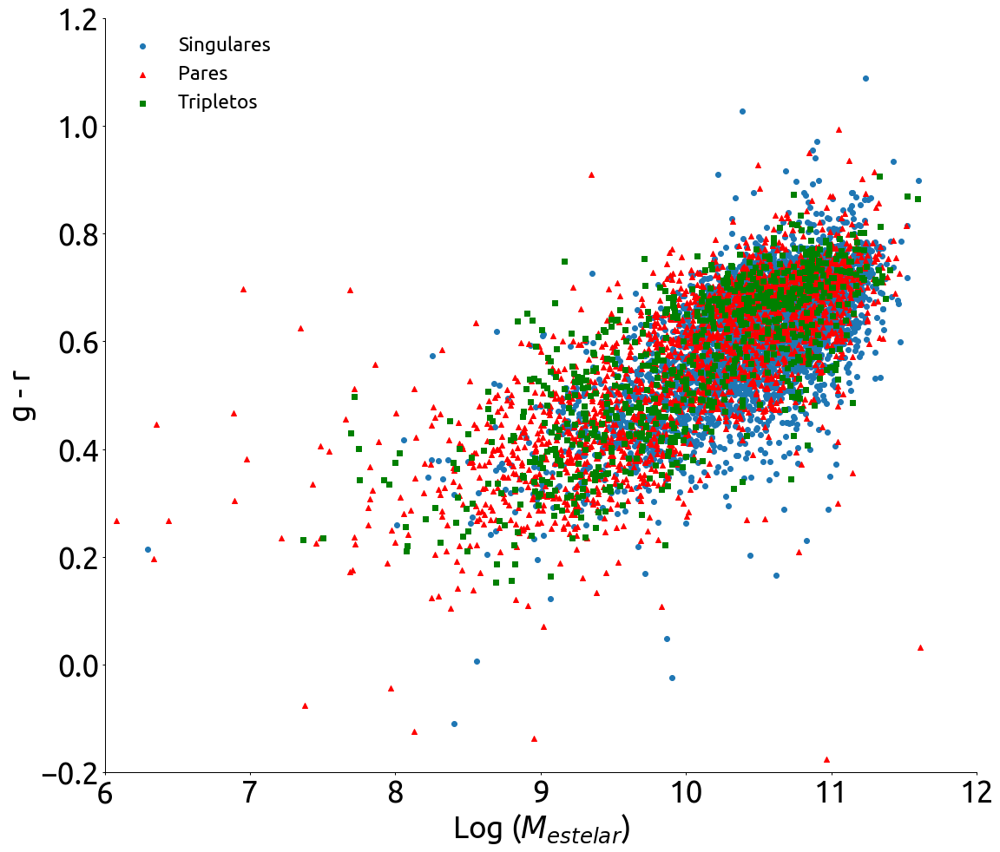

In [64]:
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

plt.figure()

plt.scatter(sig.lgm_tot_p50, sig.g_r)
plt.scatter(sip.lgm_tot_p50, sip.g_r, color = 'red', marker = '^') # scatter plot
plt.scatter(sit.lgm_tot_p50, sit.g_r, color = 'green', marker = 's') # scatter plot

plt.xlabel("Log ($M_{estelar}$)") 
plt.ylabel("g - r") 
plt.title("", fontweight='bold') 
plt.ylim(-0.2,1.2)
plt.xlim(6,12)

plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.legend(("Singulares", "Pares", "Tripletos"))

plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/M_vs_cor.png") # Saves the figure



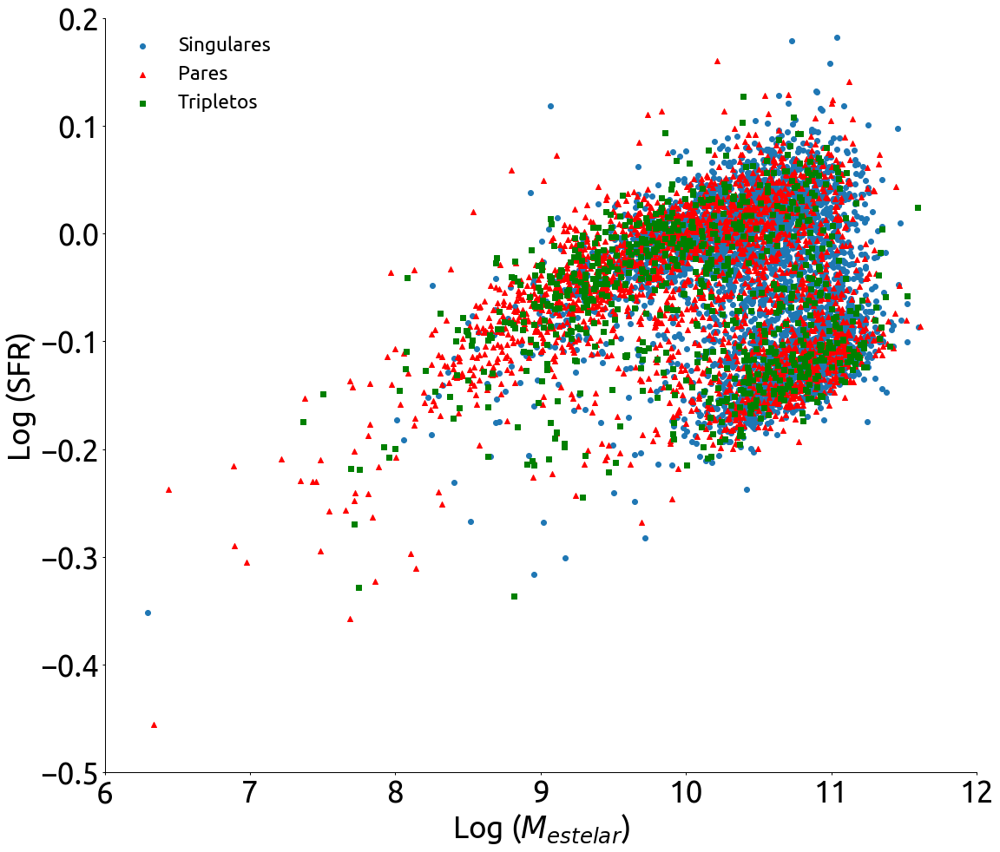

In [65]:
plt.figure()

plt.scatter(sig.lgm_tot_p50, sig.sfr_tot_p50/sig.lgm_tot_p50)
plt.scatter(sip.lgm_tot_p50, sip.sfr_tot_p50/sip.lgm_tot_p50, color = 'red', marker = '^') # scatter plot
plt.scatter(sit.lgm_tot_p50, sit.sfr_tot_p50/sit.lgm_tot_p50, color = 'green', marker = 's') # scatter plot

plt.xlabel("Log ($M_{estelar}$)") 
plt.ylabel("Log (SFR)") 
plt.title("", fontweight='bold') 
plt.ylim(-.5,.2)
plt.xlim(6,12)

plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.legend(("Singulares", "Pares", "Tripletos"), loc=2)

plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/M_vs_SFR.png") # Saves the figure



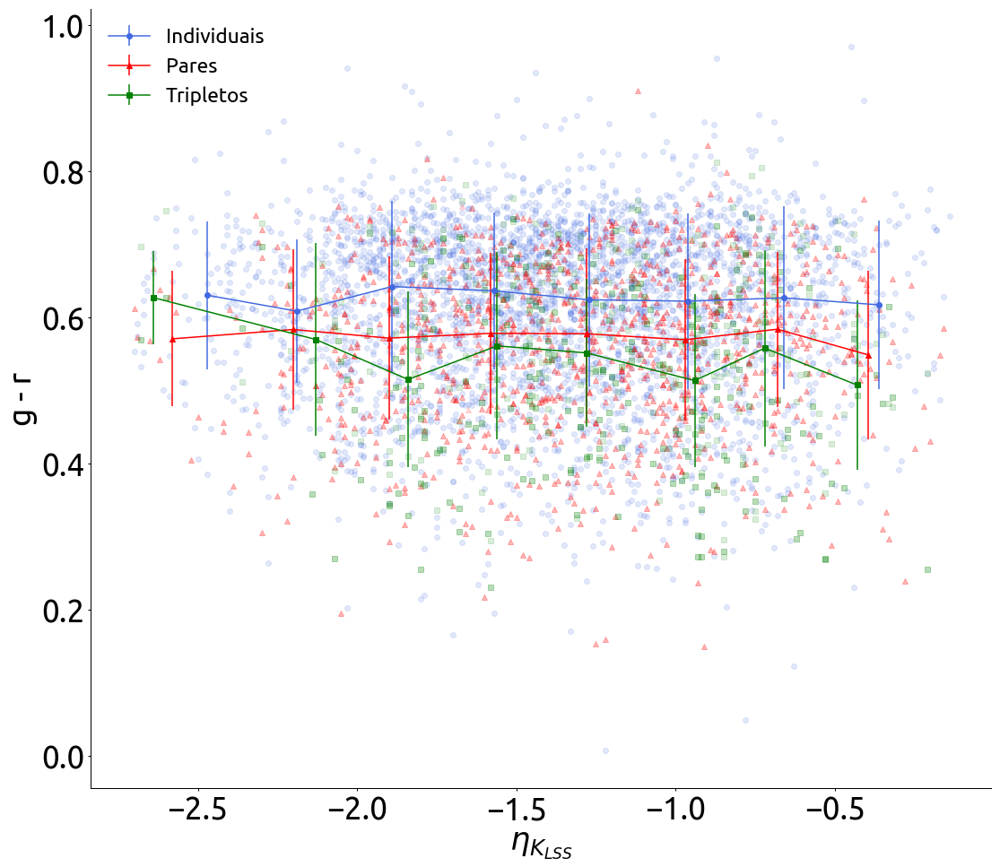

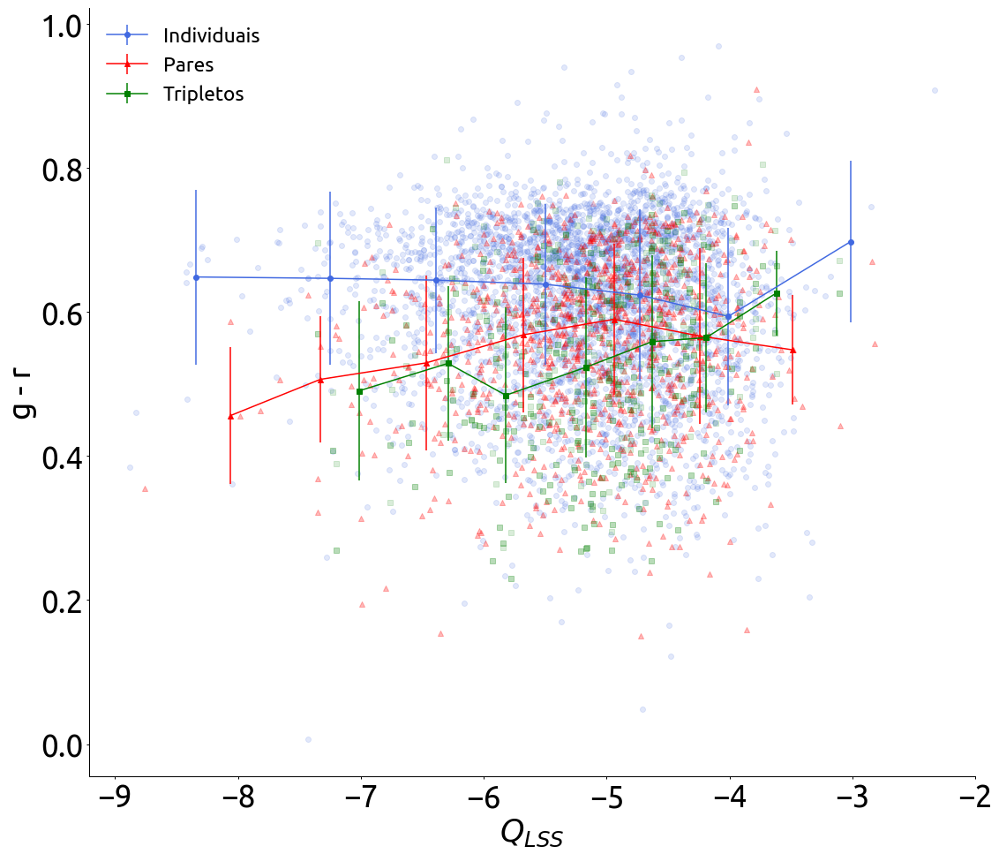

In [69]:
#USANDO A COR MÉIDA DOS PARES E TRIPLETOS
from scipy.stats import binned_statistic
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
sip = sip[sip.cor_media < 1]; sip = sip[sip.cor_media > 0]
sit = sit[sit.eta_k_LSS > -100]; sit = sit[sit.cor_media > 0]; sit = sit[sit.cor_media < 1]


plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
n_bins = 8
erro = []
y = [sig.g_r, sip.cor_media, sit.cor_media]
x = [sig.eta_k_LSS, sip.eta_k_LSS, sit.eta_k_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)

    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$\eta_{K_{LSS}}$")
plt.ylabel('g - r')
plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/eta/media_propriedades/eta(bins)_vs_cor.png')

###################################################################################################################

from scipy.stats import binned_statistic
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
sip = sip[sip.cor_media < 1]; sip = sip[sip.cor_media > 0]
sit = sit[sit.cor_media > 0]; sit = sit[sit.cor_media < 1]

n_bins = 7
plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
erro = []
y = [sig.g_r, sip.cor_media, sit.cor_media]
x = [sig.Q_LSS, sip.Q_LSS, sit.Q_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)
    
    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])    
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$Q_{LSS}$")
plt.ylabel('g - r')
plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/Q_LSS/media_propriedades/Qlss(bins)_vs_cor.png')

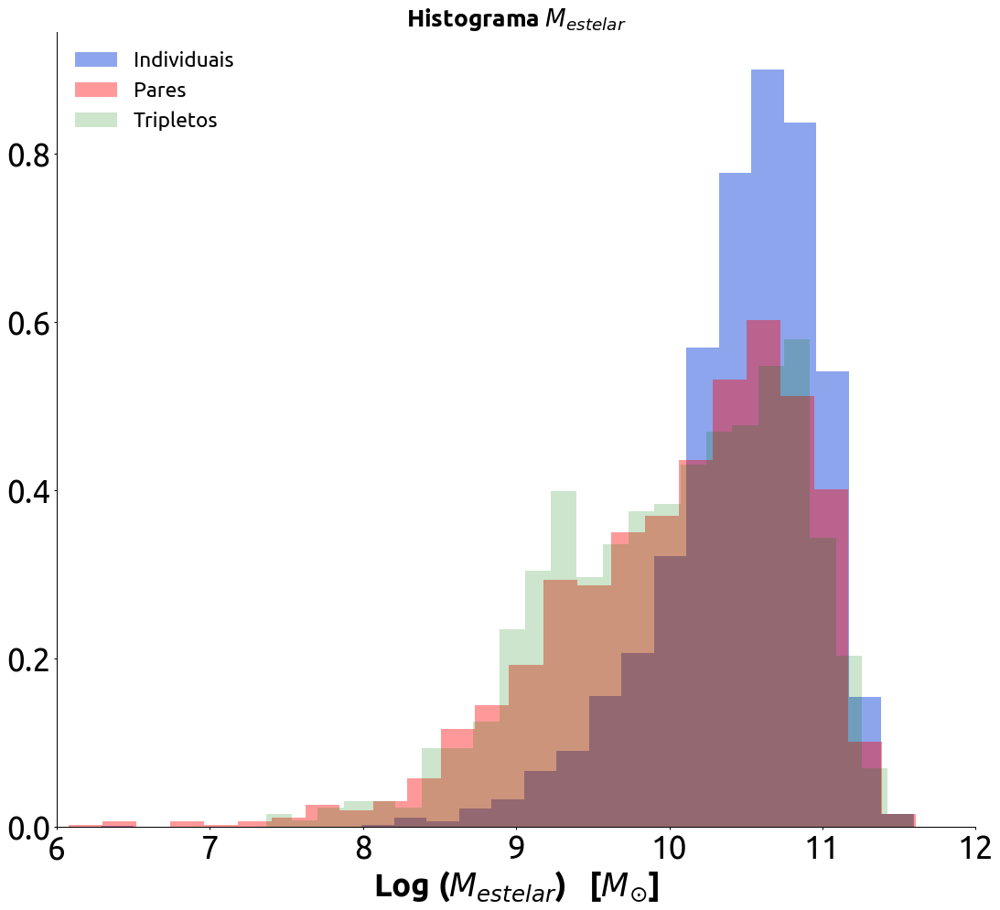

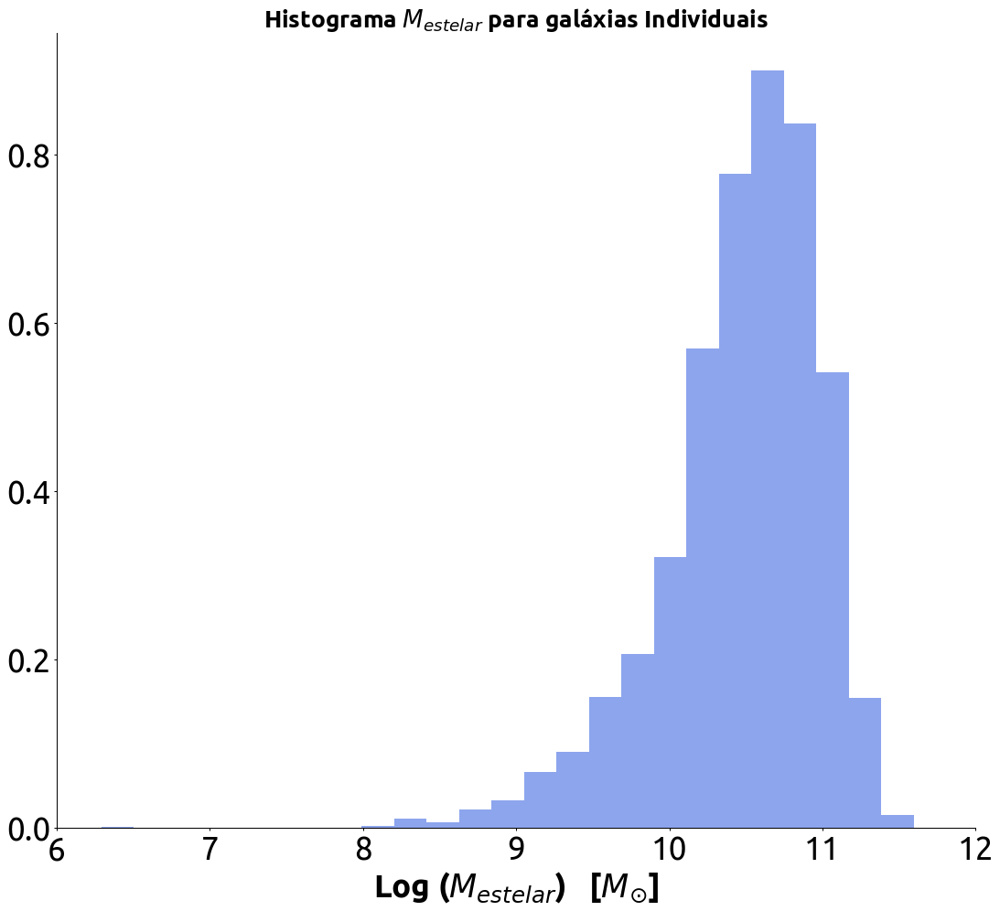

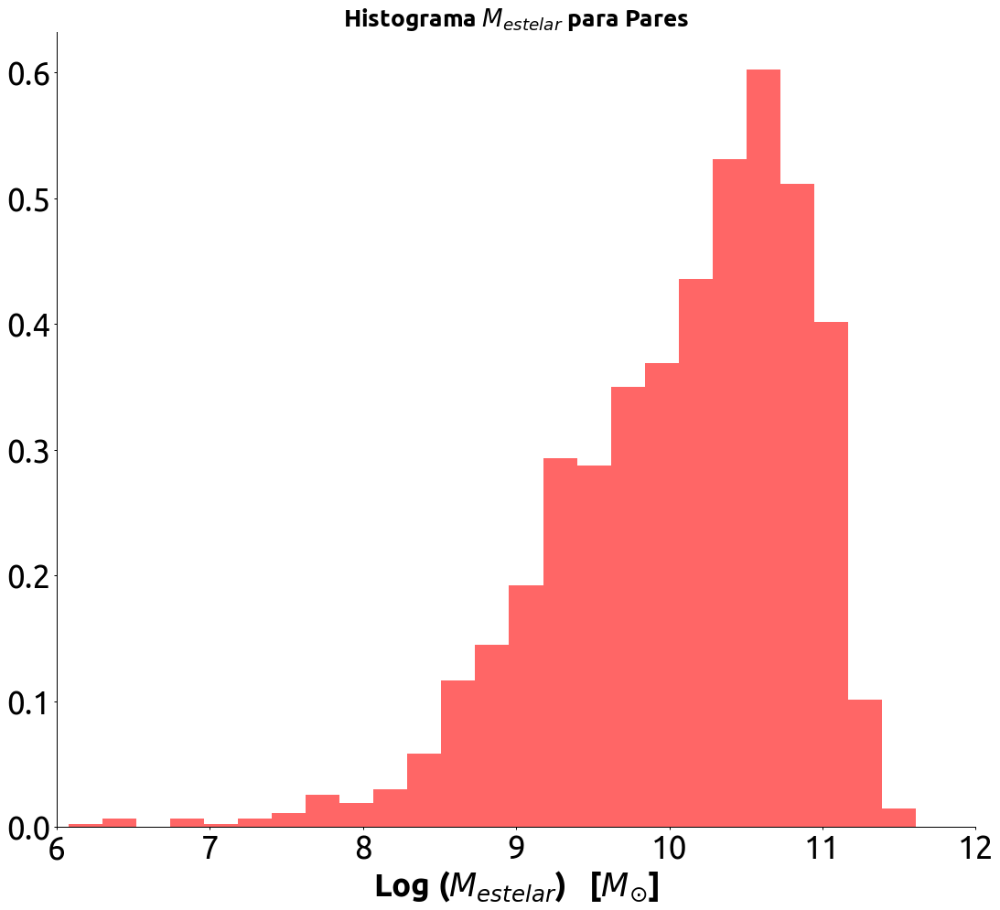

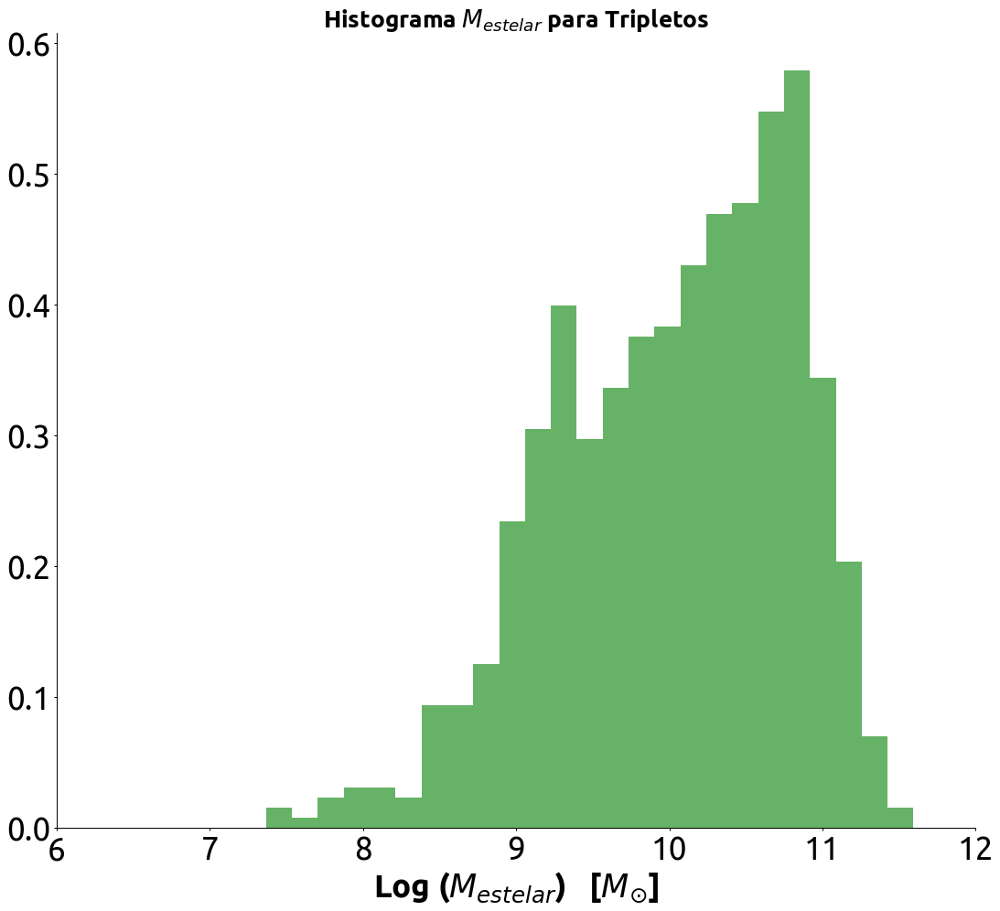

In [44]:
massa_1 = sig.lgm_tot_p50
massa_2 = sip.lgm_tot_p50
massa_3 = sit.lgm_tot_p50

# Plot the histogram para individuais, pares e tripletos
plt.figure()
plt.hist(massa_1, bins=25, density=True, alpha=0.6, color='royalblue')
plt.hist(massa_2, bins=25, density=True, alpha=0.4, color='red')
plt.hist(massa_3, bins=25, density=True, alpha=0.2, color='green')
plt.xlabel("Log ($M_{estelar}$)   [$M_{\\odot}$]", fontweight='bold')
plt.title("Histograma $M_{estelar}$", fontweight='bold')
plt.xlim(6, 12)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/hist_massas.png")



# Plot the histogram para individuais
plt.figure()
plt.hist(massa_1, bins=25, density=True, alpha=0.6, color='royalblue')
plt.xlabel("Log ($M_{estelar}$)   [$M_{\\odot}$]", fontweight='bold')
plt.title("Histograma $M_{estelar}$ para galáxias Individuais", fontweight='bold')
plt.xlim(6, 12)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/hist_massas(individuais).png")

# Plot the histogram para pares
plt.figure()
plt.hist(massa_2, bins=25, density=True, alpha=0.6, color='red')
plt.xlabel("Log ($M_{estelar}$)   [$M_{\\odot}$]", fontweight='bold')
plt.title("Histograma $M_{estelar}$ para Pares", fontweight='bold')
plt.xlim(6, 12)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/hist_massas(pares).png")

# Plot the histogram para tripletos
plt.figure()
plt.hist(massa_3, bins=25, density=True, alpha=0.6, color='green')
plt.xlabel("Log ($M_{estelar}$)   [$M_{\\odot}$]", fontweight='bold')
plt.title("Histograma $M_{estelar}$ para Tripletos", fontweight='bold')
plt.xlim(6, 12)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/hist_massas(tripletos).png")




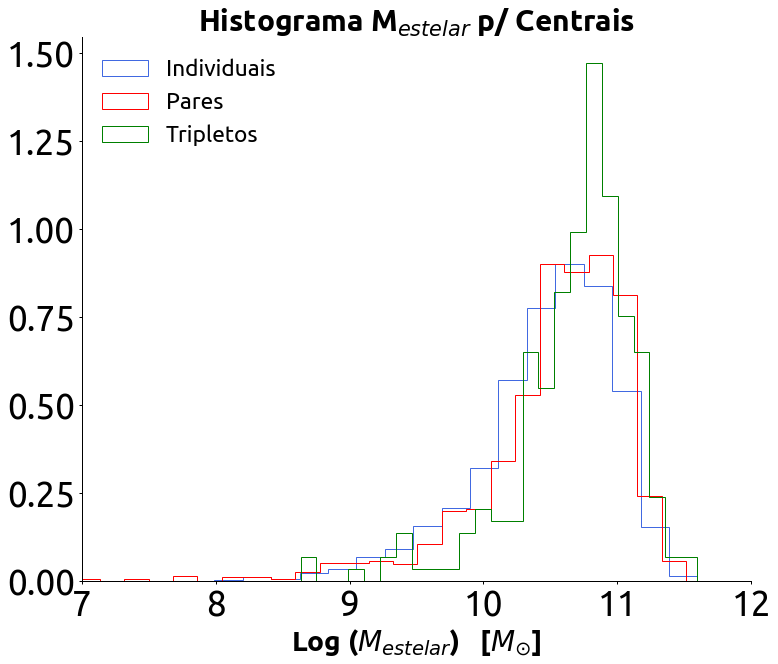

In [228]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]


massa_1 = sig.lgm_tot_p50
massa_2 = sip.lgm_tot_p50
massa_3 = sit.lgm_tot_p50

# Plot the histogram para individuais, pares e tripletos --> centrais
plt.figure()
plt.hist(massa_1, bins=25, density=True, alpha=1, color='royalblue', histtype = 'step')
plt.hist(massa_2, bins=25, density=True, alpha=1, color='red', histtype = 'step')
plt.hist(massa_3, bins=25, density=True, alpha=1, color='green', histtype = 'step')
plt.xlabel("Log ($M_{estelar}$)   [$M_{\\odot}$]", fontweight='bold')
plt.title("Histograma M$_{estelar}$ p/ Centrais", fontweight='bold')
plt.xlim(7, 12)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/hist_massas_centrais.png")


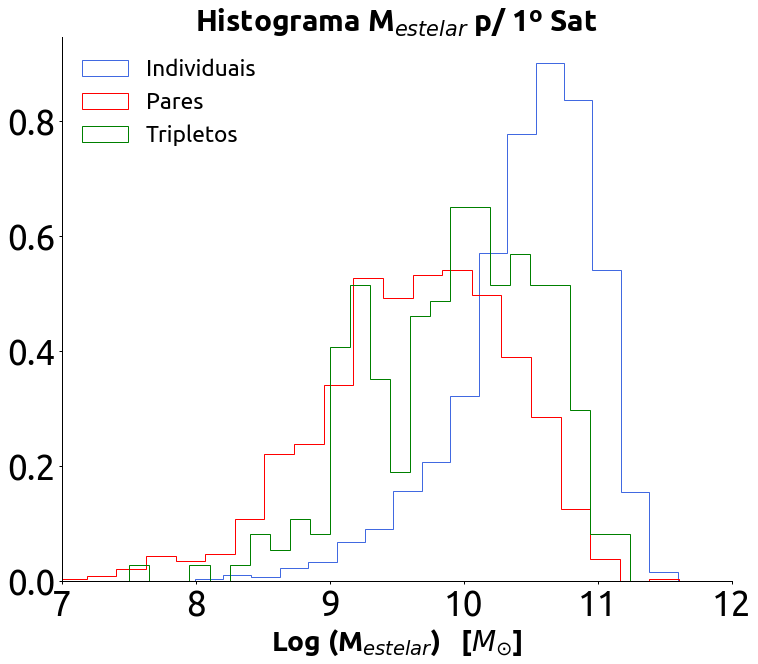

In [230]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 2]
sit = sit_1[sit_1.indice == 2]


massa_1 = sig.lgm_tot_p50
massa_2 = sip.lgm_tot_p50
massa_3 = sit.lgm_tot_p50

# Plot the histogram para individuais, pares e tripletos --> satélites
plt.figure()
plt.hist(massa_1, bins=25, density=True, alpha=1, color='royalblue', histtype = 'step')
plt.hist(massa_2, bins=25, density=True, alpha=1, color='red', histtype = 'step')
plt.hist(massa_3, bins=25, density=True, alpha=1, color='green', histtype = 'step')
plt.xlabel("Log (M$_{estelar}$)   [$M_{\\odot}$]", fontweight='bold')
plt.title("Histograma M$_{estelar}$ p/ 1º Sat", fontweight='bold')
plt.xlim(7, 12)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.rcParams['legend.loc'] = 'upper left'
plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/satelites/hist_massas_sat_1.png")


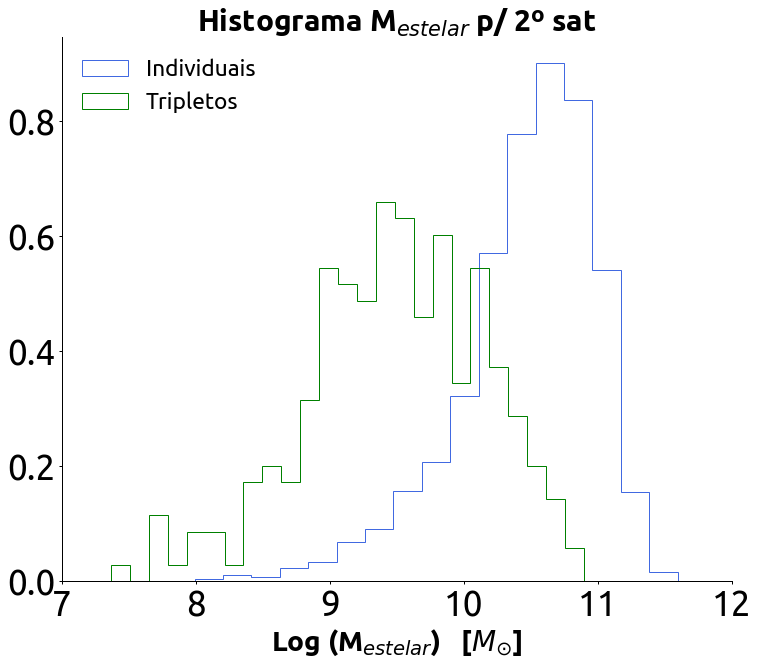

In [235]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sit = sit_1[sit_1.indice == 3]


massa_1 = sig.lgm_tot_p50
massa_3 = sit.lgm_tot_p50

# Plot the histogram para individuais, pares e tripletos --> satélites
plt.figure()
plt.hist(massa_1, bins=25, density=True, alpha=1, color='royalblue', histtype = 'step')
plt.hist(massa_3, bins=25, density=True, alpha=1, color='green', histtype = 'step')
plt.xlabel("Log (M$_{estelar}$)   [$M_{\\odot}$]", fontweight='bold')
plt.title("Histograma M$_{estelar}$ p/ 2º sat", fontweight='bold')
plt.xlim(7, 12)
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.rcParams['legend.loc'] = 'upper left'
plt.legend(('Individuais', 'Tripletos'))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/satelites/hist_massas_sat_2.png")


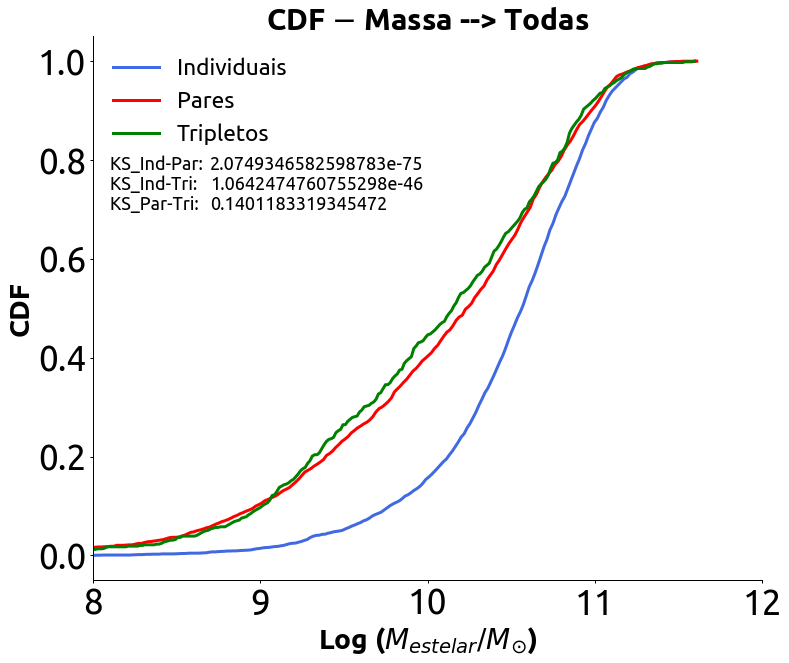

In [162]:
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

Z_1 = sig.lgm_tot_p50
Z_2 = sip.lgm_tot_p50
Z_3 = sit.lgm_tot_p50

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(8,12)

plt.xlabel("Log ($M_{estelar}/M_{\\odot}$)", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')
plt.title("CDF $-$ Massa --> Todas", fontweight='bold')
plt.legend(('Individuais', 'Pares', 'Tripletos'))

plt.text(8.1, 0.78, 'KS_Ind-Par: ', fontsize=18)
plt.text(8.7, 0.78, teste_12[1], fontsize=18)

plt.text(8.1, 0.74, 'KS_Ind-Tri: ', fontsize=18)
plt.text(8.7, 0.74, teste_13[1], fontsize=18)

plt.text(8.1, 0.7, 'KS_Par-Tri: ', fontsize=18)
plt.text(8.7, 0.7, teste_23[1], fontsize=18)

plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/todas_massas_cdf_massas.png')

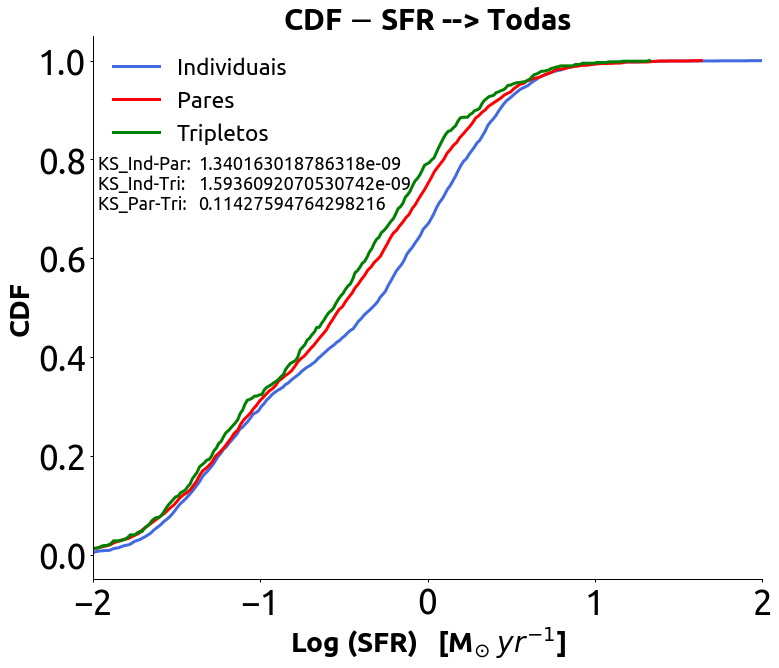

In [272]:
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

Z_1 = sig.sfr_tot_p50
Z_2 = sip.sfr_tot_p50
Z_3 = sit.sfr_tot_p50

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(-2, 2)
plt.xlabel("Log (SFR)   [M$_{\odot}$ $yr^{-1}$]", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')
plt.title("CDF $-$ SFR --> Todas", fontweight='bold')

plt.text(-1.97, 0.78, 'KS_Ind-Par: ', fontsize=18)
plt.text(-1.37, 0.78, teste_12[1], fontsize=18)

plt.text(-1.97, 0.74, 'KS_Ind-Tri: ', fontsize=18)
plt.text(-1.37, 0.74, teste_13[1], fontsize=18)

plt.text(-1.97, 0.7, 'KS_Par-Tri: ', fontsize=18)
plt.text(-1.37, 0.7, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/todas_massas_cdf_sfr.png')

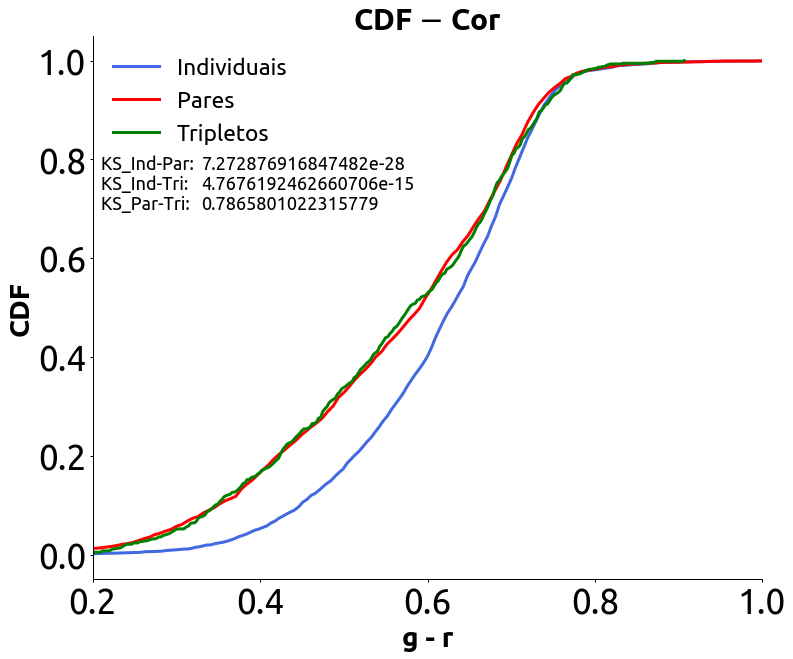

In [179]:
sig = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

Z_1 = sig.g_r; Z_1 = Z_1[Z_1 <2]
Z_2 = sip.g_r; Z_2 = Z_2[Z_2 <2]
Z_3 = sit.g_r; Z_3 = Z_3[Z_3 <2]

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(0.2,1)
plt.xlabel("g - r", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')
plt.title("CDF $-$ Cor", fontweight='bold')

plt.text(0.21, 0.78, 'KS_Ind-Par: ', fontsize=18)
plt.text(0.33, 0.78, teste_12[1], fontsize=18)

plt.text(0.21, 0.74, 'KS_Ind-Tri: ', fontsize=18)
plt.text(0.33, 0.74, teste_13[1], fontsize=18)

plt.text(0.21, 0.7, 'KS_Par-Tri: ', fontsize=18)
plt.text(0.33, 0.7, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/todas_massas_cdf_cor.png')

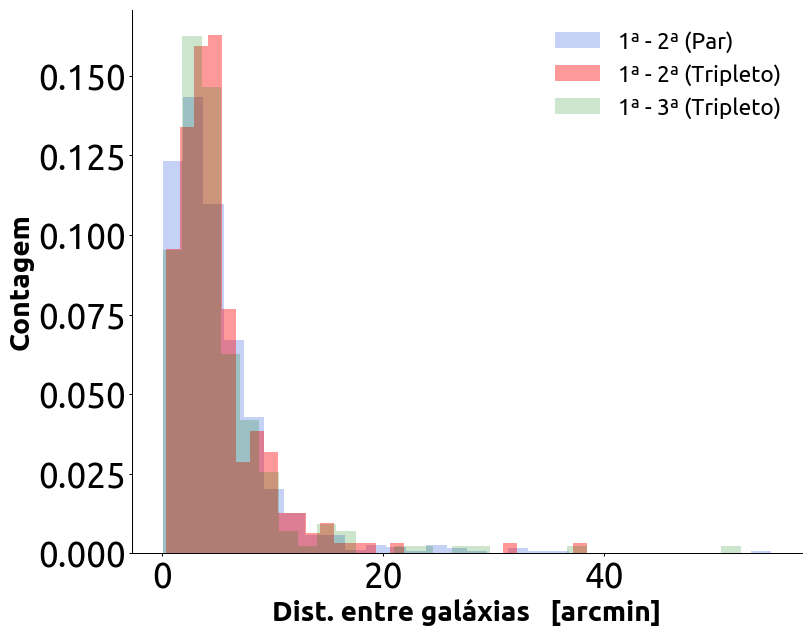

In [27]:
# Plot the histogram para as distâncias entre as galáxias centrais e suas companheiras
dist_1 = sip[sip.dist_first_to_sec_deg > 0.0]
dist_2 = sit[sit.dist_first_to_sec_deg > 0.0]
dist_3 = sit[sit.dist_first_to_third_deg > 0.0]

dist_1 = dist_1*60
dist_2 = dist_2*60
dist_3 = dist_3*60

plt.figure()
plt.hist(dist_1.dist_first_to_sec_deg, bins=30, density=True, alpha=0.3, color='royalblue')
plt.hist(dist_2.dist_first_to_sec_deg, bins=30, density=True, alpha=0.4, color='red')
plt.hist(dist_3.dist_first_to_third_deg, bins=30, density=True, alpha=0.2, color='green')


plt.xlabel("Dist. entre galáxias   [arcmin]", fontweight='bold')
plt.ylabel('Contagem', fontweight='bold')
plt.title("", fontweight='bold')
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(('1ª - 2ª (Par)', '1ª - 2ª (Tripleto)', '1ª - 3ª (Tripleto)'))
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/hist_dist_entre_gals.png")



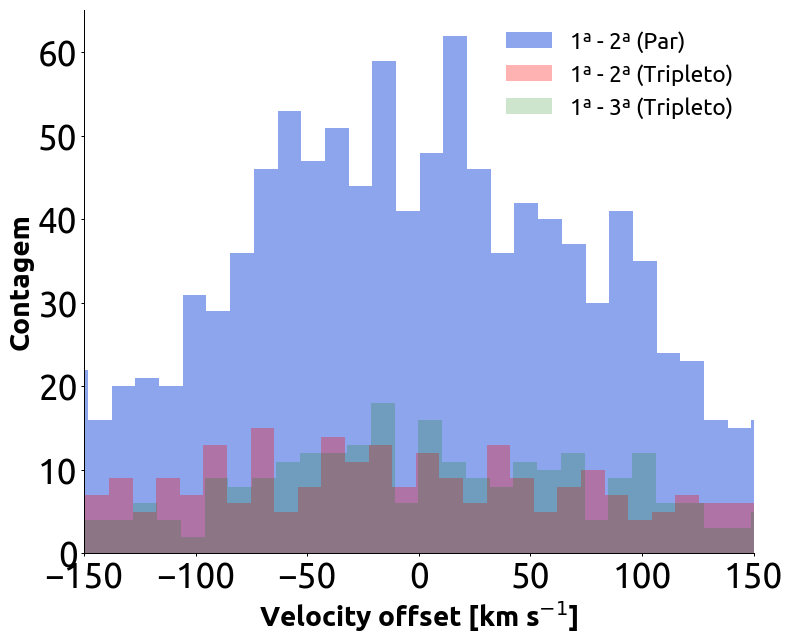

In [28]:
dist_1 = sip[sip.vel_offset != 0.0]
dist_2 = sit[sit.vel_offset_one_two != 0.0]
dist_3 = sit[sit.vel_offset_one_three != 0.0]
plt.figure()
plt.hist(dist_1.vel_offset, bins=30, density=False, alpha=0.6, color='royalblue')
plt.hist(dist_2.vel_offset_one_two, bins=30, density=False, alpha=0.3, color='red')
plt.hist(dist_3.vel_offset_one_three, bins=30, density=False, alpha=0.2, color='green')
plt.xlabel("Velocity offset [km s$^{-1}$]", fontweight='bold')
plt.ylabel("Contagem", fontweight='bold')
plt.legend(('1ª - 2ª (Par)', '1ª - 2ª (Tripleto)', '1ª - 3ª (Tripleto)'))
plt.xlim(-150, 150)

plt.title("", fontweight='bold')
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/todas_massas_velocity-offset_contagem.png')


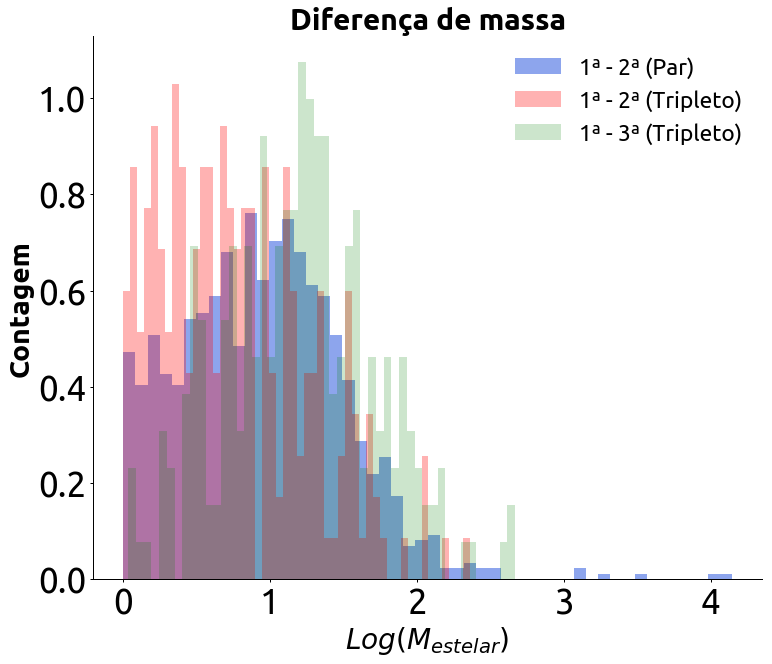

In [29]:
dist_1 = sip[sip.dif_mass != 0.0]
dist_2 = sit[sit.dif_mass_pri_to_sec != 0.0]
dist_3 = sit[sit.dif_mass_pri_to_ter != 0.0]
plt.figure()
plt.hist(abs(dist_1.dif_mass), bins=50, density=True, alpha=0.6, color='royalblue')
plt.hist(abs(dist_2.dif_mass_pri_to_sec), bins=50, density=True, alpha=0.3, color='red')
plt.hist(abs(dist_3.dif_mass_pri_to_ter), bins=50, density=True, alpha=0.2, color='green')
plt.xlabel("$Log (M_{estelar})$", fontweight='bold')
plt.ylabel("Contagem", fontweight='bold')
plt.legend(('1ª - 2ª (Par)', '1ª - 2ª (Tripleto)', '1ª - 3ª (Tripleto)'))
plt.title("Diferença de massa", fontweight='bold')
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
#plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/todas_massas_velocity-offset.png')

In [5]:
from astropy.cosmology import LambdaCDM as cdm


In [6]:
agn_sig = sig[sig.bptclass ==4]
agn_sig = agn_sig.sort_values(['lgm_tot_p50'])

agn_sip = sip[sip.bptclass ==4]
agn_sip = agn_sip.sort_values(['lgm_tot_p50'])

agn_sit = sit[sit.bptclass ==4]
agn_sit = agn_sit.sort_values(['lgm_tot_p50'])

fracao_total = [len(agn_sig)/len(sig.lgm_tot_p50), len(agn_sip)/len(sip.lgm_tot_p50), 
                len(agn_sit)/len(sit.lgm_tot_p50)]
fracao_total

[0.10810810810810811, 0.08022922636103152, 0.07017543859649122]

In [7]:
sig_1 = sig[sig.lgm_tot_p50 > 7.5]; sig_1 = sig_1[sig_1.lgm_tot_p50 <= 8.]
sig_2 = sig[sig.lgm_tot_p50 > 8.0]; sig_2 = sig_2[sig_2.lgm_tot_p50 <= 8.5]
sig_3 = sig[sig.lgm_tot_p50 > 8.5]; sig_3 = sig_3[sig_3.lgm_tot_p50 <= 9.]
sig_4 = sig[sig.lgm_tot_p50 > 9.]; sig_4 = sig_4[sig_4.lgm_tot_p50 <= 9.5]
sig_5 = sig[sig.lgm_tot_p50 > 9.5]; sig_5 = sig_5[sig_5.lgm_tot_p50 <= 10.]
sig_6 = sig[sig.lgm_tot_p50 > 10.]; sig_6 = sig_6[sig_6.lgm_tot_p50 <= 10.5]
sig_7 = sig[sig.lgm_tot_p50 > 10.5]; sig_7 = sig_7[sig_7.lgm_tot_p50 <= 11.]
sig_8 = sig[sig.lgm_tot_p50 > 11.]; sig_8 = sig_8[sig_8.lgm_tot_p50 <= 11.5]


b5 = agn_sig[agn_sig.lgm_tot_p50 > 9.5]; b5 = b5[b5.lgm_tot_p50 <= 10.]
b6 = agn_sig[agn_sig.lgm_tot_p50 > 10.]; b6 = b6[b6.lgm_tot_p50 <= 10.5]
b7 = agn_sig[agn_sig.lgm_tot_p50 > 10.5]; b7 = b7[b7.lgm_tot_p50 <= 11.]
b8 = agn_sig[agn_sig.lgm_tot_p50 > 11.]; b8 = b8[b8.lgm_tot_p50 <= 11.5]

fracao_sig = [0, 0/len(sig_2), 0/len(sig_3), 0/len(sig_4), len(b5)/len(sig_5),
               len(b6)/len(sig_6), len(b7)/len(sig_7), len(b8)/len(sig_8)]
fracao_sig


[0,
 0.0,
 0.0,
 0.0,
 0.013888888888888888,
 0.08794466403162056,
 0.13147138964577657,
 0.20334928229665072]

In [8]:
sip_1 = sip[sip.lgm_tot_p50 > 7.5]; sip_1 = sip_1[sip_1.lgm_tot_p50 <= 8.]
sip_2 = sip[sip.lgm_tot_p50 > 8.0]; sip_2 = sip_2[sip_2.lgm_tot_p50 <= 8.5]
sip_3 = sip[sip.lgm_tot_p50 > 8.5]; sip_3 = sip_3[sip_3.lgm_tot_p50 <= 9.]
sip_4 = sip[sip.lgm_tot_p50 > 9.]; sip_4 = sip_4[sip_4.lgm_tot_p50 <= 9.5]
sip_5 = sip[sip.lgm_tot_p50 > 9.5]; sip_5 = sip_5[sip_5.lgm_tot_p50 <= 10.]
sip_6 = sip[sip.lgm_tot_p50 > 10.]; sip_6 = sip_6[sip_6.lgm_tot_p50 <= 10.5]
sip_7 = sip[sip.lgm_tot_p50 > 10.5]; sip_7 = sip_7[sip_7.lgm_tot_p50 <= 11.]
sip_8 = sip[sip.lgm_tot_p50 > 11.]; sip_8 = sip_8[sip_8.lgm_tot_p50 <= 11.5]


b4 = agn_sip[agn_sip.lgm_tot_p50 > 9.]; b4 = b4[b4.lgm_tot_p50 <= 9.5]
b5 = agn_sip[agn_sip.lgm_tot_p50 > 9.5]; b5 = b5[b5.lgm_tot_p50 <= 10.]
b6 = agn_sip[agn_sip.lgm_tot_p50 > 10.]; b6 = b6[b6.lgm_tot_p50 <= 10.5]
b7 = agn_sip[agn_sip.lgm_tot_p50 > 10.5]; b7 = b7[b7.lgm_tot_p50 <= 11.]
b8 = agn_sip[agn_sip.lgm_tot_p50 > 11.]; b8 = b8[b8.lgm_tot_p50 <= 11.5]

fracao_sip = [0/len(sip_1), 0/len(sip_2), 0/len(sip_3), len(b4)/len(sip_4), len(b5)/len(sip_5),
               len(b6)/len(sip_6), len(b7)/len(sip_7), len(b8)/len(sip_8)]
fracao_sip

[0.0,
 0.0,
 0.0,
 0.0072992700729927005,
 0.020114942528735632,
 0.07676767676767676,
 0.14612676056338028,
 0.20105820105820105]

In [9]:
sit_1 = sit[sit.lgm_tot_p50 > 7.5]; sit_1 = sit_1[sit_1.lgm_tot_p50 <= 8.]
sit_2 = sit[sit.lgm_tot_p50 > 8.0]; sit_2 = sit_2[sit_2.lgm_tot_p50 <= 8.5]
sit_3 = sit[sit.lgm_tot_p50 > 8.5]; sit_3 = sit_3[sit_3.lgm_tot_p50 <= 9.]
sit_4 = sit[sit.lgm_tot_p50 > 9.]; sit_4 = sit_4[sit_4.lgm_tot_p50 <= 9.5]
sit_5 = sit[sit.lgm_tot_p50 > 9.5]; sit_5 = sit_5[sit_5.lgm_tot_p50 <= 10.]
sit_6 = sit[sit.lgm_tot_p50 > 10.]; sit_6 = sit_6[sit_6.lgm_tot_p50 <= 10.5]
sit_7 = sit[sit.lgm_tot_p50 > 10.5]; sit_7 = sit_7[sit_7.lgm_tot_p50 <= 11.]
sit_8 = sit[sit.lgm_tot_p50 > 11.]; sit_8 = sit_8[sit_8.lgm_tot_p50 <= 11.5]


#b4 = agn_sit[agn_sit.lgm_tot_p50 > 9.]; b4 = b4[b4.lgm_tot_p50 <= 9.5]
#b5 = agn_sit[agn_sit.lgm_tot_p50 > 9.5]; b5 = b5[b5.lgm_tot_p50 <= 10.]
b6 = agn_sit[agn_sit.lgm_tot_p50 > 10.]; b6 = b6[b6.lgm_tot_p50 <= 10.5]
b7 = agn_sit[agn_sit.lgm_tot_p50 > 10.5]; b7 = b7[b7.lgm_tot_p50 <= 11.]
b8 = agn_sit[agn_sit.lgm_tot_p50 > 11.]; b8 = b8[b8.lgm_tot_p50 <= 11.5]

fracao_sit = [0/len(sip_1), 0/len(sip_2), 0/len(sip_3), 0/len(sip_4), 0/len(sip_5),
               len(b6)/len(sip_6), len(b7)/len(sip_7), len(b8)/len(sip_8)]
fracao_sit

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.012121212121212121,
 0.058098591549295774,
 0.06878306878306878]

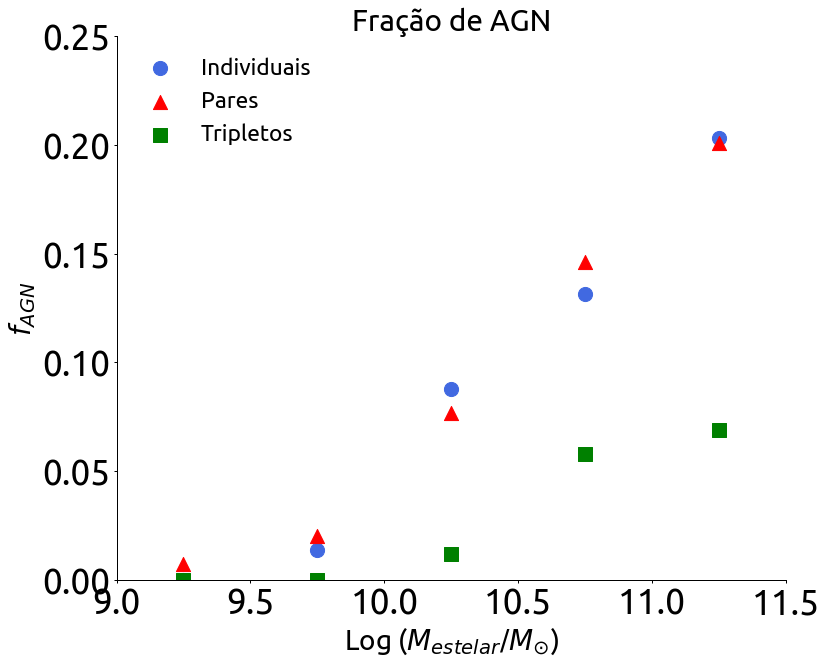

In [22]:
bins = [7.75, 8.25, 8.75, 9.25, 9.75, 10.25, 10.75, 11.25]
plt.scatter(bins, fracao_sig, color = 'royalblue', s = 200)
plt.scatter(bins, fracao_sip, color = 'red', marker = '^', s = 200)
plt.scatter(bins, fracao_sit, color = 'green', marker = 's', s= 200)

plt.xlim(9, 11.5)
plt.ylim(0,0.25)
plt.ylabel("$f_{AGN}$") 
plt.xlabel("Log ($M_{estelar}/M_{\odot}$)") 
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.title('Fração de AGN')
plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/frac-AGN_bin-massa.png")



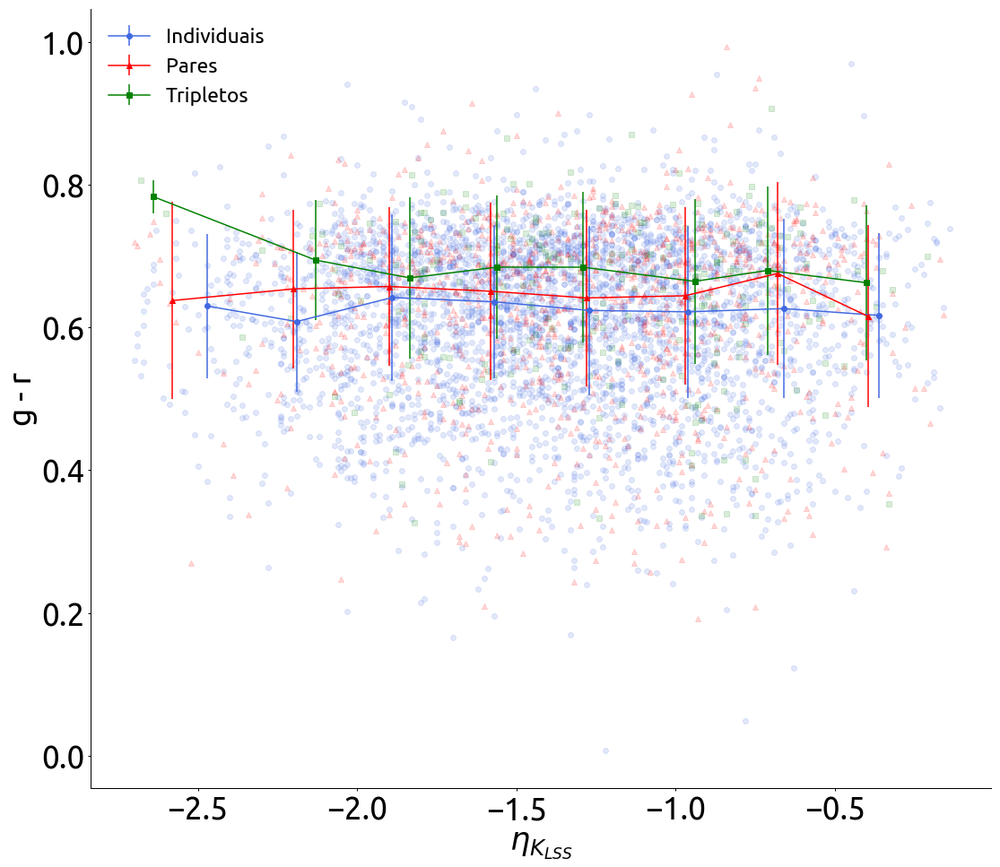

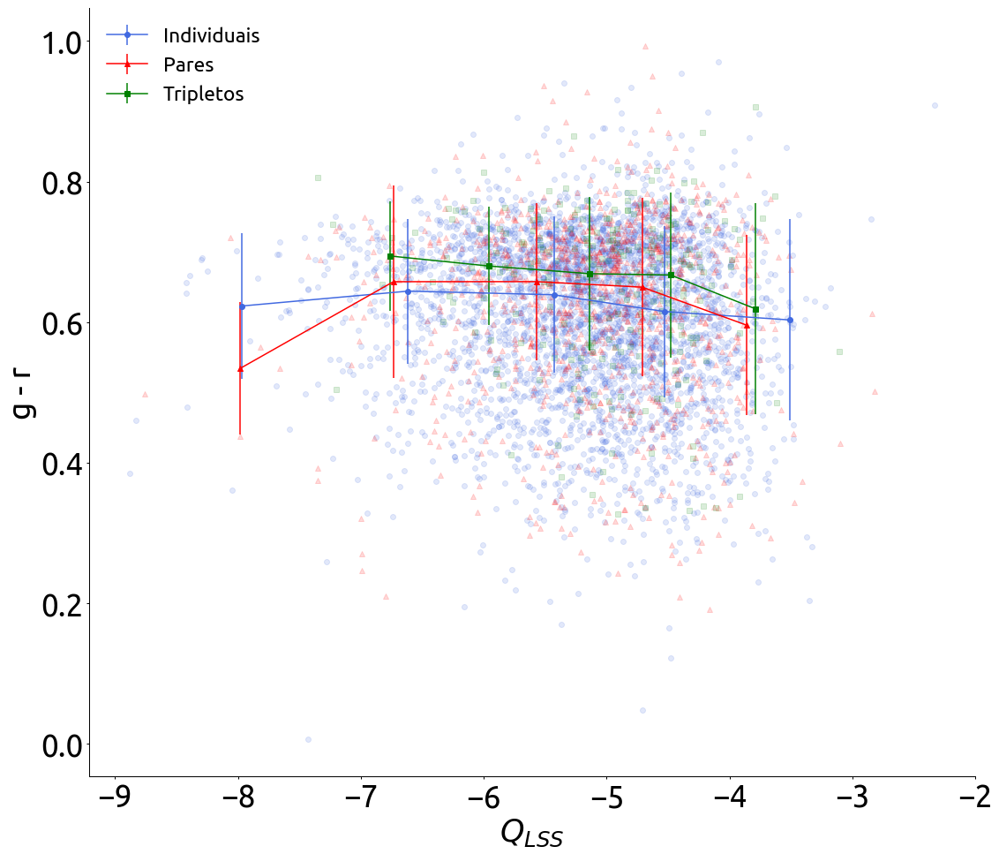

In [40]:
from scipy.stats import binned_statistic
sig_1 = pd.read_table("/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100];sit = sit[sit.g_r > 0]; sit = sit[sit.g_r < 1]
sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
sip = sip[sip.g_r < 1]; sip = sip[sip.g_r > 0]


plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
n_bins = 8
erro = []
y = [sig.g_r, sip.g_r, sit.g_r]
x = [sig.eta_k_LSS, sip.eta_k_LSS, sit.eta_k_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)

    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$\eta_{K_{LSS}}$")
plt.ylabel('g - r')
plt.savefig('/home/aline/Documents/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/cor_vs_eta-galaxias_centrais.png')

###################################################################################################################

from scipy.stats import binned_statistic
sig_1 = pd.read_table("/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100];sit = sit[sit.g_r > 0]; sit = sit[sit.g_r < 1]
sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
sip = sip[sip.g_r < 1]; sip = sip[sip.g_r > 0]

n_bins = 5
plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
erro = []
y = [sig.g_r, sip.g_r, sit.g_r]
x = [sig.Q_LSS, sip.Q_LSS, sit.Q_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)
    
    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])    
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$Q_{LSS}$")
plt.ylabel('g - r')
plt.savefig('/home/aline/Documents/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/cor_vs_Qlss-galaxias_centrais.png')

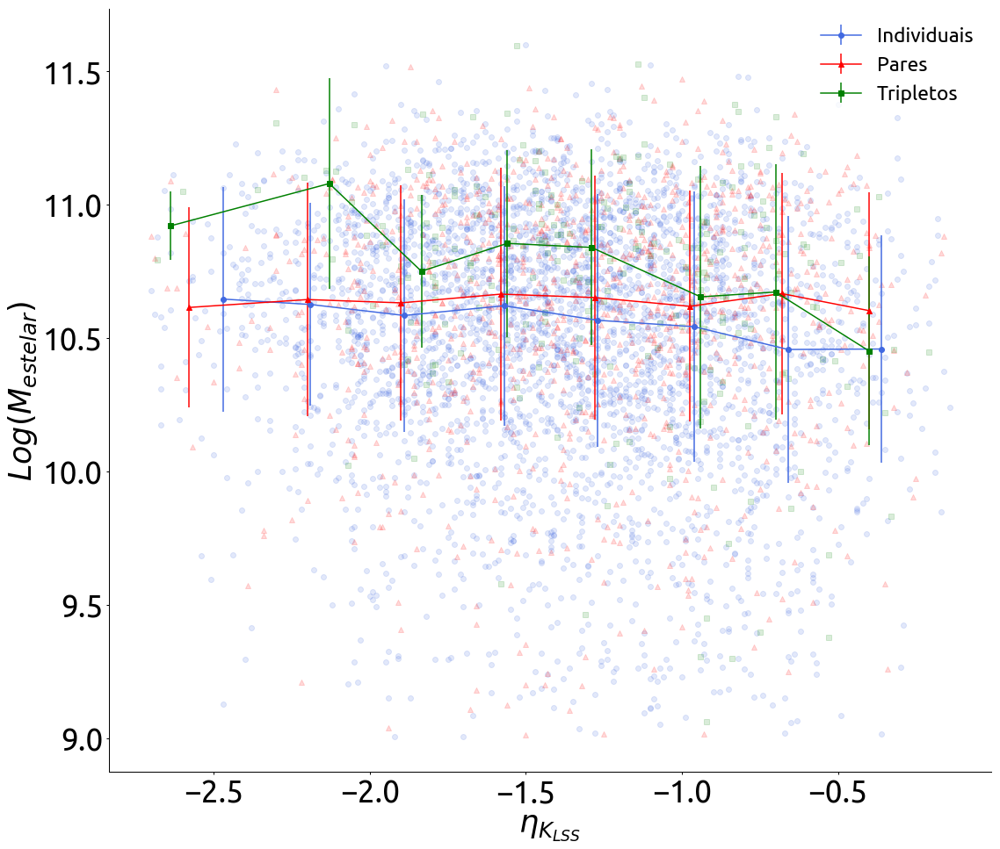

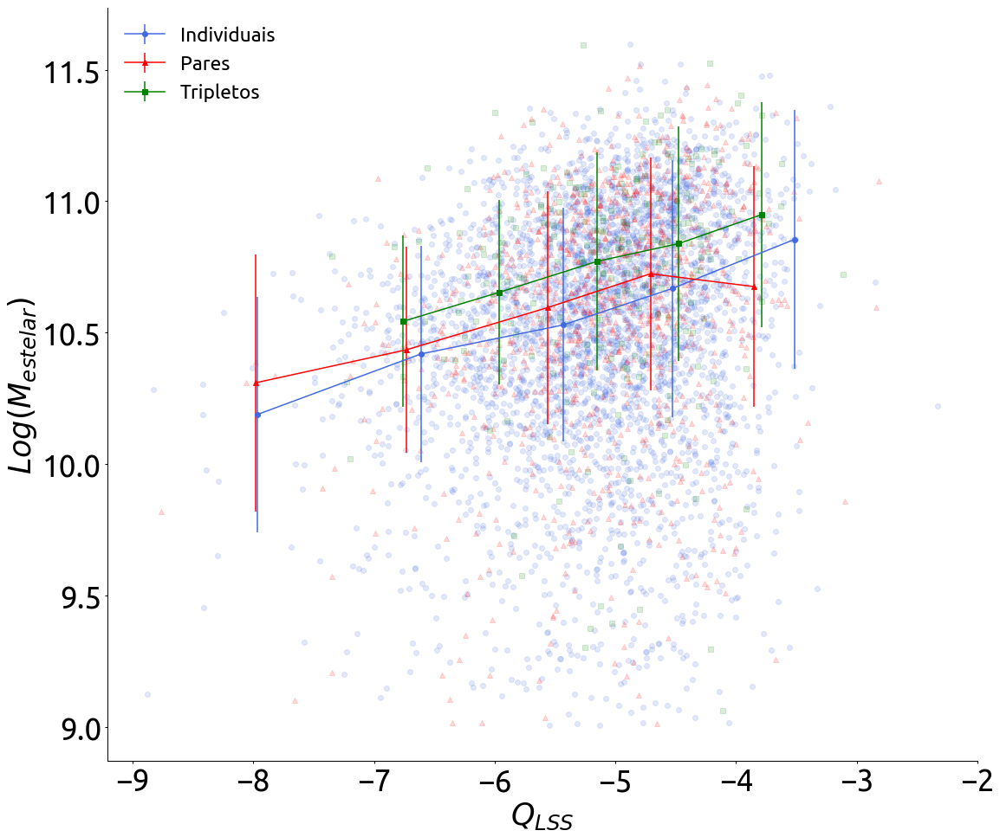

In [46]:
from scipy.stats import binned_statistic
sig_1 = pd.read_table("/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100]
#sit = sit[sit.g_r > 0]; sit = sit[sit.g_r < 1]
#sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
#sip = sip[sip.g_r < 1]; sip = sip[sip.g_r > 0]
sig = sig[sig.lgm_tot_p50 >= 9.0]
sip = sip[sip.lgm_tot_p50 >= 9.0]
sit = sit[sit.lgm_tot_p50 >= 9.0]


plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
n_bins = 8
erro = []
y = [sig.lgm_tot_p50, sip.lgm_tot_p50, sit.lgm_tot_p50]
x = [sig.eta_k_LSS, sip.eta_k_LSS, sit.eta_k_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)

    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$\eta_{K_{LSS}}$")
plt.ylabel('$Log(M_{estelar})$')
plt.savefig('/home/aline/Documents/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/massa_vs_eta-galaxias_centrais.png')

###################################################################################################################

from scipy.stats import binned_statistic
sig_1 = pd.read_table("/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100]
#sit = sit[sit.g_r > 0]; sit = sit[sit.g_r < 1]
#sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
#sip = sip[sip.g_r < 1]; sip = sip[sip.g_r > 0]
sig = sig[sig.lgm_tot_p50 >= 9.0]
sip = sip[sip.lgm_tot_p50 >= 9.0]
sit = sit[sit.lgm_tot_p50 >= 9.0]


plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
n_bins = 5
erro = []
y = [sig.lgm_tot_p50, sip.lgm_tot_p50, sit.lgm_tot_p50]
x = [sig.Q_LSS, sip.Q_LSS, sit.Q_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)
    
    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])    
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$Q_{LSS}$")
plt.ylabel('$Log(M_{estelar})$')
plt.savefig('/home/aline/Documents/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/massa_vs_Qlss-galaxias_centrais.png')

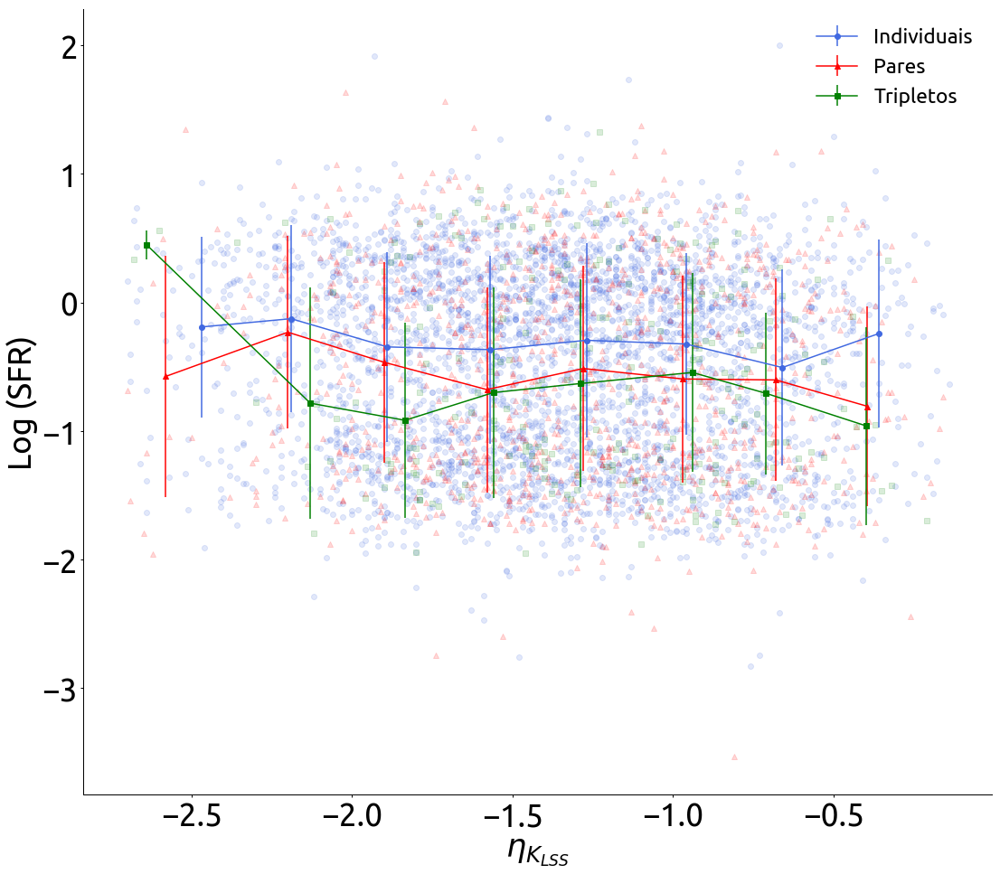

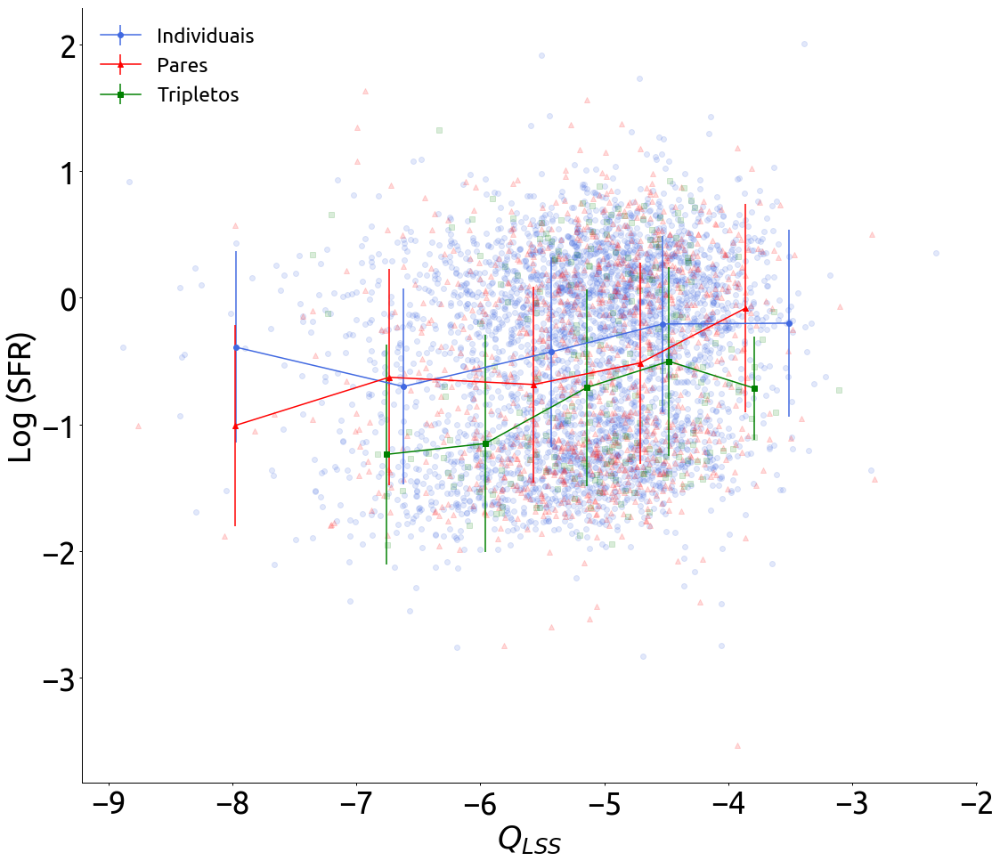

In [51]:
from scipy.stats import binned_statistic
sig_1 = pd.read_table("/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100]


plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
n_bins = 8
erro = []
y = [sig.sfr_tot_p50, sip.sfr_tot_p50, sit.sfr_tot_p50]
x = [sig.eta_k_LSS, sip.eta_k_LSS, sit.eta_k_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)

    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$\eta_{K_{LSS}}$")
plt.ylabel('Log (SFR)')
plt.savefig('/home/aline/Documents/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/SFR_vs_eta-galaxias_centrais.png')

###################################################################################################################

from scipy.stats import binned_statistic
sig_1 = pd.read_table("/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/aline/Documents/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100]

plt.figure()
cor = ['royalblue', 'red', 'green']
marcador = ['o','^', 's']
marcador_mediana = ["o-", "^-", "s-"]
legenda = ['Individual', 'Pares', 'Tripletos']
n_bins = 5
erro = []
y = [sig.sfr_tot_p50, sip.sfr_tot_p50, sit.sfr_tot_p50]
x = [sig.Q_LSS, sip.Q_LSS, sit.Q_LSS]

    
for i in range(len(x)):
    bin_centers, _, _ = binned_statistic(x[i], x[i],statistic='median',bins=n_bins)
    bin_averages, _, _ = binned_statistic(x[i], y[i],statistic='median',bins=n_bins)
    bin_stdevs, _, _ = binned_statistic(x[i], y[i],statistic='std',bins=n_bins)
    bin_means, bin_edges, binnumber = binned_statistic(x[i], y[i], 
                                                             statistic='median', bins=n_bins)
    
    plt.scatter(x[i], y[i], alpha=0.15, marker=marcador[i], color=cor[i])
    desvio = plt.errorbar(bin_centers, bin_averages, bin_stdevs,fmt=marcador_mediana[i], color=cor[i], 
                        label=legenda[i])    
    erro.append(desvio)
    plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
    plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
    #log_bins_for_x = np.logspace(np.log10(np.min(sip.eta_k_LSS)),np.log10(np.max(sip.eta_k_LSS)),num=n_bins)
    #bin_centers, _, _ = binned_statistic(sip.eta_k_LSS, sip.eta_k_LSS,statistic='mean',bins=log_bins_for_x)
    #bin_averages, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='mean',bins=log_bins_for_x)
    #bin_stdevs, _, _ = binned_statistic(sip.eta_k_LSS, y2,statistic='std',bins=log_bins_for_x)
plt.legend([erro[0], erro[1], erro[2]], ["Individuais", "Pares", "Tripletos"])
plt.xlabel("$Q_{LSS}$")
plt.ylabel('Log (SFR)')
plt.savefig('/home/aline/Documents/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/SFR_vs_Qlss-galaxias_centrais.png')

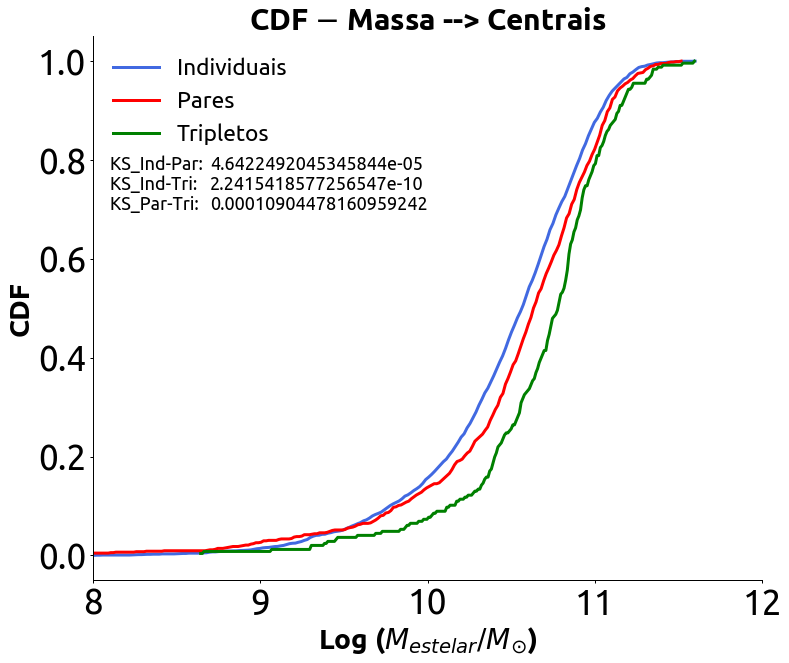

In [190]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.lgm_tot_p50
Z_2 = sip.lgm_tot_p50
Z_3 = sit.lgm_tot_p50

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(8,12)
plt.xlabel("Log ($M_{estelar}/M_{\\odot}$)", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')
plt.title("CDF $-$ Massa --> Centrais", fontweight='bold')

plt.text(8.1, 0.78, 'KS_Ind-Par: ', fontsize=18)
plt.text(8.7, 0.78, teste_12[1], fontsize=18)

plt.text(8.1, 0.74, 'KS_Ind-Tri: ', fontsize=18)
plt.text(8.7, 0.74, teste_13[1], fontsize=18)

plt.text(8.1, 0.7, 'KS_Par-Tri: ', fontsize=18)
plt.text(8.7, 0.7, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/cdf_massa-centrais.png')

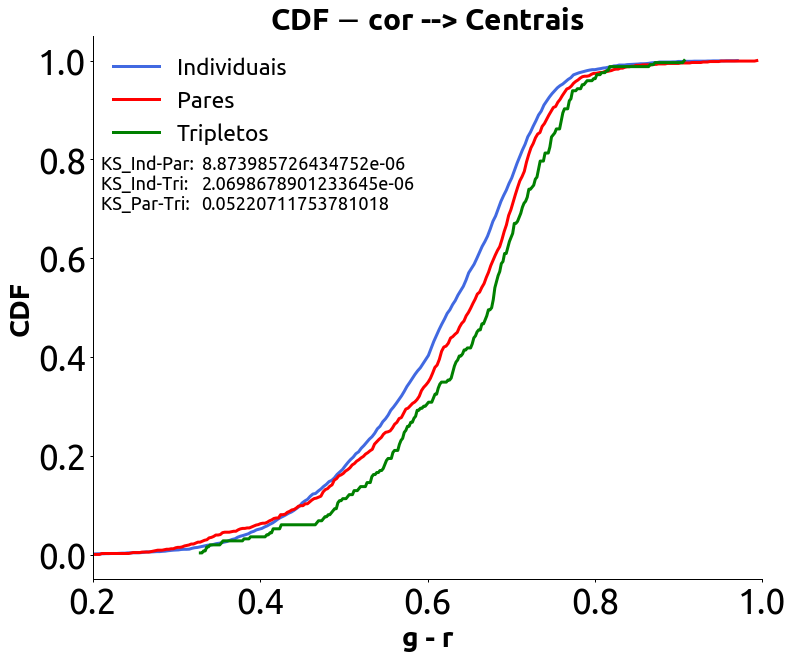

In [198]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.g_r > 0]; sit = sit[sit.g_r < 1]
sig = sig[sig.g_r < 1];sig = sig[sig.g_r > 0]
sip = sip[sip.g_r < 1]; sip = sip[sip.g_r > 0]
sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.g_r
Z_2 = sip.g_r
Z_3 = sit.g_r

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(0.2, 1)
plt.xlabel("g - r", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')
plt.title("CDF $-$ cor --> Centrais", fontweight='bold')

plt.text(0.21, 0.78, 'KS_Ind-Par: ', fontsize=18)
plt.text(0.33, 0.78, teste_12[1], fontsize=18)

plt.text(0.21, 0.74, 'KS_Ind-Tri: ', fontsize=18)
plt.text(0.33, 0.74, teste_13[1], fontsize=18)

plt.text(0.21, 0.7, 'KS_Par-Tri: ', fontsize=18)
plt.text(0.33, 0.7, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/cdf_cor-centrais.png')

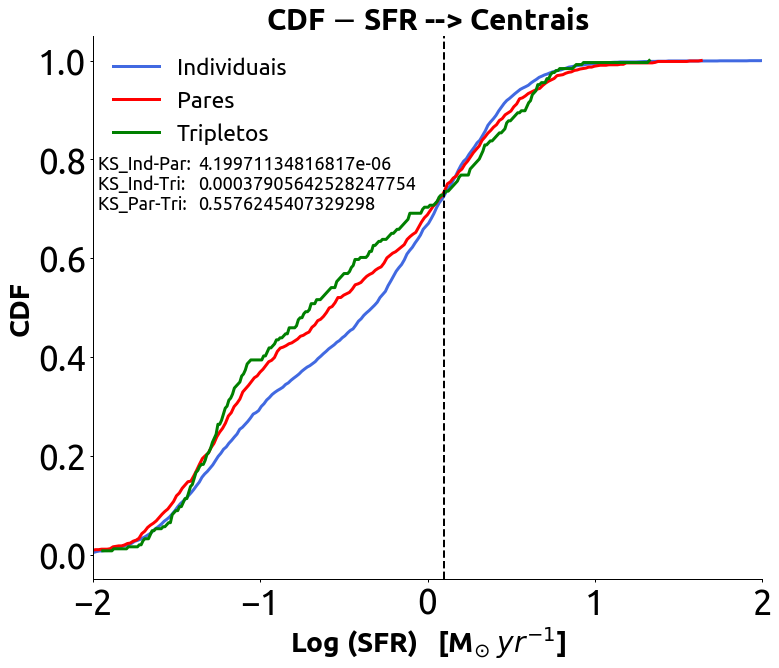

In [271]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.sfr_tot_p50
Z_2 = sip.sfr_tot_p50
Z_3 = sit.sfr_tot_p50

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(-2,2)
plt.xlabel("Log (SFR)   [M$_{\odot}$ $yr^{-1}$]", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')
plt.title("CDF $-$ SFR --> Centrais", fontweight='bold')
plt.axvline(x= 0.1, ymin=0, ymax=2, color='black', linewidth=2, linestyle='--')

plt.text(-1.97, 0.78, 'KS_Ind-Par: ', fontsize=18)
plt.text(-1.37, 0.78, teste_12[1], fontsize=18)

plt.text(-1.97, 0.74, 'KS_Ind-Tri: ', fontsize=18)
plt.text(-1.37, 0.74, teste_13[1], fontsize=18)

plt.text(-1.97, 0.7, 'KS_Par-Tri: ', fontsize=18)
plt.text(-1.37, 0.7, teste_23[1], fontsize=18)


plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/cdf_SFR-centrais.png')

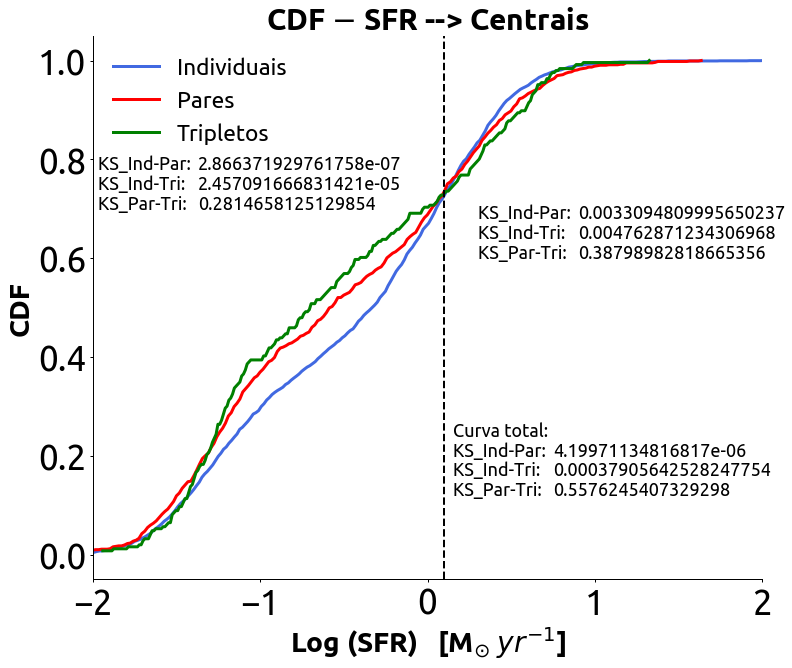

In [368]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]
sit = sit[sit.eta_k_LSS > -100]

#primeiro regime
sig_p = sig[sig.sfr_tot_p50 <= 0.1]
sip_p = sip[sip.sfr_tot_p50 <= 0.1]
sit_p = sit[sit.sfr_tot_p50 <= 0.1]

Z_1_p = sig_p.sfr_tot_p50
Z_2_p = sip_p.sfr_tot_p50
Z_3_p = sit_p.sfr_tot_p50

teste_12p = ks(Z_1_p, Z_2_p)
teste_13p = ks(Z_1_p, Z_3_p)
teste_23p = ks(Z_2_p, Z_3_p)

#segundo regime
sig_a = sig[sig.sfr_tot_p50 > 0.1]
sip_a = sip[sip.sfr_tot_p50 > 0.1]
sit_a = sit[sit.sfr_tot_p50 > 0.1]

Z_1_a = sig_a.sfr_tot_p50
Z_2_a = sip_a.sfr_tot_p50
Z_3_a = sit_a.sfr_tot_p50

teste_12a = ks(Z_1_a, Z_2_a)
teste_13a = ks(Z_1_a, Z_3_a)
teste_23a = ks(Z_2_a, Z_3_a)

#amostra total
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.sfr_tot_p50
Z_2 = sip.sfr_tot_p50
Z_3 = sit.sfr_tot_p50

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

#plot
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.sfr_tot_p50
Z_2 = sip.sfr_tot_p50
Z_3 = sit.sfr_tot_p50

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(-2,2)
plt.xlabel("Log (SFR)   [M$_{\odot}$ $yr^{-1}$]", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')
plt.title("CDF $-$ SFR --> Centrais", fontweight='bold')
plt.axvline(x= 0.1, ymin=0, ymax=2, color='black', linewidth=2, linestyle='--')

plt.text(-1.97, 0.78, 'KS_Ind-Par: ', fontsize=18); plt.text(0.3, 0.68, 'KS_Ind-Par: ', fontsize=18)
plt.text(-1.37, 0.78, teste_12p[1], fontsize=18); plt.text(0.9, 0.68, teste_12a[1], fontsize=18)

plt.text(-1.97, 0.74, 'KS_Ind-Tri: ', fontsize=18); plt.text(0.3, 0.64, 'KS_Ind-Tri: ', fontsize=18)
plt.text(-1.37, 0.74, teste_13p[1], fontsize=18); plt.text(0.9, 0.64, teste_13a[1], fontsize=18)

plt.text(-1.97, 0.7, 'KS_Par-Tri: ', fontsize=18); plt.text(0.3, 0.6, 'KS_Par-Tri: ', fontsize=18)
plt.text(-1.37, 0.7, teste_23p[1], fontsize=18); plt.text(0.9, 0.6, teste_23a[1], fontsize=18)


plt.text(0.15, 0.24, 'Curva total: ', fontsize=18)
plt.text(0.15, 0.2, 'KS_Ind-Par: ', fontsize=18)
plt.text(0.75, 0.2, teste_12[1], fontsize=18)

plt.text(0.15, 0.16, 'KS_Ind-Tri: ', fontsize=18)
plt.text(0.75, 0.16, teste_13[1], fontsize=18)

plt.text(0.15, .12, 'KS_Par-Tri: ', fontsize=18)
plt.text(0.75, .12, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/cdf_SFR-centrais_regimes.png')

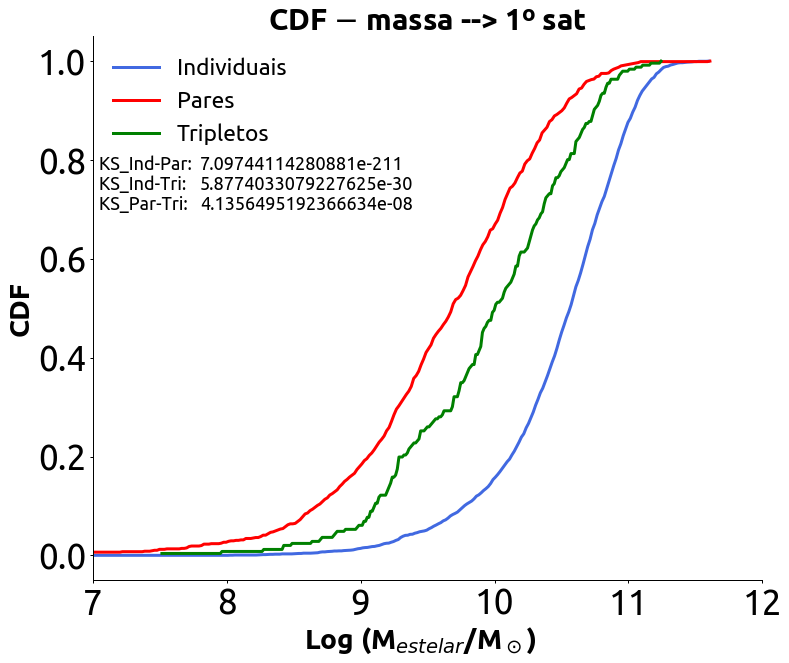

In [295]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 2]
sit = sit_1[sit_1.indice == 2]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.lgm_tot_p50
Z_2 = sip.lgm_tot_p50
Z_3 = sit.lgm_tot_p50

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(7,12)

plt.xlabel("Log (M$_{estelar}$/M$_\odot$)", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')

plt.title("CDF $-$ massa --> 1º sat", fontweight='bold')

plt.text(7.05, 0.78, 'KS_Ind-Par: ', fontsize=18)
plt.text(7.8, 0.78, teste_12[1], fontsize=18)

plt.text(7.05, 0.74, 'KS_Ind-Tri: ', fontsize=18)
plt.text(7.8, 0.74, teste_13[1], fontsize=18)

plt.text(7.05, 0.7, 'KS_Par-Tri: ', fontsize=18)
plt.text(7.8, 0.7, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/satelites/cdf_massa-sat_1.png')

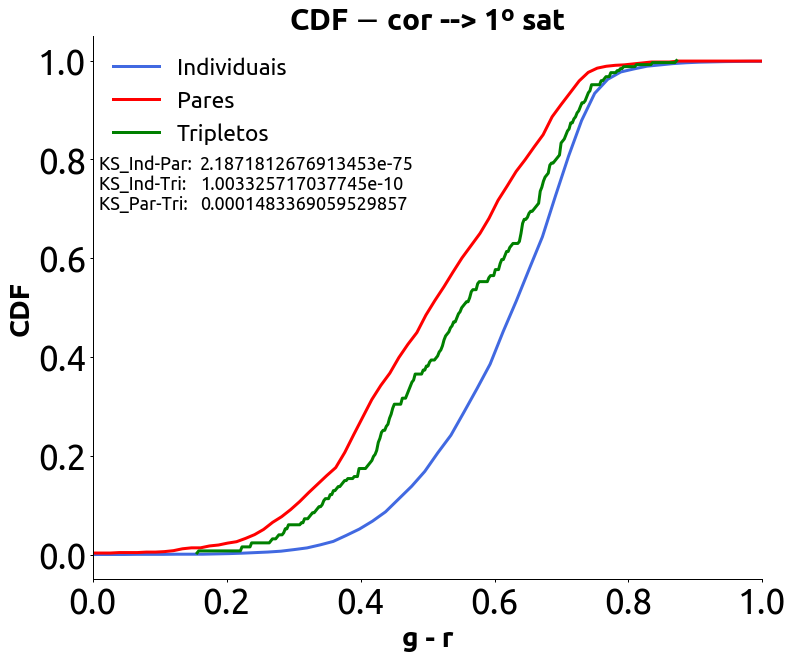

In [316]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 2]
sit = sit_1[sit_1.indice == 2]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.g_r
Z_2 = sip.g_r
Z_3 = sit.g_r

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(0,1)

plt.xlabel("g - r", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')

plt.title("CDF $-$ cor --> 1º sat", fontweight='bold')

plt.text(0.01, 0.78, 'KS_Ind-Par: ', fontsize=18)
plt.text(0.16, 0.78, teste_12[1], fontsize=18)

plt.text(0.01, 0.74, 'KS_Ind-Tri: ', fontsize=18)
plt.text(0.16, 0.74, teste_13[1], fontsize=18)

plt.text(0.01, 0.7, 'KS_Par-Tri: ', fontsize=18)
plt.text(0.16, 0.7, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/satelites/cdf_cor-sat_1.png')

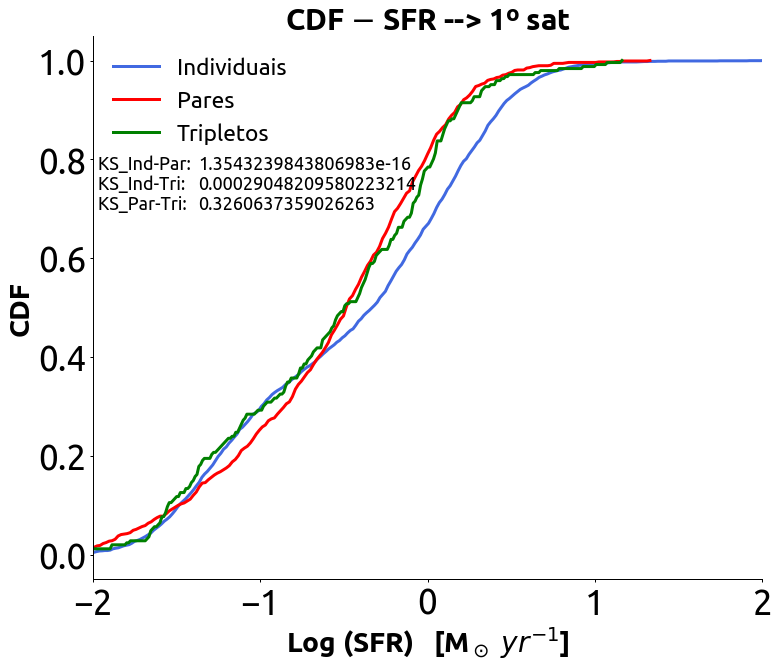

In [314]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 2]
sit = sit_1[sit_1.indice == 2]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.sfr_tot_p50
Z_2 = sip.sfr_tot_p50
Z_3 = sit.sfr_tot_p50

teste_12 = ks(Z_1, Z_2)
teste_13 = ks(Z_1, Z_3)
teste_23 = ks(Z_2, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
dx = X2[1] - X2[0]
F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(-2,2)

plt.xlabel("Log (SFR)   [M$_\odot$ $yr^{-1}$]", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')

plt.title("CDF $-$ SFR --> 1º sat", fontweight='bold')

plt.text(-1.97, 0.78, 'KS_Ind-Par: ', fontsize=18)
plt.text(-1.37, 0.78, teste_12[1], fontsize=18)

plt.text(-1.97, 0.74, 'KS_Ind-Tri: ', fontsize=18)
plt.text(-1.37, 0.74, teste_13[1], fontsize=18)

plt.text(-1.97, 0.7, 'KS_Par-Tri: ', fontsize=18)
plt.text(-1.37, 0.7, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/satelites/cdf_SFR-sat_1.png')

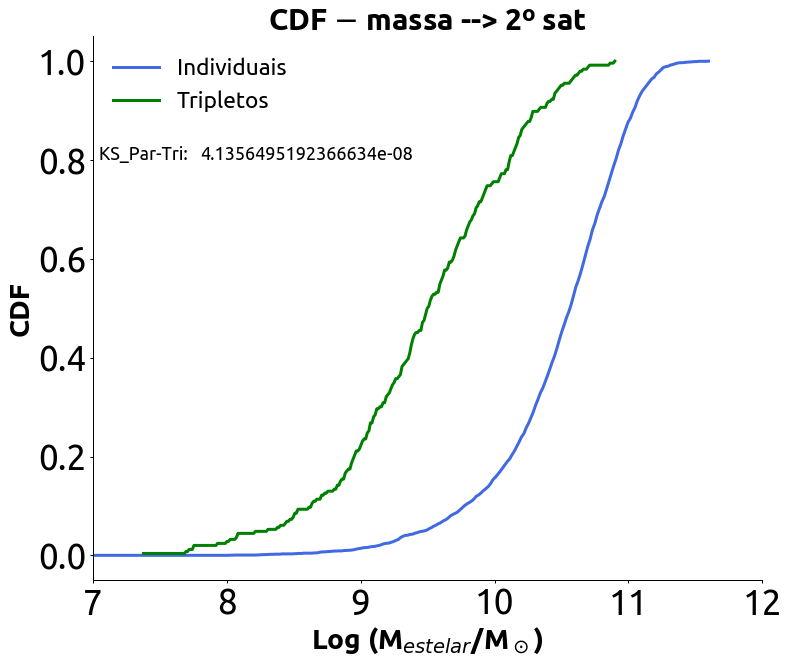

In [303]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
#sip = sip_1[sip_1.indice == 2]
sit = sit_1[sit_1.indice == 3]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.lgm_tot_p50
#Z_2 = sip.sfr_tot_p50
Z_3 = sit.lgm_tot_p50

teste_13 = ks(Z_1, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

#H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
#dx = X2[1] - X2[0]
#F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
#plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(7, 12)

plt.xlabel("Log (M$_{estelar}$/M$_\odot$)", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')

plt.title("CDF $-$ massa --> 2º sat", fontweight='bold')

plt.text(7.05, 0.8, 'KS_Par-Tri: ', fontsize=18)
plt.text(7.8, 0.8, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/satelites/cdf_massa-sat_2.png')

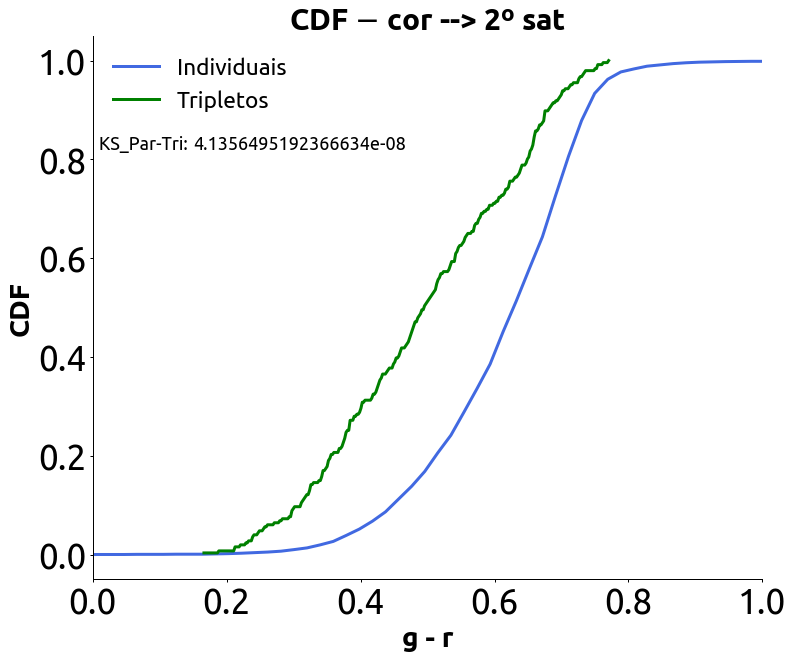

In [300]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
#sip = sip_1[sip_1.indice == 2]
sit = sit_1[sit_1.indice == 3]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.g_r
#Z_2 = sip.sfr_tot_p50
Z_3 = sit.g_r

teste_13 = ks(Z_1, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

#H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
#dx = X2[1] - X2[0]
#F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
#plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(0,1)

plt.xlabel("g - r", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')

plt.title("CDF $-$ cor --> 2º sat", fontweight='bold')

plt.text(0.01, 0.82, 'KS_Par-Tri: ', fontsize=18)
plt.text(0.15, 0.82, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/satelites/cdf_cor-sat_2.png')

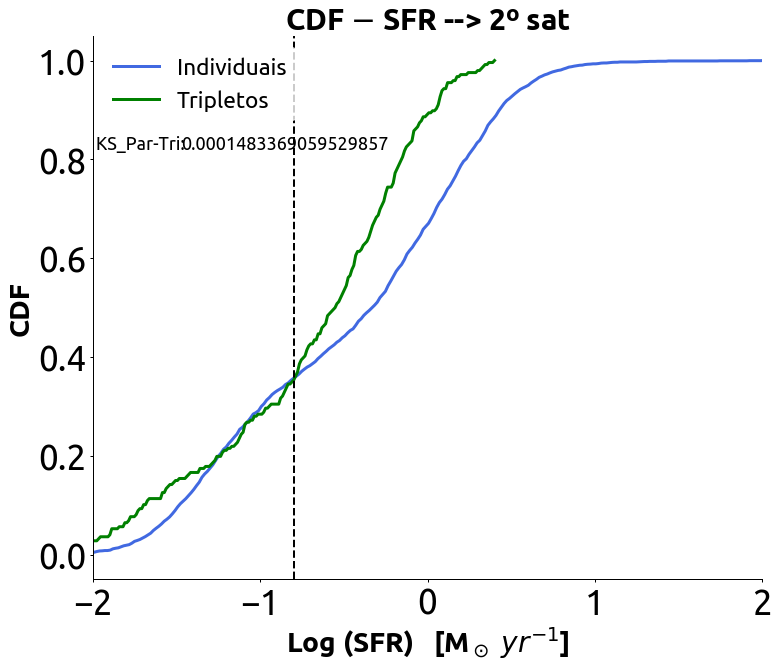

In [319]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
#sip = sip_1[sip_1.indice == 2]
sit = sit_1[sit_1.indice == 3]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.sfr_tot_p50
#Z_2 = sip.sfr_tot_p50
Z_3 = sit.sfr_tot_p50

teste_13 = ks(Z_1, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

#H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
#dx = X2[1] - X2[0]
#F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
#plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(-2,2)

plt.xlabel("Log (SFR)   [M$_\odot$ $yr^{-1}$]", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')

plt.title("CDF $-$ SFR --> 2º sat", fontweight='bold')
plt.axvline(x= -0.8, ymin=0, ymax=2, color='black', linewidth=2, linestyle='--')

plt.text(-1.98, 0.82, 'KS_Par-Tri: ', fontsize=18)
plt.text(-1.47, 0.82, teste_23[1], fontsize=18)

plt.legend(('Individuais', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/satelites/cdf_SFR-sat_2')

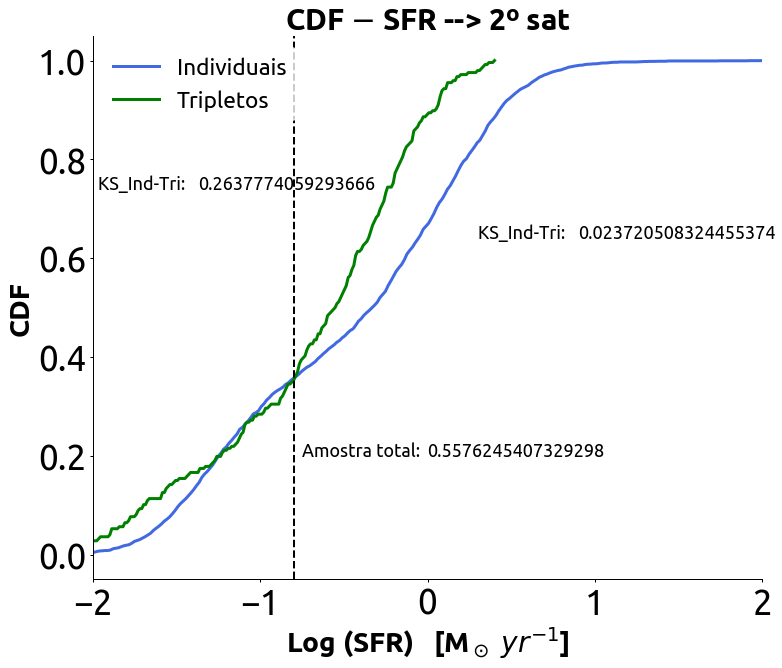

In [358]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]
sit = sit[sit.eta_k_LSS > -100]

#primeiro regime
sig_p = sig[sig.sfr_tot_p50 <= -0.8]
sip_p = sip[sip.sfr_tot_p50 <= -0.8]
sit_p = sit[sit.sfr_tot_p50 <= -0.8]

Z_1_p = sig_p.sfr_tot_p50
Z_2_p = sip_p.sfr_tot_p50
Z_3_p = sit_p.sfr_tot_p50

teste_12p = ks(Z_1_p, Z_2_p)
teste_13p = ks(Z_1_p, Z_3_p)
teste_23p = ks(Z_2_p, Z_3_p)

#segundo regime
sig_a = sig[sig.sfr_tot_p50 > -0.8]
sip_a = sip[sip.sfr_tot_p50 > -0.8]
sit_a = sit[sit.sfr_tot_p50 > -0.8]

Z_1_a = sig_a.sfr_tot_p50
Z_2_a = sip_a.sfr_tot_p50
Z_3_a = sit_a.sfr_tot_p50

teste_12a = ks(Z_1_a, Z_2_a)
teste_13a = ks(Z_1_a, Z_3_a)
teste_23a = ks(Z_2_a, Z_3_a)

sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
#sip = sip_1[sip_1.indice == 2]
sit = sit_1[sit_1.indice == 3]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.sfr_tot_p50
#Z_2 = sip.sfr_tot_p50
Z_3 = sit.sfr_tot_p50

teste_13 = ks(Z_1, Z_3)

sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
#sip = sip_1[sip_1.indice == 2]
sit = sit_1[sit_1.indice == 3]

sit = sit[sit.eta_k_LSS > -100]

Z_1 = sig.sfr_tot_p50
#Z_2 = sip.sfr_tot_p50
Z_3 = sit.sfr_tot_p50

teste_13 = ks(Z_1, Z_3)

# method 1
H_1,X1 = np.histogram( Z_1, bins = 300, normed = True)
dx = X1[1] - X1[0]
F1 = np.cumsum(H_1)*dx

#H_2,X2 = np.histogram( Z_2, bins = 300, normed = True)
#dx = X2[1] - X2[0]
#F2 = np.cumsum(H_2)*dx

H_3,X3 = np.histogram( Z_3, bins = 300, normed = True)
dx = X3[1] - X3[0]
F3 = np.cumsum(H_3)*dx

plt.plot(X1[1:], F1, color = 'royalblue',linewidth = 3)
#plt.plot(X2[1:], F2, color = 'red',linewidth = 3)
plt.plot(X3[1:], F3, color = 'green',linewidth = 3)
plt.xlim(-2,2)

plt.xlabel("Log (SFR)   [M$_\odot$ $yr^{-1}$]", fontweight='bold')
plt.ylabel("CDF", fontweight='bold')

plt.title("CDF $-$ SFR --> 2º sat", fontweight='bold')
plt.axvline(x= -0.8, ymin=0, ymax=2, color='black', linewidth=2, linestyle='--')

#plt.text(-1.97, 0.78, 'KS_Ind-Par: ', fontsize=18); plt.text(0.3, 0.68, 'KS_Ind-Par: ', fontsize=18)
#plt.text(-1.37, 0.78, teste_12p[1], fontsize=18); plt.text(0.9, 0.68, teste_12a[1], fontsize=18)

plt.text(-1.97, 0.74, 'KS_Ind-Tri: ', fontsize=18); plt.text(0.3, 0.64, 'KS_Ind-Tri: ', fontsize=18)
plt.text(-1.37, 0.74, teste_13p[1], fontsize=18); plt.text(0.9, 0.64, teste_13a[1], fontsize=18)

#plt.text(-1.97, 0.7, 'KS_Par-Tri: ', fontsize=18); plt.text(0.3, 0.6, 'KS_Par-Tri: ', fontsize=18)
#plt.text(-1.37, 0.7, teste_23p[1], fontsize=18); plt.text(0.9, 0.6, teste_23a[1], fontsize=18)

plt.text(-0.75, 0.2, 'Amostra total: ', fontsize=18)
plt.text(-0.0, 0.2, teste_23[1], fontsize=18)


plt.legend(('Individuais', 'Tripletos'))
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito

plt.savefig('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/satelites/cdf_SFR-sat_2-regimes.png')

In [113]:
from astropy.cosmology import LambdaCDM as cdm
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')

sig = sig_1
sip = sip_1[sip_1.indice == 1]
sit = sit_1[sit_1.indice == 1]

agn_sig = sig[sig.bptclass ==4]
agn_sig = agn_sig.sort_values(['lgm_tot_p50'])

agn_sip = sip[sip.bptclass ==4]
agn_sip = agn_sip.sort_values(['lgm_tot_p50'])

agn_sit = sit[sit.bptclass ==4]
agn_sit = agn_sit.sort_values(['lgm_tot_p50'])

fracao_total = [len(agn_sig)/len(sig.lgm_tot_p50), len(agn_sip)/len(sip.lgm_tot_p50), 
                len(agn_sit)/len(sit.lgm_tot_p50)]

fracao_total



[0.10810810810810811, 0.13276026743075453, 0.15789473684210525]

In [125]:
sig_1 = pd.read_table("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIG/SIG+SDSS.csv", sep=",")
sig = sig_1

sig_1 = sig[sig.lgm_tot_p50 > 7.5]; sig_1 = sig_1[sig_1.lgm_tot_p50 <= 8.]
sig_2 = sig[sig.lgm_tot_p50 > 8.0]; sig_2 = sig_2[sig_2.lgm_tot_p50 <= 8.5]
sig_3 = sig[sig.lgm_tot_p50 > 8.5]; sig_3 = sig_3[sig_3.lgm_tot_p50 <= 9.]
sig_4 = sig[sig.lgm_tot_p50 > 9.]; sig_4 = sig_4[sig_4.lgm_tot_p50 <= 9.5]
sig_5 = sig[sig.lgm_tot_p50 > 9.5]; sig_5 = sig_5[sig_5.lgm_tot_p50 <= 10.]
sig_6 = sig[sig.lgm_tot_p50 > 10.]; sig_6 = sig_6[sig_6.lgm_tot_p50 <= 10.5]
sig_7 = sig[sig.lgm_tot_p50 > 10.5]; sig_7 = sig_7[sig_7.lgm_tot_p50 <= 11.]
sig_8 = sig[sig.lgm_tot_p50 > 11.]; sig_8 = sig_8[sig_8.lgm_tot_p50 <= 11.5]

b1 = agn_sig[agn_sig.lgm_tot_p50 > 7.5]; b1 = b1[b1.lgm_tot_p50 <= 8.]
b2 = agn_sig[agn_sig.lgm_tot_p50 > 8.0]; b2 = b2[b2.lgm_tot_p50 <= 8.5]
b3 = agn_sig[agn_sig.lgm_tot_p50 > 8.5]; b3 = b3[b3.lgm_tot_p50 <= 9.]
b4 = agn_sig[agn_sig.lgm_tot_p50 > 9.0]; b4 = b4[b4.lgm_tot_p50 <= 9.5]
b5 = agn_sig[agn_sig.lgm_tot_p50 > 9.5]; b5 = b5[b5.lgm_tot_p50 <= 10.]
b6 = agn_sig[agn_sig.lgm_tot_p50 > 10.0]; b6 = b6[b6.lgm_tot_p50 <= 10.5]
b7 = agn_sig[agn_sig.lgm_tot_p50 > 10.5]; b7 = b7[b7.lgm_tot_p50 <= 11.]
b8 = agn_sig[agn_sig.lgm_tot_p50 > 11.0]; b8 = b8[b8.lgm_tot_p50 <= 11.5]

fracao_sig = [0, len(b2)/len(sig_2), len(b3)/len(sig_3), len(b4)/len(sig_4), len(b5)/len(sig_5),
               len(b6)/len(sig_6), len(b7)/len(sig_7), len(b8)/len(sig_8)]
fracao_sig


[0,
 0.0,
 0.0,
 0.0,
 0.013888888888888888,
 0.08794466403162056,
 0.13147138964577657,
 0.20334928229665072]

In [138]:
sip_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIP/SIP_3D_SDSS+SIP_environment+SDSS.csv')
sip = sip_1[sip_1.indice == 1]

sip_1 = sip[sip.lgm_tot_p50 > 7.5]; sip_1 = sip_1[sip_1.lgm_tot_p50 <= 8.]
sip_2 = sip[sip.lgm_tot_p50 > 8.0]; sip_2 = sip_2[sip_2.lgm_tot_p50 <= 8.5]
sip_3 = sip[sip.lgm_tot_p50 > 8.5]; sip_3 = sip_3[sip_3.lgm_tot_p50 <= 9.]
sip_4 = sip[sip.lgm_tot_p50 > 9.]; sip_4 = sip_4[sip_4.lgm_tot_p50 <= 9.5]
sip_5 = sip[sip.lgm_tot_p50 > 9.5]; sip_5 = sip_5[sip_5.lgm_tot_p50 <= 10.]
sip_6 = sip[sip.lgm_tot_p50 > 10.]; sip_6 = sip_6[sip_6.lgm_tot_p50 <= 10.5]
sip_7 = sip[sip.lgm_tot_p50 > 10.5]; sip_7 = sip_7[sip_7.lgm_tot_p50 <= 11.]
sip_8 = sip[sip.lgm_tot_p50 > 11.]; sip_8 = sip_8[sip_8.lgm_tot_p50 <= 11.5]

b1 = agn_sip[agn_sip.lgm_tot_p50 > 7.5]; b1 = b1[b1.lgm_tot_p50 <= 8.]
b2 = agn_sip[agn_sip.lgm_tot_p50 > 8.0]; b2 = b2[b2.lgm_tot_p50 <= 8.5]
b3 = agn_sip[agn_sip.lgm_tot_p50 > 8.5]; b3 = b3[b3.lgm_tot_p50 <= 9.]
b4 = agn_sip[agn_sip.lgm_tot_p50 > 9.]; b4 = b4[b4.lgm_tot_p50 <= 9.5]
b5 = agn_sip[agn_sip.lgm_tot_p50 > 9.5]; b5 = b5[b5.lgm_tot_p50 <= 10.]
b6 = agn_sip[agn_sip.lgm_tot_p50 > 10.]; b6 = b6[b6.lgm_tot_p50 <= 10.5]
b7 = agn_sip[agn_sip.lgm_tot_p50 > 10.5]; b7 = b7[b7.lgm_tot_p50 <= 11.]
b8 = agn_sip[agn_sip.lgm_tot_p50 > 11.]; b8 = b8[b8.lgm_tot_p50 <= 11.5]

fracao_sip = [len(b1)/len(sip_1), len(b2)/len(sip_2), len(b3)/len(sip_3), len(b4)/len(sip_4), len(b5)/len(sip_5),
               len(b6)/len(sip_6), len(b7)/len(sip_7), len(b8)/len(sip_8)]
fracao_sip


[0.0,
 0.0,
 0.0,
 0.0,
 0.045454545454545456,
 0.11952191235059761,
 0.14712153518123666,
 0.19672131147540983]

In [146]:
sit_1 = pd.read_csv('/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/tabelas_artigos/SIT/SIT_environment+SDSS.csv')
sit = sit_1[sit_1.indice == 1]

sit_1 = sit[sit.lgm_tot_p50 > 7.5]; sit_1 = sit_1[sit_1.lgm_tot_p50 <= 8.]
sit_2 = sit[sit.lgm_tot_p50 > 8.0]; sit_2 = sit_2[sit_2.lgm_tot_p50 <= 8.5]
sit_3 = sit[sit.lgm_tot_p50 > 8.5]; sit_3 = sit_3[sit_3.lgm_tot_p50 <= 9.]
sit_4 = sit[sit.lgm_tot_p50 > 9.]; sit_4 = sit_4[sit_4.lgm_tot_p50 <= 9.5]
sit_5 = sit[sit.lgm_tot_p50 > 9.5]; sit_5 = sit_5[sit_5.lgm_tot_p50 <= 10.]
sit_6 = sit[sit.lgm_tot_p50 > 10.]; sit_6 = sit_6[sit_6.lgm_tot_p50 <= 10.5]
sit_7 = sit[sit.lgm_tot_p50 > 10.5]; sit_7 = sit_7[sit_7.lgm_tot_p50 <= 11.]
sit_8 = sit[sit.lgm_tot_p50 > 11.]; sit_8 = sit_8[sit_8.lgm_tot_p50 <= 11.5]

b1 = agn_sit[agn_sit.lgm_tot_p50 > 7.5]; b1 = b1[b1.lgm_tot_p50 <= 8.]
b2 = agn_sit[agn_sit.lgm_tot_p50 > 8.0]; b2 = b2[b2.lgm_tot_p50 <= 8.5]
b3 = agn_sit[agn_sit.lgm_tot_p50 > 8.5]; b3 = b3[b3.lgm_tot_p50 <= 9.]
b4 = agn_sit[agn_sit.lgm_tot_p50 > 9.]; b4 = b4[b4.lgm_tot_p50 <= 9.5]
b5 = agn_sit[agn_sit.lgm_tot_p50 > 9.5]; b5 = b5[b5.lgm_tot_p50 <= 10.]
b6 = agn_sit[agn_sit.lgm_tot_p50 > 10.]; b6 = b6[b6.lgm_tot_p50 <= 10.5]
b7 = agn_sit[agn_sit.lgm_tot_p50 > 10.5]; b7 = b7[b7.lgm_tot_p50 <= 11.]
b8 = agn_sit[agn_sit.lgm_tot_p50 > 11.]; b8 = b8[b8.lgm_tot_p50 <= 11.5]

fracao_sit = [0/len(sip_1), 0/len(sip_2), len(b3)/len(sip_3), len(b4)/len(sip_4), len(b5)/len(sip_5),
               len(b6)/len(sip_6), len(b7)/len(sip_7), len(b8)/len(sip_8)]
fracao_sit

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.00796812749003984,
 0.053304904051172705,
 0.06557377049180328]

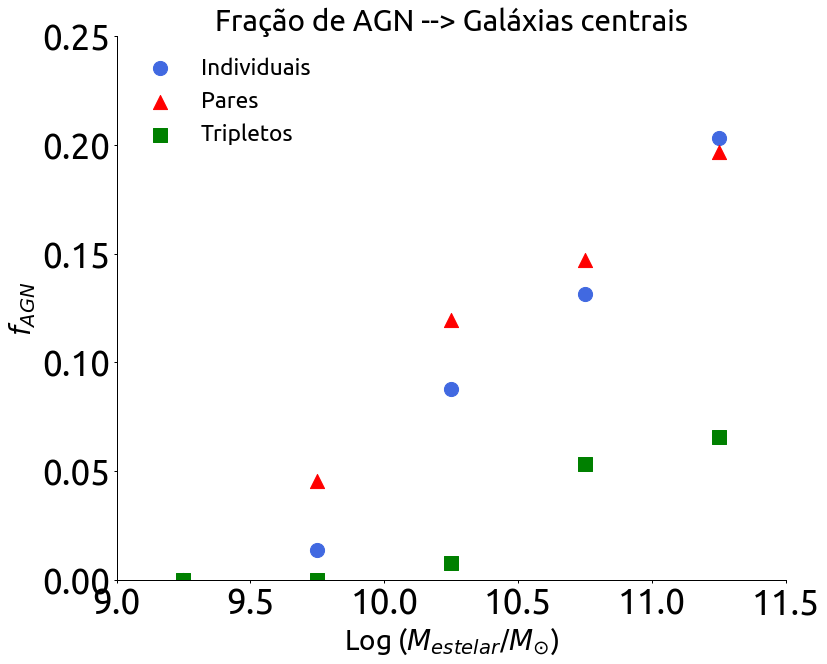

In [150]:
bins = [7.75, 8.25, 8.75, 9.25, 9.75, 10.25, 10.75, 11.25]
plt.scatter(bins, fracao_sig, color = 'royalblue', s = 200)
plt.scatter(bins, fracao_sip, color = 'red', marker = '^', s = 200)
plt.scatter(bins, fracao_sit, color = 'green', marker = 's', s= 200)

plt.xlim(9, 11.5)
plt.ylim(0,0.25)
plt.ylabel("$f_{AGN}$") 
plt.xlabel("Log ($M_{estelar}/M_{\odot}$)") 
plt.gca().spines["top"].set_visible(False) #apaga o "eixo" superior
plt.gca().spines["right"].set_visible(False) #apaga o "eixo" direito
plt.legend(('Individuais', 'Pares', 'Tripletos'))
plt.title('Fração de AGN --> Galáxias centrais')



plt.savefig("/home/douglas/Documentos/MEGA/Graduação/IC-Paulo/Pares_e_Tripletos/Graficos/Juntos/todas_massas/centrais/frac-AGN_centrais-bin-massa.png")

